# Loan Approval Dataset - Assignment 2

In this notebook, we work on a loan approval dataset.

We use this dataset for three machine learning tasks:

1. Regression
2. Binary Classification
3. Multiclass Classification

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

sns.set()

print(sklearn.__version__)

1.8.0


In [2]:
df = pd.read_csv("loan_data.csv")
df.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [3]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  str    
 2   person_education                45000 non-null  str    
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  str    
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  str    
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  45000 non-n

In [4]:
df.describe()

,person_age,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,loan_status
count,45000.000000,4.500000e+04,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000
mean,27.764178,8.031905e+04,5.410333,9583.157556,11.006606,0.139725,5.867489,632.608756,0.222222
std,6.045108,8.042250e+04,6.063532,6314.886691,2.978808,0.087212,3.879702,50.435865,0.415744
min,20.000000,8.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,390.000000,0.000000
25%,24.000000,4.720400e+04,1.000000,5000.000000,8.590000,0.070000,3.000000,601.000000,0.000000
50%,26.000000,6.704800e+04,4.000000,8000.000000,11.010000,0.120000,4.000000,640.000000,0.000000
75%,30.000000,9.578925e+04,8.000000,12237.250000,12.990000,0.190000,8.000000,670.000000,0.000000
max,144.000000,7.200766e+06,125.000000,35000.000000,20.000000,0.660000,30.000000,850.000000,1.000000


In [5]:
regression_target = "loan_amnt"
binary_target = "loan_status"
multiclass_target = "loan_intent"


In [6]:
df.duplicated().sum()

np.int64(0)

In [7]:
column_name = "person_income"

print("Shape before:", df.shape)

zero_count = (df[column_name] == 0).sum()
print("Number of zero values in", column_name, ":", zero_count)

df = df[df[column_name] != 0]
df = df.reset_index(drop=True)

print("Shape after:", df.shape)

Shape before: (45000, 14)
Number of zero values in person_income : 0
Shape after: (45000, 14)


In [8]:
column_name = "loan_amnt"

print("Shape before:", df.shape)

zero_count = (df[column_name] == 0).sum()
print("Number of zero values in", column_name, ":", zero_count)

df = df[df[column_name] != 0]
df = df.reset_index(drop=True)

print("Shape after:", df.shape)

Shape before: (45000, 14)
Number of zero values in loan_amnt : 0
Shape after: (45000, 14)


In [9]:
column_name = "credit_score"

print("Shape before:", df.shape)

zero_count = (df[column_name] == 0).sum()
print("Number of zero values in", column_name, ":", zero_count)

df = df[df[column_name] != 0]
df = df.reset_index(drop=True)

print("Shape after:", df.shape)

Shape before: (45000, 14)
Number of zero values in credit_score : 0
Shape after: (45000, 14)


In [10]:
df = df.drop_duplicates()

df = df.dropna()

df = df[df["person_age"].between(18, 100)]
df = df[df["person_income"] > 0]
df = df[df["loan_amnt"] > 0]
df = df[df["loan_int_rate"] > 0]

df = df.reset_index(drop=True)

print(df.shape)

(44993, 14)


# Simple EDA

We look at the target distributions.

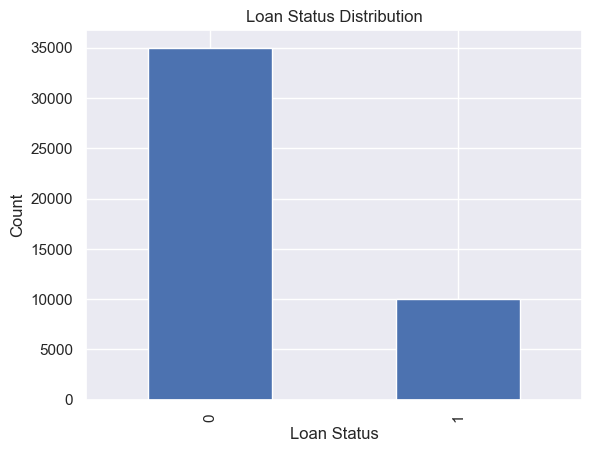

In [11]:
df[binary_target].value_counts().plot.bar()

plt.title("Loan Status Distribution")
plt.xlabel("Loan Status")
plt.ylabel("Count")
plt.show()

# Multiclass Target Distribution

Now we check the loan intent classes.

In [12]:
df[multiclass_target].value_counts()

loan_intent
EDUCATION            9151
MEDICAL              8548
VENTURE              7815
PERSONAL             7551
DEBTCONSOLIDATION    7145
HOMEIMPROVEMENT      4783
Name: count, dtype: int64

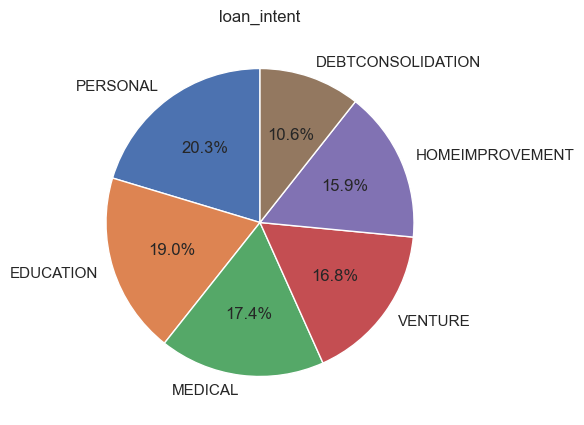

In [13]:
combo_counts = df[multiclass_target].value_counts()

plt.figure(figsize=(5, 5))

plt.pie(
    combo_counts,
    labels=df[multiclass_target].unique(),
    autopct="%1.1f%%",
    startangle=90
)

plt.title("loan_intent")

plt.show()

# Regression Target

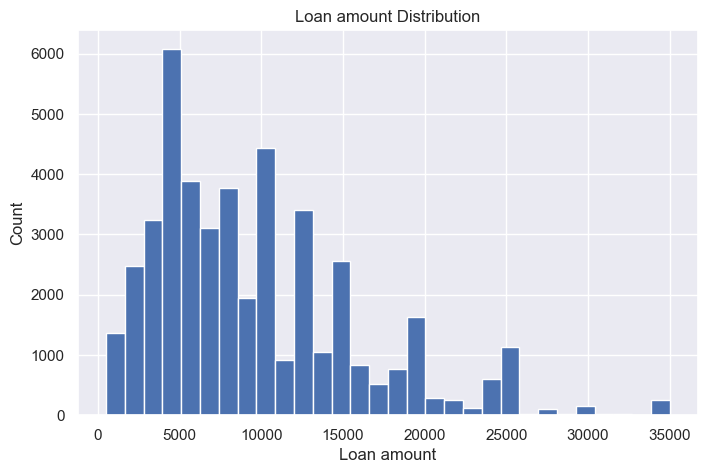

In [14]:
df[regression_target].hist(bins=30, figsize=(8, 5))

plt.title("Loan amount Distribution")
plt.xlabel("Loan amount")
plt.ylabel("Count")
plt.show()

# Check Column Types

Now we check numerical and text columns.

In [15]:
df_encoded = df.copy()

multi_class_names = sorted(df[multiclass_target].unique().tolist())

multiclass_code_col = multiclass_target + "_code"

df_encoded[multiclass_code_col] = pd.Categorical(
    df_encoded[multiclass_target],
    categories=multi_class_names
).codes

multi_class_mapping = dict(enumerate(multi_class_names))

print(multi_class_mapping)

{0: 'DEBTCONSOLIDATION', 1: 'EDUCATION', 2: 'HOMEIMPROVEMENT', 3: 'MEDICAL', 4: 'PERSONAL', 5: 'VENTURE'}


In [16]:
text_columns = df_encoded.select_dtypes(include=["object", "category"]).columns.tolist()

print(text_columns)

['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'previous_loan_defaults_on_file']


C:\Users\ASUS\AppData\Local\Temp\ipykernel_12588\102422967.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  text_columns = df_encoded.select_dtypes(include=["object", "category"]).columns.tolist()


In [17]:
df_encoded = df.copy()

df_encoded["person_gender"] = df_encoded["person_gender"].map({
    "male": 1,
    "female": 0
})

df_encoded["previous_loan_defaults_on_file"] = df_encoded["previous_loan_defaults_on_file"].map({
    "Yes": 1,
    "No": 0
})

multi_class_names = sorted(df_encoded[multiclass_target].unique().tolist())

multiclass_code_col = multiclass_target + "_code"

df_encoded[multiclass_code_col] = pd.Categorical(
    df_encoded[multiclass_target],
    categories=multi_class_names
).codes

multi_class_mapping = dict(enumerate(multi_class_names))

text_columns = df_encoded.select_dtypes(include=["object", "category"]).columns.tolist()

df_encoded = pd.get_dummies(
    df_encoded,
    columns=text_columns,
    dtype=int
)

df_encoded.head()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_12588\3624480149.py:24: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  text_columns = df_encoded.select_dtypes(include=["object", "category"]).columns.tolist()


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
0,22.0,0,71948.0,0,35000.0,16.02,0.49,3.0,561,0,...,0,0,0,1,0,0,0,0,1,0
1,21.0,0,12282.0,0,1000.0,11.14,0.08,2.0,504,1,...,0,0,1,0,0,1,0,0,0,0
2,25.0,0,12438.0,3,5500.0,12.87,0.44,3.0,635,0,...,1,0,0,0,0,0,0,1,0,0
3,23.0,0,79753.0,0,35000.0,15.23,0.44,2.0,675,0,...,0,0,0,1,0,0,0,1,0,0
4,24.0,1,66135.0,1,35000.0,14.27,0.53,4.0,586,0,...,0,0,0,1,0,0,0,1,0,0


In [18]:
df_encoded.describe()

,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
count,44993.000000,44993.000000,4.499300e+04,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,...,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000
mean,27.748428,0.551997,7.990845e+04,5.394528,9583.176761,11.006448,0.139736,5.866557,632.585713,0.507990,...,0.410842,0.002600,0.065588,0.520970,0.158802,0.203387,0.106305,0.189985,0.167826,0.173694
std,5.909737,0.497294,6.332213e+04,5.927159,6314.802655,2.978985,0.087207,3.877167,50.402411,0.499942,...,0.491992,0.050928,0.247563,0.499566,0.365496,0.402523,0.308232,0.392293,0.373716,0.378850
min,20.000000,0.000000,8.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,390.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.000000,0.000000,4.719500e+04,1.000000,5000.000000,8.590000,0.070000,3.000000,601.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,26.000000,1.000000,6.704600e+04,4.000000,8000.000000,11.010000,0.120000,4.000000,640.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,1.000000,9.577800e+04,8.000000,12237.000000,12.990000,0.190000,8.000000,670.000000,1.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,94.000000,1.000000,2.448661e+06,76.000000,35000.000000,20.000000,0.660000,30.000000,784.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [19]:
print("Shape before encoding:", df.shape)
print("Shape after encoding:", df_encoded.shape)

df_encoded.select_dtypes(include=["object", "category"]).columns.tolist()

Shape before encoding: (44993, 14)
Shape after encoding: (44993, 27)


[]

# Regression Data

For regression, we predict loan amount.

In [20]:
regression_df = df_encoded.copy()

In [21]:
# Target for regression
y_reg = regression_df[regression_target].copy()

# Columns that should not be used as input features for regression
potential_drop_columns = [
    regression_target,        # loan_amnt is the target itself
    "loan_percent_income",    # data leakage: it is directly related to loan_amnt / income
    binary_target,            # loan_status is the binary classification target
    multiclass_code_col       # loan_intent_code is only needed later for multiclass classification
]

columns_to_drop_for_regression = [
    col for col in potential_drop_columns 
    if col in regression_df.columns
]

X_reg = regression_df.drop(columns=columns_to_drop_for_regression)

print("Dropped columns:", columns_to_drop_for_regression)
print("X_reg shape:", X_reg.shape)
print("y_reg shape:", y_reg.shape)

print("Non-numeric columns in X_reg:")
print(X_reg.select_dtypes(exclude=[np.number]).columns.tolist())

X_reg.head(10)

Dropped columns: ['loan_amnt', 'loan_percent_income', 'loan_status', 'loan_intent_code']
X_reg shape: (44993, 23)
y_reg shape: (44993,)
Non-numeric columns in X_reg:
[]


,person_age,person_gender,person_income,person_emp_exp,loan_int_rate,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,person_education_Associate,person_education_Bachelor,...,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
0,22.0,0,71948.0,0,16.02,3.0,561,0,0,0,...,0,0,0,1,0,0,0,0,1,0
1,21.0,0,12282.0,0,11.14,2.0,504,1,0,0,...,0,0,1,0,0,1,0,0,0,0
2,25.0,0,12438.0,3,12.87,3.0,635,0,0,0,...,1,0,0,0,0,0,0,1,0,0
3,23.0,0,79753.0,0,15.23,2.0,675,0,0,1,...,0,0,0,1,0,0,0,1,0,0
4,24.0,1,66135.0,1,14.27,4.0,586,0,0,0,...,0,0,0,1,0,0,0,1,0,0
5,21.0,0,12951.0,0,7.14,2.0,532,0,0,0,...,0,0,1,0,0,0,0,0,0,1
6,26.0,0,93471.0,1,12.42,3.0,701,0,0,1,...,0,0,0,1,0,1,0,0,0,0
7,24.0,0,95550.0,5,11.11,4.0,585,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,24.0,0,100684.0,3,8.90,2.0,544,0,1,0,...,0,0,0,1,0,0,0,0,1,0
9,21.0,0,12739.0,0,14.74,3.0,640,0,0,0,...,0,0,1,0,0,0,0,0,0,1


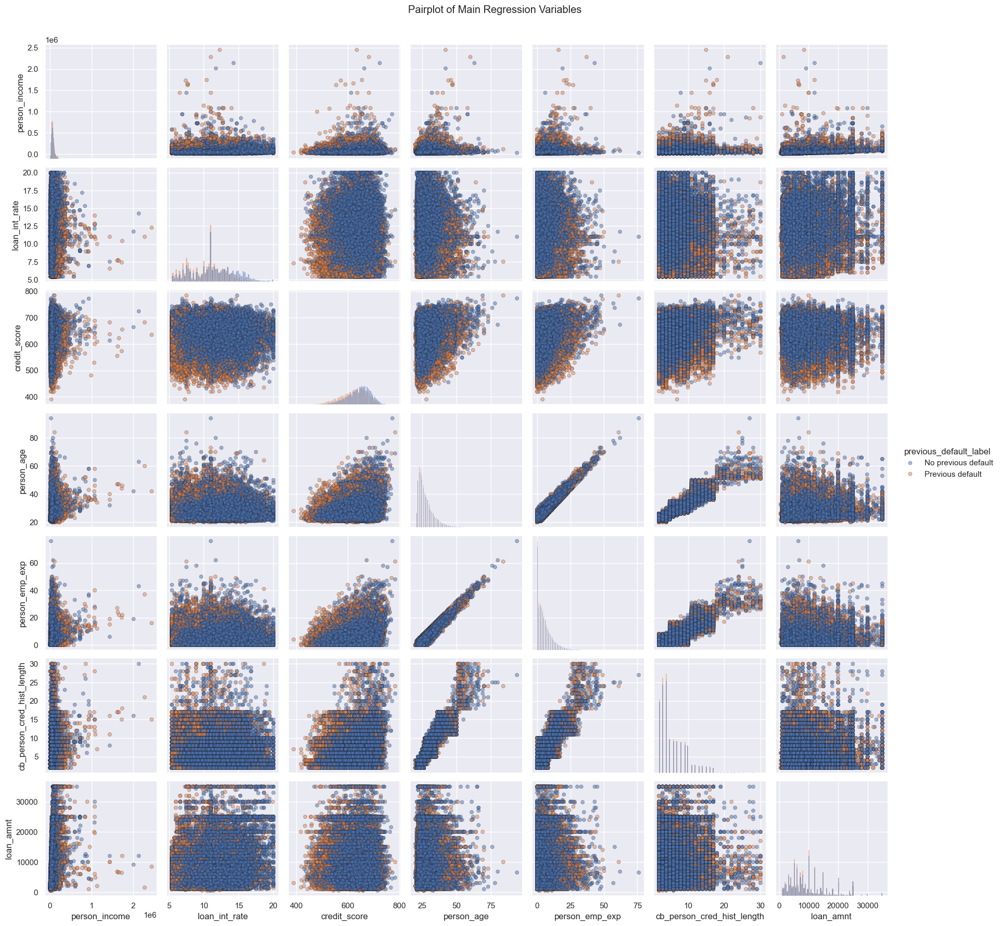

In [22]:
pairplot_features = [
    "person_income",
    "loan_int_rate",
    "credit_score",
    "person_age",
    "person_emp_exp",
    "cb_person_cred_hist_length"
]

pairplot_features = [
    col for col in pairplot_features 
    if col in X_reg.columns
]

regression_pairplot_df = X_reg[pairplot_features].copy()
regression_pairplot_df[regression_target] = y_reg

if "previous_loan_defaults_on_file" in X_reg.columns:
    regression_pairplot_df["previous_default_label"] = X_reg["previous_loan_defaults_on_file"].map({
        0: "No previous default",
        1: "Previous default"
    })
    hue_column = "previous_default_label"
else:
    hue_column = None

sns.pairplot(
    regression_pairplot_df,
    vars=pairplot_features + [regression_target],
    hue=hue_column,
    diag_kind="hist",
    plot_kws={
        "alpha": 0.5,
        "s": 25,
        "edgecolor": "k"
    },
    height=2.5
)

plt.suptitle("Pairplot of Main Regression Variables", y=1.02)
plt.show()

Adding some features

In [23]:
X_reg_fe = X_reg.copy()

In [24]:
#Log transformation
X_reg_fe["log_person_income"] = np.log1p(X_reg_fe["person_income"])

In [25]:
#Income relative to age
X_reg_fe["income_per_age"] = X_reg_fe["person_income"] / X_reg_fe["person_age"]

In [26]:
 #Simple age-based binary feature
X_reg_fe["young_applicant"] = (X_reg_fe["person_age"] < 25).astype(int)

In [27]:
 #Credit score sqrt
X_reg_fe["credit_score_sqrt"] = np.sqrt(X_reg_fe["credit_score"] )

In [28]:
 #Credit total
X_reg_fe["credit_score_total"] = (X_reg_fe["credit_score"] * X_reg_fe["cb_person_cred_hist_length"] )

In [29]:
#Income and home situation. (own > mortgage > rent)
X_reg_fe["home_and_income"] = (X_reg_fe["person_income"] * np.exp(3*X_reg_fe["person_home_ownership_OWN"] + 2*X_reg_fe["person_home_ownership_MORTGAGE"] + X_reg_fe["person_home_ownership_RENT"] ))

In [30]:
#Income and credit capacity
X_reg_fe["income_credit_capacity"] = np.log1p(X_reg_fe["person_income"]) * X_reg_fe["credit_score"]

In [31]:
#Income and credit history capacity
X_reg_fe["income_credit_history_capacity"] = np.log1p(X_reg_fe["person_income"]) * np.log1p(X_reg_fe["cb_person_cred_hist_length"])

In [32]:
#Employment stability relative to age
X_reg_fe["employment_stability_ratio"] = X_reg_fe["person_emp_exp"] / np.maximum(X_reg_fe["person_age"] - 18, 1)

In [33]:
#Income and employment capacity
X_reg_fe["income_employment_capacity"] = np.log1p(X_reg_fe["person_income"]) * np.log1p(X_reg_fe["person_emp_exp"] + 1)

In [34]:
#Credit history relative to age
X_reg_fe["credit_history_age_ratio"] = X_reg_fe["cb_person_cred_hist_length"] / np.maximum(X_reg_fe["person_age"], 1)

In [35]:
#Approximate credit start age
X_reg_fe["credit_start_age"] = X_reg_fe["person_age"] - X_reg_fe["cb_person_cred_hist_length"]

In [36]:
#Log credit strength
X_reg_fe["log_credit_strength"] = np.log1p(X_reg_fe["credit_score"] * X_reg_fe["cb_person_cred_hist_length"])

In [37]:
#Home ownership adjusted income
X_reg_fe["home_ownership_income_capacity"] = np.log1p(X_reg_fe["person_income"]) * (
    1
    + 0.60 * X_reg_fe.get("person_home_ownership_OWN", 0)
    + 0.35 * X_reg_fe.get("person_home_ownership_MORTGAGE", 0)
    - 0.15 * X_reg_fe.get("person_home_ownership_OTHER", 0)
)

In [38]:
#Education adjusted income
X_reg_fe["education_income_capacity"] = np.log1p(X_reg_fe["person_income"]) * (
    1
    + 0.15 * X_reg_fe.get("person_education_Associate", 0)
    + 0.25 * X_reg_fe.get("person_education_Bachelor", 0)
    + 0.35 * X_reg_fe.get("person_education_Master", 0)
    + 0.45 * X_reg_fe.get("person_education_Doctorate", 0)
)

In [39]:
#Loan intent adjusted income
X_reg_fe["intent_income_capacity"] = np.log1p(X_reg_fe["person_income"]) * (
    1
    + 0.40 * X_reg_fe.get("loan_intent_HOMEIMPROVEMENT", 0)
    + 0.30 * X_reg_fe.get("loan_intent_VENTURE", 0)
    + 0.20 * X_reg_fe.get("loan_intent_DEBTCONSOLIDATION", 0)
    + 0.10 * X_reg_fe.get("loan_intent_EDUCATION", 0)
    + 0.05 * X_reg_fe.get("loan_intent_MEDICAL", 0)
)

In [40]:
print("Shape before feature engineering:", X_reg.shape)
print("Shape after feature engineering:", X_reg_fe.shape)

X_reg_fe.describe()

Shape before feature engineering: (44993, 23)
Shape after feature engineering: (44993, 39)


,person_age,person_gender,person_income,person_emp_exp,loan_int_rate,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,person_education_Associate,person_education_Bachelor,...,income_credit_capacity,income_credit_history_capacity,employment_stability_ratio,income_employment_capacity,credit_history_age_ratio,credit_start_age,log_credit_strength,home_ownership_income_capacity,education_income_capacity,intent_income_capacity
count,44993.000000,44993.000000,4.499300e+04,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,...,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000,44993.000000
mean,27.748428,0.551997,7.990845e+04,5.394528,11.006448,5.866557,632.585713,0.507990,0.267286,0.297735,...,7036.422481,19.979956,0.436710,19.211440,0.197981,21.881871,8.028501,13.183355,13.069616,12.864296
std,5.909737,0.497294,6.332213e+04,5.927159,2.978985,3.877167,50.402411,0.499942,0.442548,0.457268,...,670.459422,5.794170,0.304098,8.504094,0.089928,3.113186,0.620305,2.486352,1.551151,1.634186
min,20.000000,0.000000,8.000000e+03,0.000000,5.420000,2.000000,390.000000,0.000000,0.000000,0.000000,...,4102.050584,9.873582,0.000000,6.229537,0.076923,16.000000,6.736967,8.172811,8.987322,8.987322
25%,24.000000,0.000000,4.719500e+04,1.000000,8.590000,3.000000,601.000000,0.000000,0.000000,0.000000,...,6610.587032,15.465253,0.166667,12.100780,0.130435,20.000000,7.562162,10.915579,11.754844,11.554960
50%,26.000000,1.000000,6.704600e+04,4.000000,11.010000,4.000000,640.000000,1.000000,0.000000,0.000000,...,7073.312935,18.670707,0.500000,19.351156,0.173913,21.000000,7.905810,11.795952,13.148274,12.490179
75%,30.000000,1.000000,9.577800e+04,8.000000,12.990000,8.000000,670.000000,1.000000,1.000000,1.000000,...,7491.824775,24.434786,0.692308,25.544903,0.259259,23.000000,8.528924,15.412695,14.199625,14.052436
max,94.000000,1.000000,2.448661e+06,76.000000,20.000000,30.000000,784.000000,1.000000,1.000000,1.000000,...,10615.310556,50.053510,1.000000,55.485594,0.588235,67.000000,10.027959,22.689338,20.562212,19.334041


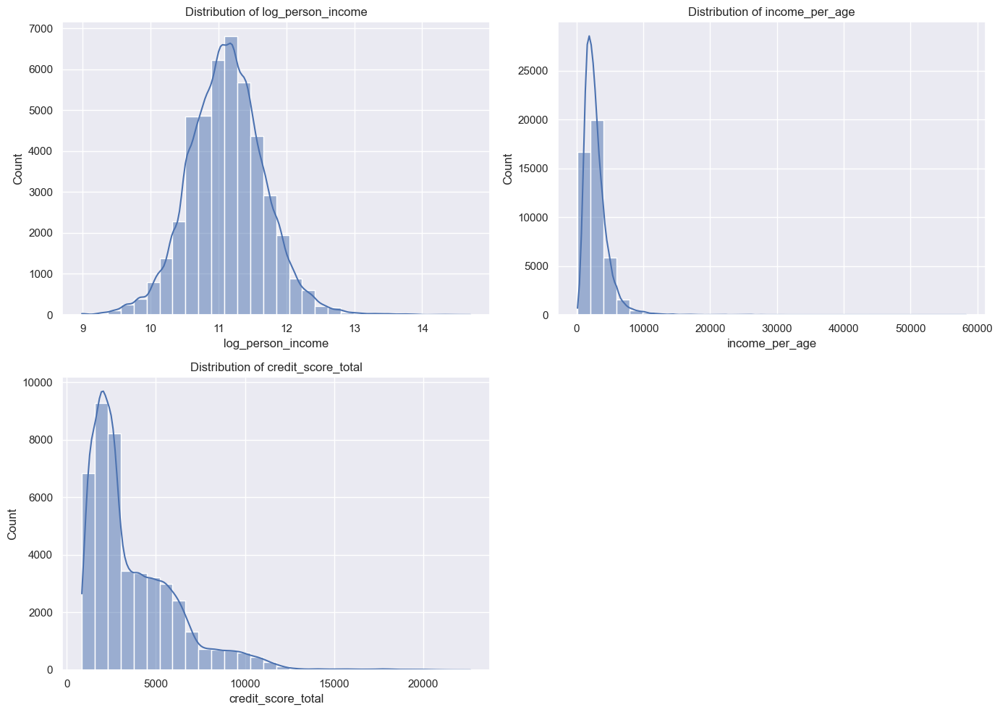

In [41]:
features_to_visualize = [
    "log_person_income",
    "income_per_age",
    "credit_score_total",
]

plt.figure(figsize=(14, 10))

for i, col in enumerate(features_to_visualize):
    plt.subplot(2, 2, i + 1)
    sns.histplot(X_reg_fe[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")

plt.tight_layout()
plt.show()

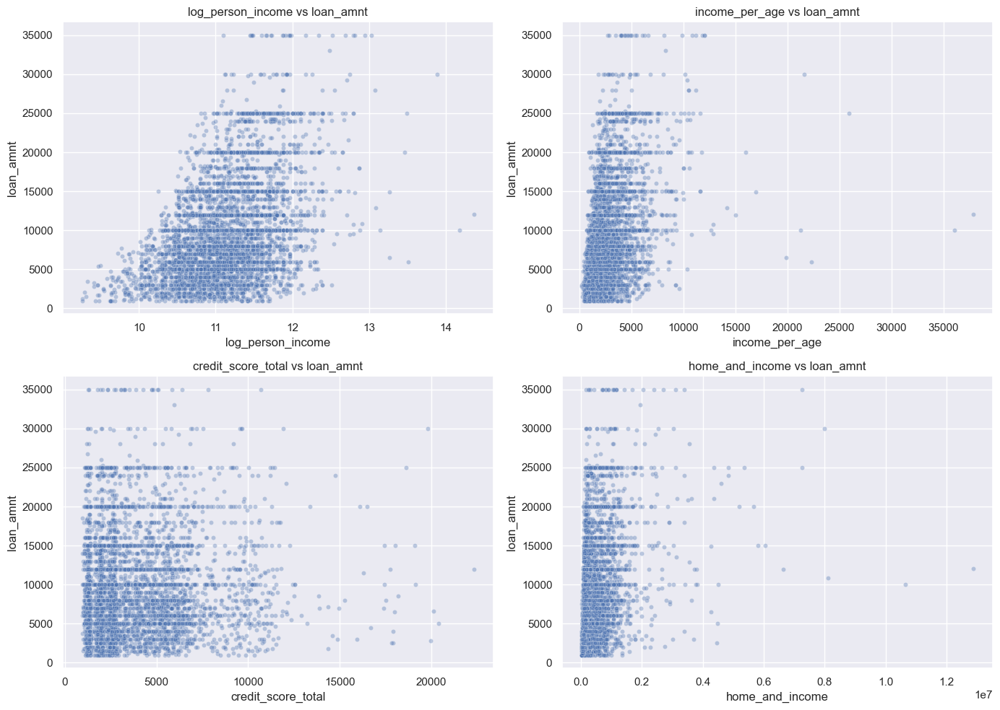

In [42]:
visual_columns = [
    "log_person_income",
    "income_per_age",
    "credit_score_total",
    "home_and_income"
]

visual_df = X_reg_fe[visual_columns].copy()
visual_df[regression_target] = y_reg

visual_sample = visual_df.sample(
    n=min(5000, len(visual_df)),
    random_state=42
)

plt.figure(figsize=(14, 10))

for i, col in enumerate(visual_columns):
    plt.subplot(2, 2, i + 1)
    sns.scatterplot(
        data=visual_sample,
        x=col,
        y=regression_target,
        alpha=0.35,
        s=20
    )
    plt.title(f"{col} vs {regression_target}")
    plt.xlabel(col)
    plt.ylabel(regression_target)

plt.tight_layout()
plt.show()

deviding data to train and test

In [43]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_reg_fe,
    y_reg,
    test_size=0.25,
    random_state=42
)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (33744, 39)
X_test shape: (11249, 39)
y_train shape: (33744,)
y_test shape: (11249,)


In [44]:
binary_features = [
    col for col in X_train.columns 
    if X_train[col].nunique() <= 2
]

continuous_features = [
    col for col in X_train.columns 
    if col not in binary_features
]

print("Number of continuous features:", len(continuous_features))
print("Number of binary / one-hot features:", len(binary_features))

print("\nContinuous features:")
print(continuous_features)

print("\nBinary / one-hot features:")
print(binary_features)

Number of continuous features: 21
Number of binary / one-hot features: 18

Continuous features:
['person_age', 'person_income', 'person_emp_exp', 'loan_int_rate', 'cb_person_cred_hist_length', 'credit_score', 'log_person_income', 'income_per_age', 'credit_score_sqrt', 'credit_score_total', 'home_and_income', 'income_credit_capacity', 'income_credit_history_capacity', 'employment_stability_ratio', 'income_employment_capacity', 'credit_history_age_ratio', 'credit_start_age', 'log_credit_strength', 'home_ownership_income_capacity', 'education_income_capacity', 'intent_income_capacity']

Binary / one-hot features:
['person_gender', 'previous_loan_defaults_on_file', 'person_education_Associate', 'person_education_Bachelor', 'person_education_Doctorate', 'person_education_High School', 'person_education_Master', 'person_home_ownership_MORTGAGE', 'person_home_ownership_OTHER', 'person_home_ownership_OWN', 'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION', 'loan_intent_EDUCATION', 

standardization

In [45]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[continuous_features] = scaler.fit_transform(
    X_train[continuous_features]
)

X_test_scaled[continuous_features] = scaler.transform(
    X_test[continuous_features]
)

X_train_scaled.head()

,person_age,person_gender,person_income,person_emp_exp,loan_int_rate,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,person_education_Associate,person_education_Bachelor,...,income_credit_capacity,income_credit_history_capacity,employment_stability_ratio,income_employment_capacity,credit_history_age_ratio,credit_start_age,log_credit_strength,home_ownership_income_capacity,education_income_capacity,intent_income_capacity
27001,0.384140,0,1.016511,0.782979,-1.877394,0.811581,-1.660071,0,1,0,...,-0.763637,1.276254,1.309800,1.216118,1.137661,-0.283159,0.771579,1.156125,0.383875,0.130349
25126,1.062952,1,0.263640,1.290830,-0.126726,1.069937,1.378048,1,0,1,...,1.524218,1.304910,1.241299,1.399364,1.072176,0.684655,1.338140,0.936925,0.824936,-0.141398
38002,-0.803780,1,-0.110693,-0.909861,-1.678761,-0.480199,0.603625,0,1,0,...,0.576898,-0.336170,-1.430261,-1.340719,-0.265983,-0.928368,-0.232154,-0.795775,-0.124893,-0.332493
1039,-0.803780,1,0.286822,-0.571293,1.004475,-0.996910,-1.282788,1,1,0,...,-0.755526,-1.266757,-0.115031,-0.380493,-1.234012,-0.283159,-1.599279,-0.675484,0.096406,-0.483428
26136,0.384140,1,0.579301,-0.063441,1.004475,0.811581,0.305771,0,0,0,...,0.782942,1.191201,-0.060230,0.414872,1.137661,-0.283159,1.039037,1.039749,-0.902650,-0.013925


Regression Models and Evaluation

In this section, we train four regression models to predict loan amount.  
After each model, we evaluate it using MSE, MAE, MAPE, and R² score.

In [46]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

regression_results = {}

def evaluate_regression_model(model_name, y_true, y_pred):
    metrics = {
        "MSE": mean_squared_error(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "MAPE (%)": mean_absolute_percentage_error(y_true, y_pred) * 100,
        "R2 Score": r2_score(y_true, y_pred)
    }
    
    regression_results[model_name] = metrics
    
    return pd.DataFrame(metrics, index=[model_name]).round(4)

Linear Regression

In [47]:
from sklearn.linear_model import LinearRegression

linear_regression_model = LinearRegression()

linear_regression_model.fit(X_train_scaled, y_train)

linear_regression_predictions = linear_regression_model.predict(X_test_scaled)

evaluate_regression_model(
    "Linear Regression",
    y_test,
    linear_regression_predictions
)

,MSE,MAE,MAPE (%),R2 Score
Linear Regression,3.176925e+07,4375.926,76.2893,0.2261


Kernel Regression

Kernel Regression can model non-linear relationships.  
The kernel trick maps data to a new space where the relationship may become easier to learn.

In [48]:
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
import pandas as pd

nystroem_gamma_range = [0.001, 0.01, 0.05, 0.1]
ridge_alpha_range = [0.1, 1, 10]

nystroem_tuning_results = {}

for gamma in nystroem_gamma_range:
    for alpha in ridge_alpha_range:
        
        nystroem_kernel_model = Pipeline([
            ("kernel_mapping", Nystroem(
                kernel="rbf",
                gamma=gamma,
                n_components=1000,
                random_state=42
            )),
            ("ridge_regression", Ridge(alpha=alpha))
        ])
        
        nystroem_kernel_model.fit(X_train_scaled, y_train)
        
        nystroem_predictions = nystroem_kernel_model.predict(X_test_scaled)
        
        model_name = f"Nystroem Kernel Ridge gamma={gamma}, alpha={alpha}"
        
        evaluate_regression_model(
            model_name,
            y_test,
            nystroem_predictions
        )
        
        nystroem_tuning_results[model_name] = regression_results[model_name]

nystroem_tuning_results_df = pd.DataFrame(nystroem_tuning_results).T

nystroem_tuning_results_df = nystroem_tuning_results_df.sort_values(
    by="MAE",
    ascending=True
)

nystroem_tuning_results_df.round(4)

,MSE,MAE,MAPE (%),R2 Score
"Nystroem Kernel Ridge gamma=0.01, alpha=1",3.100342e+07,4309.8705,74.9994,0.2447
"Nystroem Kernel Ridge gamma=0.001, alpha=0.1",3.110490e+07,4316.7690,75.2376,0.2423
"Nystroem Kernel Ridge gamma=0.01, alpha=0.1",3.120083e+07,4321.2046,75.0078,0.2399
"Nystroem Kernel Ridge gamma=0.01, alpha=10",3.123219e+07,4326.6704,75.5516,0.2392
"Nystroem Kernel Ridge gamma=0.05, alpha=1",3.144081e+07,4335.2090,75.1095,0.2341
"Nystroem Kernel Ridge gamma=0.05, alpha=10",3.138683e+07,4335.3979,75.7040,0.2354
"Nystroem Kernel Ridge gamma=0.001, alpha=1",3.150254e+07,4350.8742,75.9482,0.2326
"Nystroem Kernel Ridge gamma=0.05, alpha=0.1",3.175212e+07,4355.4924,75.2468,0.2265
"Nystroem Kernel Ridge gamma=0.1, alpha=1",3.194555e+07,4372.3007,75.9887,0.2218
"Nystroem Kernel Ridge gamma=0.1, alpha=10",3.203058e+07,4377.4737,76.8652,0.2197


 Regularized Regression

In [49]:
from sklearn.linear_model import Ridge

alpha_range = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

ridge_tuning_results = {}

for alpha in alpha_range:
    ridge_regression_model = Ridge(alpha=alpha)
    
    ridge_regression_model.fit(X_train_scaled, y_train)
    
    ridge_regression_predictions = ridge_regression_model.predict(X_test_scaled)
    
    model_name = f"Ridge alpha={alpha}"
    
    metrics_df = evaluate_regression_model(
        model_name,
        y_test,
        ridge_regression_predictions
    )
    
    ridge_tuning_results[model_name] = regression_results[model_name]

ridge_tuning_results_df = pd.DataFrame(ridge_tuning_results).T

ridge_tuning_results_df = ridge_tuning_results_df.sort_values(
    by="MAE",
    ascending=True
)

ridge_tuning_results_df.round(4)

,MSE,MAE,MAPE (%),R2 Score
Ridge alpha=10,3.176343e+07,4375.1716,76.2752,0.2262
Ridge alpha=100,3.177015e+07,4375.1838,76.2978,0.2261
Ridge alpha=1,3.176765e+07,4375.7512,76.2856,0.2261
Ridge alpha=0.1,3.176906e+07,4375.9059,76.2888,0.2261
Ridge alpha=0.01,3.176923e+07,4375.9240,76.2892,0.2261
Ridge alpha=0.001,3.176925e+07,4375.9258,76.2893,0.2261
Ridge alpha=1000,3.183990e+07,4377.1238,76.5164,0.2244


LASSO regression

In [50]:
from sklearn.linear_model import Lasso
import pandas as pd

lasso_alpha_range = [0.1, 1, 5, 10, 50, 100]

lasso_tuning_results = {}

for alpha in lasso_alpha_range:
    lasso_model = Lasso(
        alpha=alpha,
        max_iter=3000,
        tol=0.01,
        random_state=42
    )
    
    lasso_model.fit(X_train_scaled, y_train)
    
    lasso_predictions = lasso_model.predict(X_test_scaled)
    
    model_name = f"LASSO alpha={alpha}"
    
    evaluate_regression_model(
        model_name,
        y_test,
        lasso_predictions
    )
    
    lasso_tuning_results[model_name] = regression_results[model_name]

lasso_tuning_results_df = pd.DataFrame(lasso_tuning_results).T

lasso_tuning_results_df = lasso_tuning_results_df.sort_values(
    by="MAE",
    ascending=True
)

lasso_tuning_results_df.round(4)

d:\SHARIF\TERM7\DATA\HW1\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.282e+11, tolerance: 1.332e+10
  model = cd_fast.enet_coordinate_descent(


,MSE,MAE,MAPE (%),R2 Score
LASSO alpha=0.1,3.176429e+07,4375.4063,76.2774,0.2262
LASSO alpha=1,3.176410e+07,4375.5823,76.2935,0.2262
LASSO alpha=5,3.176419e+07,4376.4131,76.3590,0.2262
LASSO alpha=10,3.177209e+07,4377.1656,76.4145,0.2260
LASSO alpha=50,3.185152e+07,4380.1152,76.5901,0.2241
LASSO alpha=100,3.204840e+07,4386.8128,76.8964,0.2193


In [51]:
regression_results_df = pd.DataFrame(regression_results).T

regression_results_df = regression_results_df.sort_values(
   by="MAE",
    ascending=True
)

regression_results_df.round(4)

,MSE,MAE,MAPE (%),R2 Score
"Nystroem Kernel Ridge gamma=0.01, alpha=1",3.100342e+07,4309.8705,74.9994,0.2447
"Nystroem Kernel Ridge gamma=0.001, alpha=0.1",3.110490e+07,4316.7690,75.2376,0.2423
"Nystroem Kernel Ridge gamma=0.01, alpha=0.1",3.120083e+07,4321.2046,75.0078,0.2399
"Nystroem Kernel Ridge gamma=0.01, alpha=10",3.123219e+07,4326.6704,75.5516,0.2392
"Nystroem Kernel Ridge gamma=0.05, alpha=1",3.144081e+07,4335.2090,75.1095,0.2341
"Nystroem Kernel Ridge gamma=0.05, alpha=10",3.138683e+07,4335.3979,75.7040,0.2354
"Nystroem Kernel Ridge gamma=0.001, alpha=1",3.150254e+07,4350.8742,75.9482,0.2326
"Nystroem Kernel Ridge gamma=0.05, alpha=0.1",3.175212e+07,4355.4924,75.2468,0.2265
"Nystroem Kernel Ridge gamma=0.1, alpha=1",3.194555e+07,4372.3007,75.9887,0.2218
Ridge alpha=10,3.176343e+07,4375.1716,76.2752,0.2262


Regression Models with Log-Transformed Target

In the previous section, we trained regression models directly on `loan_amnt`.  
Here, we train the same four models using `log1p(loan_amnt)` as the target.

This transformation can help when the target variable is skewed or contains very large values.  
After prediction, we convert the predicted values back to the original loan amount scale using `expm1`, and then evaluate the models using MSE, MAE, MAPE, and R².

In [52]:
y_train_log = np.log1p(y_train)
y_test_log = np.log1p(y_test)

log_target_results = {}

def evaluate_log_target_model(model_name, y_true_original, y_pred_log):
    y_pred_original = np.expm1(y_pred_log)
    
    y_pred_original = np.maximum(y_pred_original, 0)
    
    metrics = {
        "MSE": mean_squared_error(y_true_original, y_pred_original),
        "MAE": mean_absolute_error(y_true_original, y_pred_original),
        "MAPE (%)": mean_absolute_percentage_error(y_true_original, y_pred_original) * 100,
        "R2 Score": r2_score(y_true_original, y_pred_original)
    }
    
    log_target_results[model_name] = metrics
    
    return metrics

In [53]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.kernel_ridge import KernelRidge

# -----------------------------
# 1. Linear Regression
# -----------------------------

linear_log_model = LinearRegression()
linear_log_model.fit(X_train_scaled, y_train_log)
linear_log_predictions = linear_log_model.predict(X_test_scaled)

evaluate_log_target_model(
    "Linear Regression - Log Target",
    y_test,
    linear_log_predictions
)


# -----------------------------
# 2. Kernel Regression
# Lightweight version: train on sample
# -----------------------------

kernel_sample_size = min(5000, len(X_train_scaled))

X_train_kernel_log = X_train_scaled.sample(
    n=kernel_sample_size,
    random_state=42
)

y_train_kernel_log = y_train_log.loc[X_train_kernel_log.index]

kernel_log_model = KernelRidge(
    kernel="rbf",
    alpha=1,
    gamma=0.01
)

kernel_log_model.fit(X_train_kernel_log, y_train_kernel_log)
kernel_log_predictions = kernel_log_model.predict(X_test_scaled)

evaluate_log_target_model(
    "Kernel Regression - Log Target",
    y_test,
    kernel_log_predictions
)


# -----------------------------
# 3. Ridge Regression
# alpha = 1
# -----------------------------

ridge_log_model = Ridge(alpha=1)
ridge_log_model.fit(X_train_scaled, y_train_log)
ridge_log_predictions = ridge_log_model.predict(X_test_scaled)

evaluate_log_target_model(
    "Ridge Regression - Log Target",
    y_test,
    ridge_log_predictions
)


# -----------------------------
# 4. LASSO Regression
# alpha = 1
# -----------------------------

lasso_log_model = Lasso(
    alpha=1,
    max_iter=5000,
    tol=0.1,
    random_state=42
)

lasso_log_model.fit(X_train_scaled, y_train_log)
lasso_log_predictions = lasso_log_model.predict(X_test_scaled)

evaluate_log_target_model(
    "LASSO Regression - Log Target",
    y_test,
    lasso_log_predictions
)

{'MSE': 45291932.311125115,
 'MAE': 4868.942160007149,
 'MAPE (%)': 71.96102947578802,
 'R2 Score': -0.10335094563637082}

In [54]:
log_target_results_df = pd.DataFrame(log_target_results).T

log_target_results_df = log_target_results_df.sort_values(
    by="MAE",
    ascending=True
)

log_target_results_df.round(4)

,MSE,MAE,MAPE (%),R2 Score
Ridge Regression - Log Target,3.466439e+07,4349.5450,63.5038,0.1555
Linear Regression - Log Target,3.466853e+07,4349.6207,63.5020,0.1554
Kernel Regression - Log Target,3.592648e+07,4424.2608,64.4282,0.1248
LASSO Regression - Log Target,4.529193e+07,4868.9422,71.9610,-0.1034


The log-transformed target did not improve the final regression performance.  
Although MAPE became better, R² became worse, so the model explained less variance in the original loan amount values.

In this section, we return to the original target `loan_amnt`.  
We clean extreme loan amount outliers, rebuild a cleaner set of features, remove redundant engineered features, and then retrain the four main regression models.

In [55]:
regression_clean_df = X_reg.copy()
regression_clean_df[regression_target] = y_reg

lower_limit = regression_clean_df[regression_target].quantile(0.05)
upper_limit = regression_clean_df[regression_target].quantile(0.95)

outlier_mask = (
    (regression_clean_df[regression_target] >= lower_limit) &
    (regression_clean_df[regression_target] <= upper_limit)
)

regression_clean_df = regression_clean_df.loc[outlier_mask].copy()

print("Original number of rows:", len(y_reg))
print("Rows after outlier cleaning:", len(regression_clean_df))
print("Removed rows:", len(y_reg) - len(regression_clean_df))

print("\nLoan amount lower limit:", lower_limit)
print("Loan amount upper limit:", upper_limit)

Original number of rows: 44993
Rows after outlier cleaning: 41364
Removed rows: 3629

Loan amount lower limit: 2000.0
Loan amount upper limit: 24000.0


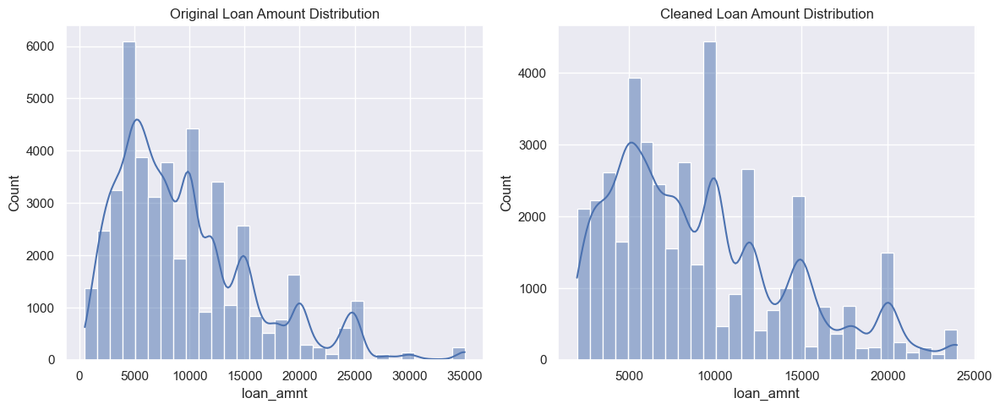

In [56]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(y_reg, bins=30, kde=True)
plt.title("Original Loan Amount Distribution")
plt.xlabel("loan_amnt")

plt.subplot(1, 2, 2)
sns.histplot(regression_clean_df[regression_target], bins=30, kde=True)
plt.title("Cleaned Loan Amount Distribution")
plt.xlabel("loan_amnt")

plt.tight_layout()
plt.show()

In [57]:
y_reg_clean = regression_clean_df[regression_target].copy()
X_reg_clean = regression_clean_df.drop(columns=[regression_target]).copy()

X_reg_clean_fe = X_reg_clean.copy()

# -----------------------------
# 1. Safer income feature
# -----------------------------

X_reg_clean_fe["log_person_income"] = np.log1p(
    X_reg_clean_fe["person_income"]
)

# -----------------------------
# 2. Simple binary features
# -----------------------------

X_reg_clean_fe["young_applicant"] = (
    X_reg_clean_fe["person_age"] < 25
).astype(int)

X_reg_clean_fe["high_income"] = (
    X_reg_clean_fe["person_income"] > X_reg_clean_fe["person_income"].median()
).astype(int)

X_reg_clean_fe["high_credit_score"] = (
    X_reg_clean_fe["credit_score"] > X_reg_clean_fe["credit_score"].median()
).astype(int)

X_reg_clean_fe["high_interest_rate"] = (
    X_reg_clean_fe["loan_int_rate"] > X_reg_clean_fe["loan_int_rate"].median()
).astype(int)

X_reg_clean_fe["long_credit_history"] = (
    X_reg_clean_fe["cb_person_cred_hist_length"] >
    X_reg_clean_fe["cb_person_cred_hist_length"].median()
).astype(int)

# -----------------------------
# 3. Ratio feature with clear meaning
# -----------------------------

X_reg_clean_fe["credit_history_per_age"] = (
    X_reg_clean_fe["cb_person_cred_hist_length"] /
    X_reg_clean_fe["person_age"]
)

# -----------------------------
# 4. Centered interaction feature
# -----------------------------
# Centering reduces multicollinearity compared to multiplying raw columns.

loan_int_rate_centered = (
    X_reg_clean_fe["loan_int_rate"] -
    X_reg_clean_fe["loan_int_rate"].mean()
)

credit_score_centered = (
    X_reg_clean_fe["credit_score"] -
    X_reg_clean_fe["credit_score"].mean()
)

X_reg_clean_fe["interest_credit_interaction"] = (
    loan_int_rate_centered * credit_score_centered
)

# -----------------------------
# 5. Remove redundant or unstable features
# -----------------------------

columns_to_remove = [
    "person_income",              # replaced by log_person_income
    "income_per_age",             # caused unstable negative weights
    "income_per_emp_exp",         # often noisy and highly skewed
    "credit_score_sqrt",          # redundant with credit_score
    "credit_score_total",         # redundant / unclear engineered feature
    "home_and_income",            # redundant with income and home ownership
]

# Drop one dummy column from each categorical group to reduce dummy-variable trap.
reference_dummy_columns = [
    "person_education_High School",
    "person_home_ownership_RENT",
    "loan_intent_PERSONAL"
]

columns_to_remove = columns_to_remove + reference_dummy_columns

columns_to_remove = [
    col for col in columns_to_remove
    if col in X_reg_clean_fe.columns
]

X_reg_clean_fe = X_reg_clean_fe.drop(columns=columns_to_remove)

# -----------------------------
# 6. Final safety cleaning
# -----------------------------

X_reg_clean_fe = X_reg_clean_fe.replace([np.inf, -np.inf], np.nan)

X_reg_clean_fe = X_reg_clean_fe.fillna(
    X_reg_clean_fe.median(numeric_only=True)
)

print("Removed columns:")
print(columns_to_remove)

print("\nClean feature dataframe shape:")
print(X_reg_clean_fe.shape)

print("\nRemaining non-numeric columns:")
print(X_reg_clean_fe.select_dtypes(exclude=[np.number]).columns.tolist())

X_reg_clean_fe.head()

Removed columns:
['person_income', 'person_education_High School', 'person_home_ownership_RENT', 'loan_intent_PERSONAL']

Clean feature dataframe shape:
(41364, 27)

Remaining non-numeric columns:
[]


,person_age,person_gender,person_emp_exp,loan_int_rate,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,person_education_Associate,person_education_Bachelor,person_education_Doctorate,...,loan_intent_MEDICAL,loan_intent_VENTURE,log_person_income,young_applicant,high_income,high_credit_score,high_interest_rate,long_credit_history,credit_history_per_age,interest_credit_interaction
2,25.0,0,3,12.87,3.0,635,0,0,0,0,...,1,0,9.428592,0,0,0,1,0,0.120000,4.803584
5,21.0,0,0,7.14,2.0,532,0,0,0,0,...,0,1,9.469005,1,0,0,0,0,0.095238,380.326470
11,21.0,0,0,8.63,2.0,651,0,1,0,0,...,0,0,9.481436,1,0,1,0,0,0.095238,-42.347632
26,21.0,0,0,17.74,3.0,626,0,1,0,0,...,0,1,9.567245,1,0,0,1,0,0.142857,-44.532581
29,21.0,0,0,12.84,2.0,553,0,0,1,0,...,0,0,9.615072,1,0,0,1,0,0.095238,-152.455202


In [58]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(
    X_reg_clean_fe,
    y_reg_clean,
    test_size=0.25,
    random_state=42
)

binary_features_clean = [
    col for col in X_train_clean.columns
    if X_train_clean[col].nunique() <= 2
]

continuous_features_clean = [
    col for col in X_train_clean.columns
    if col not in binary_features_clean
]

scaler_clean = StandardScaler()

X_train_clean_scaled = X_train_clean.copy()
X_test_clean_scaled = X_test_clean.copy()

X_train_clean_scaled[continuous_features_clean] = scaler_clean.fit_transform(
    X_train_clean[continuous_features_clean]
)

X_test_clean_scaled[continuous_features_clean] = scaler_clean.transform(
    X_test_clean[continuous_features_clean]
)

print("X_train_clean_scaled shape:", X_train_clean_scaled.shape)
print("X_test_clean_scaled shape:", X_test_clean_scaled.shape)

print("NaN in train:", X_train_clean_scaled.isna().sum().sum())
print("NaN in test:", X_test_clean_scaled.isna().sum().sum())

X_train_clean_scaled shape: (31023, 27)
X_test_clean_scaled shape: (10341, 27)
NaN in train: 0
NaN in test: 0


In [59]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

clean_regression_results = {}

def evaluate_clean_regression_model(model_name, y_true, y_pred):
    metrics = {
        "MSE": mean_squared_error(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "MAPE (%)": mean_absolute_percentage_error(y_true, y_pred) * 100,
        "R2 Score": r2_score(y_true, y_pred)
    }
    
    clean_regression_results[model_name] = metrics
    
    return pd.DataFrame(metrics, index=[model_name]).round(4)

In [60]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.kernel_approximation import Nystroem
from sklearn.pipeline import Pipeline

# -----------------------------
# 1. Linear Regression
# -----------------------------

linear_clean_model = LinearRegression()

linear_clean_model.fit(X_train_clean_scaled, y_train_clean)

linear_clean_predictions = linear_clean_model.predict(X_test_clean_scaled)

evaluate_clean_regression_model(
    "Linear Regression - Clean Data",
    y_test_clean,
    linear_clean_predictions
)


# -----------------------------
# 2. Kernel Regression
# RBF kernel approximation
# gamma = 0.01, alpha = 1
# -----------------------------

kernel_clean_model = Pipeline([
    ("kernel_mapping", Nystroem(
        kernel="rbf",
        gamma=0.01,
        n_components=1000,
        random_state=42
    )),
    ("ridge_regression", Ridge(alpha=1))
])

kernel_clean_model.fit(X_train_clean_scaled, y_train_clean)

kernel_clean_predictions = kernel_clean_model.predict(X_test_clean_scaled)

evaluate_clean_regression_model(
    "Kernel Regression - Clean Data",
    y_test_clean,
    kernel_clean_predictions
)


# -----------------------------
# 3. Ridge Regression
# alpha = 1
# -----------------------------

ridge_clean_model = Ridge(alpha=1)

ridge_clean_model.fit(X_train_clean_scaled, y_train_clean)

ridge_clean_predictions = ridge_clean_model.predict(X_test_clean_scaled)

evaluate_clean_regression_model(
    "Ridge Regression - Clean Data",
    y_test_clean,
    ridge_clean_predictions
)


# -----------------------------
# 4. LASSO Regression
# alpha = 1
# -----------------------------

lasso_clean_model = Lasso(
    alpha=1,
    max_iter=3000,
    tol=0.01,
    random_state=42
)

lasso_clean_model.fit(X_train_clean_scaled, y_train_clean)

lasso_clean_predictions = lasso_clean_model.predict(X_test_clean_scaled)

evaluate_clean_regression_model(
    "LASSO Regression - Clean Data",
    y_test_clean,
    lasso_clean_predictions
)

,MSE,MAE,MAPE (%),R2 Score
LASSO Regression - Clean Data,2.168232e+07,3742.9782,58.656,0.1497


In [61]:
clean_regression_results_df = pd.DataFrame(clean_regression_results).T

clean_regression_results_df = clean_regression_results_df.sort_values(
    by="MAE",
    ascending=True
)

clean_regression_results_df.round(4)

,MSE,MAE,MAPE (%),R2 Score
Kernel Regression - Clean Data,2.128928e+07,3702.6912,57.8945,0.1651
Linear Regression - Clean Data,2.168286e+07,3742.7716,58.6467,0.1497
Ridge Regression - Clean Data,2.168289e+07,3742.7853,58.6470,0.1497
LASSO Regression - Clean Data,2.168232e+07,3742.9782,58.6560,0.1497


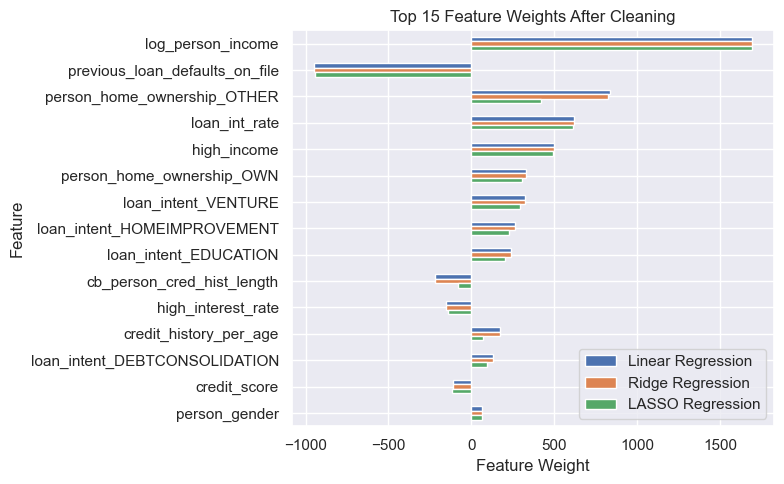

In [62]:
clean_linear_models_weights = pd.DataFrame({
    "Feature": X_train_clean_scaled.columns,
    "Linear Regression": linear_clean_model.coef_,
    "Ridge Regression": ridge_clean_model.coef_,
    "LASSO Regression": lasso_clean_model.coef_
})

clean_linear_models_weights["Average Absolute Weight"] = clean_linear_models_weights[
    ["Linear Regression", "Ridge Regression", "LASSO Regression"]
].abs().mean(axis=1)

top_clean_weights = clean_linear_models_weights.sort_values(
    by="Average Absolute Weight",
    ascending=False
).head(15)

top_clean_weights_plot = top_clean_weights.set_index("Feature")[
    ["Linear Regression", "Ridge Regression", "LASSO Regression"]
]

top_clean_weights_plot.plot(
    kind="barh",
    figsize=(8, 5)
)

plt.xlabel("Feature Weight")
plt.ylabel("Feature")
plt.title("Top 15 Feature Weights After Cleaning")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Main Regression Models After Outlier Cleaning and Feature Refinement

After testing the log-transformed target, we found that it improved MAPE but reduced the R² score, so it was not selected as the final regression strategy.  
Instead, we returned to the original `loan_amnt` target, removed extreme loan amount outliers, and rebuilt a cleaner feature set.

The results improved in terms of MAE compared to the previous regression models.  
Kernel Regression achieved the best performance among the four required models, with the lowest MAE.  
However, Linear Regression, Ridge Regression, and LASSO Regression still performed very similarly, which suggests that simple linear models may not capture all nonlinear patterns in the dataset.

Next, we test a few optional regression models that may capture nonlinear relationships or provide stronger regularization.

In [63]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

optional_tuning_results = []

def calculate_regression_metrics(y_true, y_pred):
    metrics = {
        "MSE": mean_squared_error(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "MAPE (%)": mean_absolute_percentage_error(y_true, y_pred) * 100,
        "R2 Score": r2_score(y_true, y_pred)
    }
    
    return metrics

Polynomial Ridge Regression

In [64]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
import pandas as pd

polynomial_degree_list = [1, 2, 3]
polynomial_alpha_list = [0.1, 1, 10, 100]

poly_base_features = [
    "log_person_income",
    "person_age",
    "person_emp_exp",
    "loan_int_rate",
    "credit_score",
    "cb_person_cred_hist_length",
    "credit_history_per_age"
]

poly_base_features = [
    col for col in poly_base_features
    if col in X_train_clean_scaled.columns
]

polynomial_ridge_results = []

for degree in polynomial_degree_list:
    for alpha in polynomial_alpha_list:
        
        polynomial_ridge_model = Pipeline([
            ("polynomial_features", ColumnTransformer(
                transformers=[
                    ("poly", PolynomialFeatures(
                        degree=degree,
                        include_bias=False
                    ), poly_base_features)
                ],
                remainder="passthrough"
            )),
            ("ridge_regression", Ridge(alpha=alpha))
        ])
        
        polynomial_ridge_model.fit(X_train_clean_scaled, y_train_clean)
        
        polynomial_ridge_predictions = polynomial_ridge_model.predict(X_test_clean_scaled)
        
        metrics = calculate_regression_metrics(
            y_test_clean,
            polynomial_ridge_predictions
        )
        
        result = {
            "Model": "Polynomial Ridge Regression",
            "degree": degree,
            "alpha": alpha,
            **metrics
        }
        
        polynomial_ridge_results.append(result)
        optional_tuning_results.append(result)

polynomial_ridge_results_df = pd.DataFrame(polynomial_ridge_results)

polynomial_ridge_results_df = polynomial_ridge_results_df.sort_values(
    by="MAE",
    ascending=True
)

polynomial_ridge_results_df.round(4)

,Model,degree,alpha,MSE,MAE,MAPE (%),R2 Score
11,Polynomial Ridge Regression,3,100.0,2.137637e+07,3712.9340,58.0863,0.1617
8,Polynomial Ridge Regression,3,0.1,2.138122e+07,3712.9623,58.0811,0.1615
10,Polynomial Ridge Regression,3,10.0,2.137812e+07,3713.0125,58.0829,0.1616
9,Polynomial Ridge Regression,3,1.0,2.137864e+07,3713.0413,58.0837,0.1616
4,Polynomial Ridge Regression,2,0.1,2.142481e+07,3716.9306,58.1435,0.1598
5,Polynomial Ridge Regression,2,1.0,2.142503e+07,3716.9531,58.1437,0.1598
6,Polynomial Ridge Regression,2,10.0,2.142638e+07,3717.1274,58.1465,0.1597
7,Polynomial Ridge Regression,2,100.0,2.142841e+07,3717.6735,58.1606,0.1596
0,Polynomial Ridge Regression,1,0.1,2.168286e+07,3742.7729,58.6467,0.1497
1,Polynomial Ridge Regression,1,1.0,2.168289e+07,3742.7853,58.6470,0.1497


Elastic Net Regression

In [65]:
from sklearn.linear_model import ElasticNet

elastic_alpha_list = [0.001, 0.01, 0.1, 1, 10]
elastic_l1_ratio_list = [0.1, 0.5, 0.9]

elastic_net_results = []

for alpha in elastic_alpha_list:
    for l1_ratio in elastic_l1_ratio_list:
        
        elastic_net_model = ElasticNet(
            alpha=alpha,
            l1_ratio=l1_ratio,
            max_iter=5000,
            tol=0.01,
            selection="random",
            random_state=42
        )
        
        elastic_net_model.fit(X_train_clean_scaled, y_train_clean)
        
        elastic_net_predictions = elastic_net_model.predict(X_test_clean_scaled)
        
        metrics = calculate_regression_metrics(
            y_test_clean,
            elastic_net_predictions
        )
        
        result = {
            "Model": "Elastic Net Regression",
            "alpha": alpha,
            "l1_ratio": l1_ratio,
            **metrics
        }
        
        elastic_net_results.append(result)
        optional_tuning_results.append(result)

elastic_net_results_df = pd.DataFrame(elastic_net_results)

elastic_net_results_df = elastic_net_results_df.sort_values(
    by="MAE",
    ascending=True
)

elastic_net_results_df.round(4)

,Model,alpha,l1_ratio,MSE,MAE,MAPE (%),R2 Score
2,Elastic Net Regression,0.001,0.9,2.168295e+07,3742.8134,58.6477,0.1497
1,Elastic Net Regression,0.001,0.5,2.168329e+07,3742.9567,58.6514,0.1497
0,Elastic Net Regression,0.001,0.1,2.168356e+07,3743.0726,58.6547,0.1496
5,Elastic Net Regression,0.010,0.9,2.168360e+07,3743.0987,58.6555,0.1496
4,Elastic Net Regression,0.010,0.5,2.168458e+07,3743.7300,58.6791,0.1496
3,Elastic Net Regression,0.010,0.1,2.168499e+07,3744.1699,58.6987,0.1496
8,Elastic Net Regression,0.100,0.9,2.168502e+07,3744.2690,58.7037,0.1496
7,Elastic Net Regression,0.100,0.5,2.170128e+07,3749.0383,58.8836,0.1489
6,Elastic Net Regression,0.100,0.1,2.172968e+07,3754.0512,59.0479,0.1478
11,Elastic Net Regression,1.000,0.9,2.173867e+07,3755.3902,59.0897,0.1475


Decision Tree Regression

In [66]:
from sklearn.tree import DecisionTreeRegressor

tree_max_depth_list = [4, 6, 8, 10, 12, None]
tree_min_samples_leaf_list = [10, 30, 50, 100]

decision_tree_results = []

for max_depth in tree_max_depth_list:
    for min_samples_leaf in tree_min_samples_leaf_list:
        
        decision_tree_model = DecisionTreeRegressor(
            max_depth=max_depth,
            min_samples_leaf=min_samples_leaf,
            random_state=42
        )
        
        decision_tree_model.fit(X_train_clean_scaled, y_train_clean)
        
        decision_tree_predictions = decision_tree_model.predict(X_test_clean_scaled)
        
        metrics = calculate_regression_metrics(
            y_test_clean,
            decision_tree_predictions
        )
        
        result = {
            "Model": "Decision Tree Regression",
            "max_depth": max_depth,
            "min_samples_leaf": min_samples_leaf,
            **metrics
        }
        
        decision_tree_results.append(result)
        optional_tuning_results.append(result)

decision_tree_results_df = pd.DataFrame(decision_tree_results)

decision_tree_results_df = decision_tree_results_df.sort_values(
    by="MAE",
    ascending=True
)

decision_tree_results_df.round(4)

,Model,max_depth,min_samples_leaf,MSE,MAE,MAPE (%),R2 Score
10,Decision Tree Regression,8.0,50,2.124369e+07,3683.6957,57.3971,0.1669
11,Decision Tree Regression,8.0,100,2.127194e+07,3684.8719,57.5257,0.1658
9,Decision Tree Regression,8.0,30,2.135528e+07,3686.3143,57.3210,0.1625
4,Decision Tree Regression,6.0,10,2.125794e+07,3688.9598,57.5466,0.1663
5,Decision Tree Regression,6.0,30,2.126993e+07,3691.1792,57.5955,0.1659
7,Decision Tree Regression,6.0,100,2.127440e+07,3691.6314,57.6882,0.1657
15,Decision Tree Regression,10.0,100,2.147413e+07,3694.1284,57.6277,0.1579
6,Decision Tree Regression,6.0,50,2.127814e+07,3694.1870,57.6965,0.1655
8,Decision Tree Regression,8.0,10,2.153010e+07,3698.4478,57.4872,0.1557
19,Decision Tree Regression,12.0,100,2.156376e+07,3700.7155,57.6882,0.1543


SVR

In [67]:
from sklearn.svm import SVR

svr_sample_size = min(1500, len(X_train_clean_scaled))

X_train_svr_tune = X_train_clean_scaled.sample(
    n=svr_sample_size,
    random_state=42
)

y_train_svr_tune = y_train_clean.loc[X_train_svr_tune.index]

svr_C_list = [10, 100, 500]
svr_epsilon_list = [250, 500, 1000]
svr_gamma_list = ["scale", 0.01]

svr_results = []

for C in svr_C_list:
    for epsilon in svr_epsilon_list:
        for gamma in svr_gamma_list:
            
            svr_model = SVR(
                kernel="rbf",
                C=C,
                epsilon=epsilon,
                gamma=gamma,
                cache_size=500
            )
            
            svr_model.fit(X_train_svr_tune, y_train_svr_tune)
            
            svr_predictions = svr_model.predict(X_test_clean_scaled)
            
            metrics = calculate_regression_metrics(
                y_test_clean,
                svr_predictions
            )
            
            result = {
                "Model": "SVR RBF Regression",
                "C": C,
                "epsilon": epsilon,
                "gamma": gamma,
                **metrics
            }
            
            svr_results.append(result)
            optional_tuning_results.append(result)

svr_results_df = pd.DataFrame(svr_results)

svr_results_df = svr_results_df.sort_values(
    by="MAE",
    ascending=True
)

svr_results_df.round(4)

,Model,C,epsilon,gamma,MSE,MAE,MAPE (%),R2 Score
13,SVR RBF Regression,500,250,0.01,2.258537e+07,3746.8241,54.9284,0.1143
15,SVR RBF Regression,500,500,0.01,2.262198e+07,3747.8596,54.8130,0.1128
17,SVR RBF Regression,500,1000,0.01,2.251216e+07,3751.0407,55.4763,0.1171
12,SVR RBF Regression,500,250,scale,2.262965e+07,3755.7781,55.2432,0.1125
14,SVR RBF Regression,500,500,scale,2.262480e+07,3760.5633,55.6497,0.1127
16,SVR RBF Regression,500,1000,scale,2.253019e+07,3763.6418,56.2895,0.1164
6,SVR RBF Regression,100,250,scale,2.352023e+07,3821.8224,55.9486,0.0776
8,SVR RBF Regression,100,500,scale,2.348546e+07,3825.8918,56.3425,0.0790
10,SVR RBF Regression,100,1000,scale,2.352126e+07,3827.1340,56.2871,0.0776
9,SVR RBF Regression,100,500,0.01,2.408963e+07,3870.1026,56.5829,0.0553


XGBoost Regression

In [68]:
from xgboost import XGBRegressor
import pandas as pd

# If optional_tuning_results does not exist, create it.
if "optional_tuning_results" not in globals():
    optional_tuning_results = []

xgb_n_estimators_list = [100, 200]
xgb_learning_rate_list = [0.05, 0.1]
xgb_max_depth_list = [3, 5]
xgb_subsample_list = [0.8, 1.0]
xgb_colsample_bytree_list = [0.8]
xgb_reg_lambda_list = [1, 10]

xgboost_results = []

for n_estimators in xgb_n_estimators_list:
    for learning_rate in xgb_learning_rate_list:
        for max_depth in xgb_max_depth_list:
            for subsample in xgb_subsample_list:
                for colsample_bytree in xgb_colsample_bytree_list:
                    for reg_lambda in xgb_reg_lambda_list:
                        
                        xgb_model = XGBRegressor(
                            objective="reg:squarederror",
                            n_estimators=n_estimators,
                            learning_rate=learning_rate,
                            max_depth=max_depth,
                            subsample=subsample,
                            colsample_bytree=colsample_bytree,
                            reg_lambda=reg_lambda,
                            random_state=42,
                            n_jobs=-1,
                            tree_method="hist",
                            verbosity=0
                        )
                        
                        xgb_model.fit(X_train_clean_scaled, y_train_clean)
                        
                        xgb_predictions = xgb_model.predict(X_test_clean_scaled)
                        
                        metrics = calculate_regression_metrics(
                            y_test_clean,
                            xgb_predictions
                        )
                        
                        result = {
                            "Model": "XGBoost Regression",
                            "n_estimators": n_estimators,
                            "learning_rate": learning_rate,
                            "max_depth": max_depth,
                            "subsample": subsample,
                            "colsample_bytree": colsample_bytree,
                            "reg_lambda": reg_lambda,
                            **metrics
                        }
                        
                        xgboost_results.append(result)
                        optional_tuning_results.append(result)

xgboost_results_df = pd.DataFrame(xgboost_results)

xgboost_results_df = xgboost_results_df.sort_values(
    by="MAE",
    ascending=True
)

xgboost_results_df.round(4)

,Model,n_estimators,learning_rate,max_depth,subsample,colsample_bytree,reg_lambda,MSE,MAE,MAPE (%),R2 Score
31,XGBoost Regression,200,0.10,5,1.0,0.8,10,2.064863e+07,3630.9559,56.6417,0.1902
30,XGBoost Regression,200,0.10,5,1.0,0.8,1,2.069444e+07,3635.3240,56.7097,0.1884
15,XGBoost Regression,100,0.10,5,1.0,0.8,10,2.065549e+07,3636.5725,56.7597,0.1900
22,XGBoost Regression,200,0.05,5,1.0,0.8,1,2.066191e+07,3636.7339,56.8104,0.1897
13,XGBoost Regression,100,0.10,5,0.8,0.8,10,2.066689e+07,3637.2356,56.7951,0.1895
29,XGBoost Regression,200,0.10,5,0.8,0.8,10,2.069140e+07,3638.1152,56.7516,0.1886
23,XGBoost Regression,200,0.05,5,1.0,0.8,10,2.066711e+07,3638.6387,56.8159,0.1895
20,XGBoost Regression,200,0.05,5,0.8,0.8,1,2.067952e+07,3639.0679,56.8114,0.1890
14,XGBoost Regression,100,0.10,5,1.0,0.8,1,2.069686e+07,3639.6141,56.8210,0.1883
21,XGBoost Regression,200,0.05,5,0.8,0.8,10,2.069436e+07,3639.8901,56.8276,0.1884


HistGradientBoostingRegressor and ExtraTreesRegressor

In [69]:
from sklearn.ensemble import HistGradientBoostingRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from IPython.display import display
import pandas as pd

# --------------------------------------------------
# Make sure optional_tuning_results exists
# --------------------------------------------------

if "optional_tuning_results" not in globals():
    optional_tuning_results = []

# --------------------------------------------------
# Define metric function if it does not already exist
# --------------------------------------------------

if "calculate_regression_metrics" not in globals():
    def calculate_regression_metrics(y_true, y_pred):
        metrics = {
            "MSE": mean_squared_error(y_true, y_pred),
            "MAE": mean_absolute_error(y_true, y_pred),
            "MAPE (%)": mean_absolute_percentage_error(y_true, y_pred) * 100,
            "R2 Score": r2_score(y_true, y_pred)
        }
        return metrics

# --------------------------------------------------
# Tree-based models do not need scaling.
# If clean unscaled data exists, use it.
# Otherwise, use scaled clean data.
# --------------------------------------------------

if "X_train_clean" in globals() and "X_test_clean" in globals():
    X_train_tree = X_train_clean
    X_test_tree = X_test_clean
else:
    X_train_tree = X_train_clean_scaled
    X_test_tree = X_test_clean_scaled

# --------------------------------------------------
# Additional optional model results
# --------------------------------------------------

additional_tree_results = []

# ==================================================
# 1. HistGradientBoostingRegressor
# ==================================================

hgb_max_iter_list = [100, 200]
hgb_learning_rate_list = [0.05, 0.1]
hgb_max_leaf_nodes_list = [15, 31]
hgb_l2_regularization_list = [0, 1]
hgb_min_samples_leaf_list = [20, 50]

for max_iter in hgb_max_iter_list:
    for learning_rate in hgb_learning_rate_list:
        for max_leaf_nodes in hgb_max_leaf_nodes_list:
            for l2_regularization in hgb_l2_regularization_list:
                for min_samples_leaf in hgb_min_samples_leaf_list:
                    
                    hgb_model = HistGradientBoostingRegressor(
                        max_iter=max_iter,
                        learning_rate=learning_rate,
                        max_leaf_nodes=max_leaf_nodes,
                        l2_regularization=l2_regularization,
                        min_samples_leaf=min_samples_leaf,
                        early_stopping=True,
                        random_state=42
                    )
                    
                    hgb_model.fit(X_train_tree, y_train_clean)
                    
                    hgb_predictions = hgb_model.predict(X_test_tree)
                    
                    metrics = calculate_regression_metrics(
                        y_test_clean,
                        hgb_predictions
                    )
                    
                    result = {
                        "Model": "HistGradientBoosting Regression",
                        "Model Type": "Optional Model",
                        "max_iter": max_iter,
                        "learning_rate": learning_rate,
                        "max_leaf_nodes": max_leaf_nodes,
                        "l2_regularization": l2_regularization,
                        "min_samples_leaf": min_samples_leaf,
                        **metrics
                    }
                    
                    additional_tree_results.append(result)
                    optional_tuning_results.append(result)

# ==================================================
# 2. ExtraTreesRegressor
# ==================================================

extra_n_estimators_list = [200]
extra_max_depth_list = [8, 12, None]
extra_min_samples_leaf_list = [10, 30, 50]
extra_max_features_list = ["sqrt", 0.8]

for n_estimators in extra_n_estimators_list:
    for max_depth in extra_max_depth_list:
        for min_samples_leaf in extra_min_samples_leaf_list:
            for max_features in extra_max_features_list:
                
                extra_trees_model = ExtraTreesRegressor(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    min_samples_leaf=min_samples_leaf,
                    max_features=max_features,
                    random_state=42,
                    n_jobs=-1
                )
                
                extra_trees_model.fit(X_train_tree, y_train_clean)
                
                extra_trees_predictions = extra_trees_model.predict(X_test_tree)
                
                metrics = calculate_regression_metrics(
                    y_test_clean,
                    extra_trees_predictions
                )
                
                result = {
                    "Model": "ExtraTrees Regression",
                    "Model Type": "Optional Model",
                    "n_estimators": n_estimators,
                    "max_depth": max_depth,
                    "min_samples_leaf": min_samples_leaf,
                    "max_features": max_features,
                    **metrics
                }
                
                additional_tree_results.append(result)
                optional_tuning_results.append(result)

# --------------------------------------------------
# Show all results for these two optional models
# --------------------------------------------------

additional_tree_results_df = pd.DataFrame(additional_tree_results)

additional_tree_results_df = additional_tree_results_df.sort_values(
    by="MAE",
    ascending=True
)

display(additional_tree_results_df.round(4))

# --------------------------------------------------
# Show best result from each new optional model
# --------------------------------------------------

best_additional_tree_results_df = (
    additional_tree_results_df
    .sort_values(by="MAE", ascending=True)
    .groupby("Model")
    .head(1)
    .sort_values(by="MAE", ascending=True)
)

display(best_additional_tree_results_df.round(4))

# --------------------------------------------------
# If final_model_comparison_df exists, add these models to it
# --------------------------------------------------

if "final_model_comparison_df" in globals():
    updated_final_model_comparison_df = pd.concat(
        [
            final_model_comparison_df,
            best_additional_tree_results_df
        ],
        ignore_index=True
    )
    
    updated_final_model_comparison_df = updated_final_model_comparison_df.sort_values(
        by="MAE",
        ascending=True
    )
    
    display(updated_final_model_comparison_df.round(4))

,Model,Model Type,max_iter,learning_rate,max_leaf_nodes,l2_regularization,min_samples_leaf,MSE,MAE,MAPE (%),R2 Score,n_estimators,max_depth,max_features
22,HistGradientBoosting Regression,Optional Model,200.0,0.05,31.0,1.0,20,2.068982e+07,3643.3810,56.9903,0.1886,NaN,NaN,NaN
6,HistGradientBoosting Regression,Optional Model,100.0,0.05,31.0,1.0,20,2.070196e+07,3644.9642,57.0323,0.1881,NaN,NaN,NaN
24,HistGradientBoosting Regression,Optional Model,200.0,0.10,15.0,0.0,20,2.073758e+07,3647.9625,57.0091,0.1867,NaN,NaN,NaN
8,HistGradientBoosting Regression,Optional Model,100.0,0.10,15.0,0.0,20,2.073758e+07,3647.9625,57.0091,0.1867,NaN,NaN,NaN
7,HistGradientBoosting Regression,Optional Model,100.0,0.05,31.0,1.0,50,2.073230e+07,3649.0751,57.1012,0.1869,NaN,NaN,NaN
23,HistGradientBoosting Regression,Optional Model,200.0,0.05,31.0,1.0,50,2.073481e+07,3649.2824,57.0993,0.1868,NaN,NaN,NaN
31,HistGradientBoosting Regression,Optional Model,200.0,0.10,31.0,1.0,50,2.073883e+07,3650.2083,57.0591,0.1867,NaN,NaN,NaN
15,HistGradientBoosting Regression,Optional Model,100.0,0.10,31.0,1.0,50,2.073883e+07,3650.2083,57.0591,0.1867,NaN,NaN,NaN
21,HistGradientBoosting Regression,Optional Model,200.0,0.05,31.0,0.0,50,2.074838e+07,3650.2584,57.1001,0.1863,NaN,NaN,NaN
12,HistGradientBoosting Regression,Optional Model,100.0,0.10,31.0,0.0,20,2.078483e+07,3650.2925,57.0354,0.1849,NaN,NaN,NaN


,Model,Model Type,max_iter,learning_rate,max_leaf_nodes,l2_regularization,min_samples_leaf,MSE,MAE,MAPE (%),R2 Score,n_estimators,max_depth,max_features
22,HistGradientBoosting Regression,Optional Model,200.0,0.05,31.0,1.0,20,2.068982e+07,3643.3810,56.9903,0.1886,NaN,NaN,NaN
39,ExtraTrees Regression,Optional Model,NaN,NaN,NaN,NaN,10,2.093667e+07,3658.5769,57.2273,0.1789,200.0,12.0,0.8


In [70]:
optional_tuning_results_df = pd.DataFrame(optional_tuning_results)

optional_tuning_results_df = optional_tuning_results_df.sort_values(
    by="MAE",
    ascending=True
)

optional_tuning_results_df.round(4)

,Model,degree,alpha,MSE,MAE,MAPE (%),R2 Score,l1_ratio,max_depth,min_samples_leaf,...,n_estimators,learning_rate,subsample,colsample_bytree,reg_lambda,Model Type,max_iter,max_leaf_nodes,l2_regularization,max_features
100,XGBoost Regression,NaN,NaN,2.064863e+07,3630.9559,56.6417,0.1902,NaN,5.0,NaN,...,200.0,0.10,1.0,0.8,10.0,NaN,NaN,NaN,NaN,NaN
99,XGBoost Regression,NaN,NaN,2.069444e+07,3635.3240,56.7097,0.1884,NaN,5.0,NaN,...,200.0,0.10,1.0,0.8,1.0,NaN,NaN,NaN,NaN,NaN
84,XGBoost Regression,NaN,NaN,2.065549e+07,3636.5725,56.7597,0.1900,NaN,5.0,NaN,...,100.0,0.10,1.0,0.8,10.0,NaN,NaN,NaN,NaN,NaN
91,XGBoost Regression,NaN,NaN,2.066191e+07,3636.7339,56.8104,0.1897,NaN,5.0,NaN,...,200.0,0.05,1.0,0.8,1.0,NaN,NaN,NaN,NaN,NaN
82,XGBoost Regression,NaN,NaN,2.066689e+07,3637.2356,56.7951,0.1895,NaN,5.0,NaN,...,100.0,0.10,0.8,0.8,10.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52,SVR RBF Regression,NaN,NaN,2.587519e+07,4013.9435,58.8444,-0.0147,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
56,SVR RBF Regression,NaN,NaN,2.575516e+07,4016.1022,59.3419,-0.0100,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54,SVR RBF Regression,NaN,NaN,2.567105e+07,4021.4215,59.9268,-0.0067,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,Elastic Net Regression,NaN,10.0,2.471169e+07,4039.9012,64.7674,0.0309,0.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [71]:
best_optional_by_model_df = (
    optional_tuning_results_df
    .sort_values(by="MAE", ascending=True)
    .groupby("Model")
    .head(1)
    .sort_values(by="MAE", ascending=True)
)

best_optional_by_model_df.round(4)

,Model,degree,alpha,MSE,MAE,MAPE (%),R2 Score,l1_ratio,max_depth,min_samples_leaf,...,n_estimators,learning_rate,subsample,colsample_bytree,reg_lambda,Model Type,max_iter,max_leaf_nodes,l2_regularization,max_features
100,XGBoost Regression,NaN,NaN,2.064863e+07,3630.9559,56.6417,0.1902,NaN,5.0,NaN,...,200.0,0.10,1.0,0.8,10.0,NaN,NaN,NaN,NaN,NaN
123,HistGradientBoosting Regression,NaN,NaN,2.068982e+07,3643.3810,56.9903,0.1886,NaN,NaN,20.0,...,NaN,0.05,NaN,NaN,NaN,Optional Model,200.0,31.0,1.0,NaN
140,ExtraTrees Regression,NaN,NaN,2.093667e+07,3658.5769,57.2273,0.1789,NaN,12.0,10.0,...,200.0,NaN,NaN,NaN,NaN,Optional Model,NaN,NaN,NaN,0.8
37,Decision Tree Regression,NaN,NaN,2.124369e+07,3683.6957,57.3971,0.1669,NaN,8.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,Polynomial Ridge Regression,3.0,100.000,2.137637e+07,3712.9340,58.0863,0.1617,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,Elastic Net Regression,NaN,0.001,2.168295e+07,3742.8134,58.6477,0.1497,0.9,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
64,SVR RBF Regression,NaN,NaN,2.258537e+07,3746.8241,54.9284,0.1143,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
main_clean_results_df = pd.DataFrame(clean_regression_results).T.reset_index()

main_clean_results_df = main_clean_results_df.rename(
    columns={"index": "Model"}
)

main_clean_results_df["Model Type"] = "Main Required Model"

best_optional_comparison_df = best_optional_by_model_df.copy()
best_optional_comparison_df["Model Type"] = "Optional Model"

final_model_comparison_df = pd.concat([
    main_clean_results_df,
    best_optional_comparison_df
], ignore_index=True)

final_model_comparison_df = final_model_comparison_df.sort_values(
    by="MAE",
    ascending=True
)

final_model_comparison_df.round(4)

,Model,MSE,MAE,MAPE (%),R2 Score,Model Type,degree,alpha,l1_ratio,max_depth,...,gamma,n_estimators,learning_rate,subsample,colsample_bytree,reg_lambda,max_iter,max_leaf_nodes,l2_regularization,max_features
4,XGBoost Regression,2.064863e+07,3630.9559,56.6417,0.1902,Optional Model,NaN,NaN,NaN,5.0,...,NaN,200.0,0.10,1.0,0.8,10.0,NaN,NaN,NaN,NaN
5,HistGradientBoosting Regression,2.068982e+07,3643.3810,56.9903,0.1886,Optional Model,NaN,NaN,NaN,NaN,...,NaN,NaN,0.05,NaN,NaN,NaN,200.0,31.0,1.0,NaN
6,ExtraTrees Regression,2.093667e+07,3658.5769,57.2273,0.1789,Optional Model,NaN,NaN,NaN,12.0,...,NaN,200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8
7,Decision Tree Regression,2.124369e+07,3683.6957,57.3971,0.1669,Optional Model,NaN,NaN,NaN,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Kernel Regression - Clean Data,2.128928e+07,3702.6912,57.8945,0.1651,Main Required Model,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Polynomial Ridge Regression,2.137637e+07,3712.9340,58.0863,0.1617,Optional Model,3.0,100.000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,Linear Regression - Clean Data,2.168286e+07,3742.7716,58.6467,0.1497,Main Required Model,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Ridge Regression - Clean Data,2.168289e+07,3742.7853,58.6470,0.1497,Main Required Model,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Elastic Net Regression,2.168295e+07,3742.8134,58.6477,0.1497,Optional Model,NaN,0.001,0.9,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LASSO Regression - Clean Data,2.168232e+07,3742.9782,58.6560,0.1497,Main Required Model,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Regression Discussion Questions

#### 1. Best regression metric for this dataset

The best main regression metric for this dataset is **Mean Absolute Error (MAE)**.

The target variable is `loan_amnt`, which is a monetary value. MAE is easy to interpret because it tells us the average prediction error in the original loan amount unit. For example, the best model, Decision Tree Regression, has an MAE of about **3683.70**, meaning that its predictions are wrong by about 3684 units on average.

MSE is also useful, but it gives much larger penalties to large errors, so it is more sensitive to outliers. R² is useful as a secondary metric because it shows how much variance the model explains, but it does not directly tell us the size of the prediction error. MAPE is easy to understand as a percentage, but it can be misleading when the actual loan amount is small. In our results, SVR achieved the best MAPE, but its MAE and R² were worse than the best models. Therefore, **MAE is selected as the main metric**, while MSE, MAPE, and R² are used as supporting metrics.

Based on MAE, the best final model is **XGBoost Regression**, with the lowest MAE among all tested models.

---

#### 2. When each regression model is preferable

**Linear Regression** is preferable as a simple baseline model. It is fast, easy to interpret, and useful when the relationship between features and the target is mostly linear. In this project, it performed reasonably, but it could not capture more complex nonlinear patterns.

**Ridge Regression** is preferable when we have correlated features or multicollinearity. It adds L2 regularization, which controls large coefficients and makes the model more stable. In our results, Ridge performed almost the same as Linear Regression, suggesting that regularization alone did not significantly improve the model.

**LASSO Regression** is preferable when we want both prediction and feature selection. It uses L1 regularization and can shrink some feature weights to zero. This is useful when many features may be irrelevant. In this dataset, LASSO did not improve performance much compared to Linear and Ridge.

**Kernel Regression** is preferable when the relationship between features and target is nonlinear but still smooth. It can capture patterns that a simple linear model cannot. In our results, Kernel Regression performed better than Linear, Ridge, and LASSO, which suggests that the dataset contains some nonlinear relationships.

**Polynomial Ridge Regression** is preferable when we want to add controlled nonlinear relationships, such as squared terms and interactions, while still keeping a regularized linear model. It performed better than the simple linear models, but slightly worse than Decision Tree and Kernel Regression.

**Elastic Net Regression** is preferable when we want a mix of Ridge and LASSO. It is useful when we have many correlated features and also want some feature selection. In our results, it performed very similarly to Linear, Ridge, and LASSO, so it did not add much improvement here.

**Decision Tree Regression** is preferable when the data contains nonlinear rules, thresholds, and feature interactions. For example, loan amount may depend on combinations of income level, credit score, previous default status, and home ownership. In our final results, Decision Tree Regression gave the best MAE, so it was the best model for this regression task.

**SVR with RBF Kernel** is preferable for nonlinear regression problems, especially on smaller or medium-sized datasets. It can be powerful, but it is computationally expensive and sensitive to hyperparameters such as `C`, `epsilon`, and `gamma`. In our results, SVR had the best MAPE but worse MAE and R², so it was not selected as the final model.

ARIMA and SARIMA were not used because this dataset is not a time-series forecasting dataset.

---

#### 3. Kernel trick and how it helps regression

The **kernel trick** is a method that allows a model to learn nonlinear relationships by implicitly mapping the original features into a higher-dimensional space. In that new space, a nonlinear pattern in the original data may become easier to model with a linear method.

For example, an RBF kernel can compare data points based on their similarity without manually creating many nonlinear features. This helps regression models capture curved or complex relationships between the input features and the target variable.

In this project, Kernel Regression performed better than the basic linear models, which suggests that the relationship between the loan features and `loan_amnt` is not purely linear. However, kernel methods can be computationally expensive on large datasets, so approximation methods or smaller training samples may be needed for practical use.

# Binary Classification Data

In this section, we predict `loan_status`.

The target is `loan_status`.  
The input features are the other useful columns.  
We remove duplicated or target-related columns.

In [73]:
# Fallback in case this variable is not available
if "multiclass_code_col" not in globals():
    multiclass_code_col = multiclass_target + "_code"

classification_df = df_encoded.copy()

y_cls = classification_df[binary_target].copy().astype(int)

drop_columns_cls = [
    binary_target,
    multiclass_code_col
]

drop_columns_cls = [
    col for col in drop_columns_cls
    if col in classification_df.columns
]

X_cls = classification_df.drop(columns=drop_columns_cls).copy()

X_cls = X_cls.replace([np.inf, -np.inf], np.nan)
X_cls = X_cls.fillna(X_cls.median(numeric_only=True))

print("Dropped columns:", drop_columns_cls)
print("X_cls shape:", X_cls.shape)
print("y_cls shape:", y_cls.shape)

print("\nNon-numeric columns:")
print(X_cls.select_dtypes(exclude=[np.number]).columns.tolist())

X_cls.head()

Dropped columns: ['loan_status', 'loan_intent_code']
X_cls shape: (44993, 25)
y_cls shape: (44993,)

Non-numeric columns:
[]


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
0,22.0,0,71948.0,0,35000.0,16.02,0.49,3.0,561,0,...,0,0,0,1,0,0,0,0,1,0
1,21.0,0,12282.0,0,1000.0,11.14,0.08,2.0,504,1,...,0,0,1,0,0,1,0,0,0,0
2,25.0,0,12438.0,3,5500.0,12.87,0.44,3.0,635,0,...,1,0,0,0,0,0,0,1,0,0
3,23.0,0,79753.0,0,35000.0,15.23,0.44,2.0,675,0,...,0,0,0,1,0,0,0,1,0,0
4,24.0,1,66135.0,1,35000.0,14.27,0.53,4.0,586,0,...,0,0,0,1,0,0,0,1,0,0


Class Balance

In [74]:
class_balance_df = pd.DataFrame({
    "Count": y_cls.value_counts().sort_index(),
    "Percent": (y_cls.value_counts(normalize=True).sort_index() * 100).round(2)
})

class_balance_df

,Count,Percent
loan_status,,
0,34993,77.77
1,10000,22.23


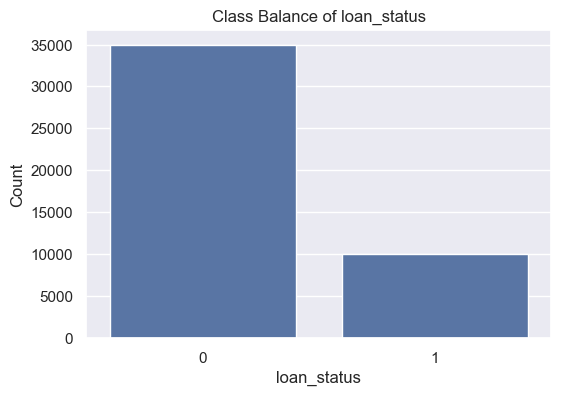

In [75]:
plt.figure(figsize=(6, 4))

sns.countplot(
    x=y_cls
)

plt.title("Class Balance of loan_status")
plt.xlabel("loan_status")
plt.ylabel("Count")
plt.show()

Feature Engineering Exploration

First, we use a pairplot to see the main numerical features.

The target class is shown with different colors.

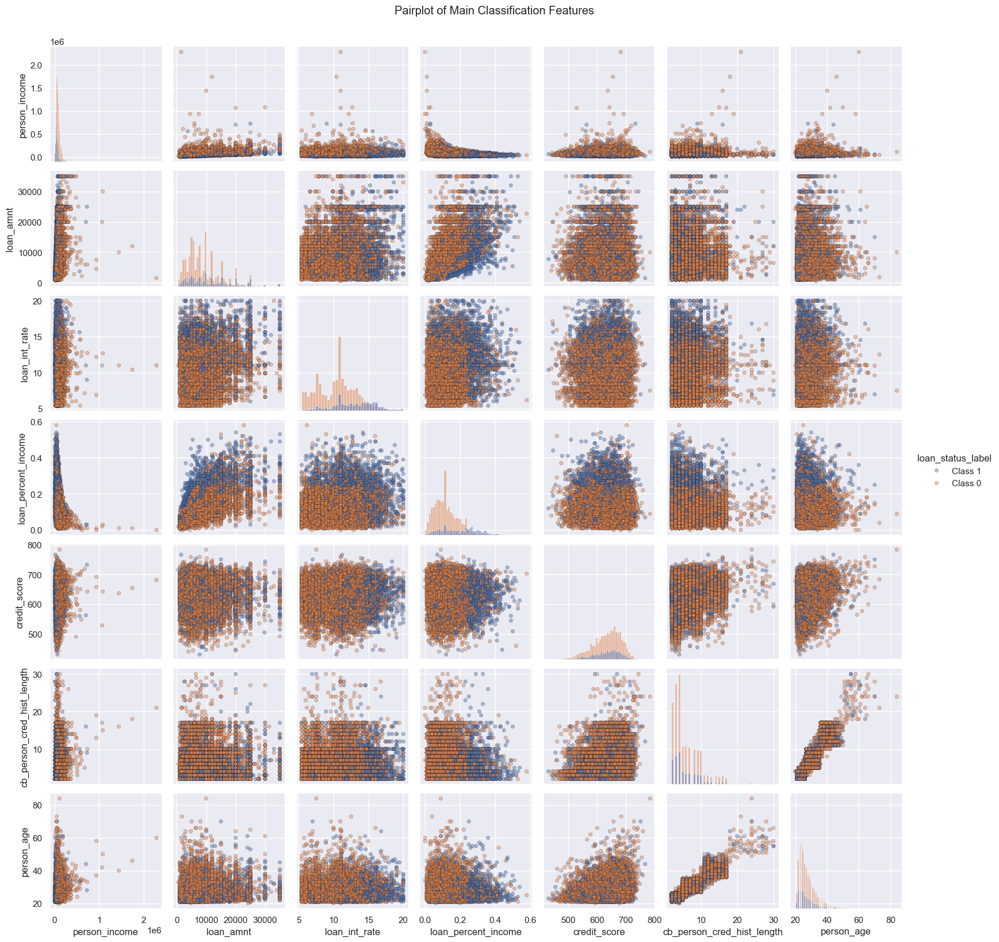

In [76]:
classification_pairplot_features = [
    "person_income",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "credit_score",
    "cb_person_cred_hist_length",
    "person_age"
]

classification_pairplot_features = [
    col for col in classification_pairplot_features
    if col in df.columns
]

pairplot_df_cls = df[classification_pairplot_features + [binary_target]].copy()

pairplot_df_cls["loan_status_label"] = pairplot_df_cls[binary_target].map({
    0: "Class 0",
    1: "Class 1"
})

pairplot_sample_cls = pairplot_df_cls.sample(
    n=min(10000, len(pairplot_df_cls)),
    random_state=42
)

sns.pairplot(
    pairplot_sample_cls,
    vars=classification_pairplot_features,
    hue="loan_status_label",
    diag_kind="hist",
    plot_kws={
        "alpha": 0.45,
        "s": 20,
        "edgecolor": "k"
    },
    height=2.3
)

plt.suptitle("Pairplot of Main Classification Features", y=1.02)
plt.show()

Add New Features

In [77]:
X_cls_fe = X_cls.copy()

eps = 1e-6

if "person_income" in X_cls_fe.columns:
    X_cls_fe["log_person_income"] = np.log1p(X_cls_fe["person_income"])

if "loan_amnt" in X_cls_fe.columns:
    X_cls_fe["log_loan_amnt"] = np.log1p(X_cls_fe["loan_amnt"])

if {"loan_int_rate", "loan_amnt" , "person_income"}.issubset(X_cls_fe.columns):
    X_cls_fe["whole_loan_percent_income"] = (
        (X_cls_fe["loan_int_rate"] * X_cls_fe["loan_amnt"] + X_cls_fe["loan_amnt"]) / (X_cls_fe["person_income"] * 100)
    )

if {"whole_loan_percent_income", "credit_score"}.issubset(X_cls_fe.columns):
    X_cls_fe["loan_credit"] = (
        X_cls_fe["whole_loan_percent_income"] * X_cls_fe["credit_score"] 
    )

if {"loan_int_rate", "loan_percent_income"}.issubset(X_cls_fe.columns):
    X_cls_fe["interest_burden"] = (
        X_cls_fe["loan_int_rate"] * X_cls_fe["loan_percent_income"]
    )

if {"person_emp_exp", "person_age"}.issubset(X_cls_fe.columns):
    X_cls_fe["employment_experience_ratio"] = (
        X_cls_fe["person_emp_exp"] / np.maximum(X_cls_fe["person_age"] - 18, 1)
    )

if {"loan_int_rate", "credit_score"}.issubset(X_cls_fe.columns):
    X_cls_fe["interest_per_credit_score"] = (
        X_cls_fe["loan_int_rate"] / (X_cls_fe["credit_score"] + eps)
    )

if {"previous_loan_defaults_on_file", "loan_int_rate"}.issubset(X_cls_fe.columns):
    X_cls_fe["default_interest_interaction"] = (
        X_cls_fe["previous_loan_defaults_on_file"] * X_cls_fe["loan_int_rate"]
    )

if "whole_loan_percent_income" in X_cls_fe.columns:
    X_cls_fe["high_loan_burden"] = (
        X_cls_fe["whole_loan_percent_income"] > X_cls_fe["whole_loan_percent_income"].mean()
    ).astype(int)

if "loan_int_rate" in X_cls_fe.columns:
    X_cls_fe["high_interest_rate"] = (
        X_cls_fe["loan_int_rate"] > X_cls_fe["loan_int_rate"].quantile(0.75)
    ).astype(int)

if {"loan_amnt", "loan_int_rate"}.issubset(X_cls_fe.columns):
    X_cls_fe["annual_interest_amount"] = (
        X_cls_fe["loan_amnt"] * X_cls_fe["loan_int_rate"] / 100
    )
    
if "person_age" in X_cls_fe.columns:
    X_cls_fe["young_applicant"] = (
        X_cls_fe["person_age"] < 25
    ).astype(int)

if "person_income" in X_cls_fe.columns:
    X_cls_fe["low_income_applicant"] = (
        X_cls_fe["person_income"] < X_cls_fe["person_income"].quantile(0.25)
    ).astype(int)

if "person_income" in X_cls_fe.columns:
    X_cls_fe["high_income_applicant"] = (
        X_cls_fe["person_income"] > X_cls_fe["person_income"].quantile(0.75)
    ).astype(int)

if "cb_person_cred_hist_length" in X_cls_fe.columns:
    X_cls_fe["short_credit_history"] = (
        X_cls_fe["cb_person_cred_hist_length"] <= 2
    ).astype(int)

reference_dummy_columns_cls = [
    "person_education_High School",
    "person_home_ownership_RENT",
    "loan_intent_PERSONAL"
]

reference_dummy_columns_cls = [
    col for col in reference_dummy_columns_cls
    if col in X_cls_fe.columns
]

X_cls_fe = X_cls_fe.drop(columns=reference_dummy_columns_cls)

X_cls_fe = X_cls_fe.replace([np.inf, -np.inf], np.nan)
X_cls_fe = X_cls_fe.fillna(X_cls_fe.median(numeric_only=True))

new_classification_features = [
    col for col in X_cls_fe.columns
    if col not in X_cls.columns
]

print("New features:")
print(new_classification_features)

print("\nRemoved reference dummy columns:")
print(reference_dummy_columns_cls)

print("\nShape before feature engineering:", X_cls.shape)
print("Shape after feature engineering:", X_cls_fe.shape)

X_cls_fe.head()

New features:
['log_person_income', 'log_loan_amnt', 'whole_loan_percent_income', 'loan_credit', 'interest_burden', 'employment_experience_ratio', 'interest_per_credit_score', 'default_interest_interaction', 'high_loan_burden', 'high_interest_rate', 'annual_interest_amount', 'young_applicant', 'low_income_applicant', 'high_income_applicant', 'short_credit_history']

Removed reference dummy columns:
['person_education_High School', 'person_home_ownership_RENT', 'loan_intent_PERSONAL']

Shape before feature engineering: (44993, 25)
Shape after feature engineering: (44993, 37)


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,employment_experience_ratio,interest_per_credit_score,default_interest_interaction,high_loan_burden,high_interest_rate,annual_interest_amount,young_applicant,low_income_applicant,high_income_applicant,short_credit_history
0,22.0,0,71948.0,0,35000.0,16.02,0.49,3.0,561,0,...,0.000000,0.028556,0.00,1,1,5607.00,1,0,0,0
1,21.0,0,12282.0,0,1000.0,11.14,0.08,2.0,504,1,...,0.000000,0.022103,11.14,0,0,111.40,1,1,0,1
2,25.0,0,12438.0,3,5500.0,12.87,0.44,3.0,635,0,...,0.428571,0.020268,0.00,1,0,707.85,0,1,0,0
3,23.0,0,79753.0,0,35000.0,15.23,0.44,2.0,675,0,...,0.000000,0.022563,0.00,1,1,5330.50,1,0,0,1
4,24.0,1,66135.0,1,35000.0,14.27,0.53,4.0,586,0,...,0.166667,0.024352,0.00,1,1,4994.50,1,0,0,0


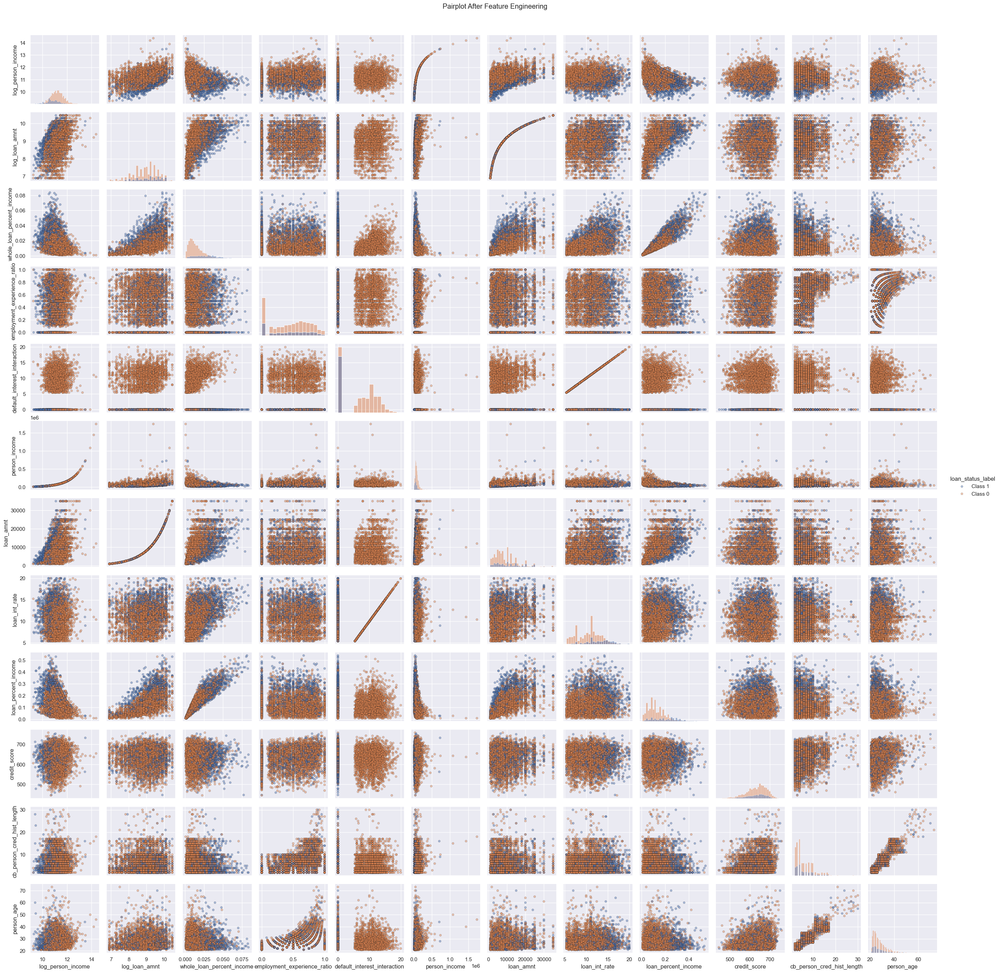

In [78]:
classification_pairplot_features = [
    "log_person_income",
    "log_loan_amnt",
    "whole_loan_percent_income",
    "employment_experience_ratio",
    "default_interest_interaction",
    "person_income",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "credit_score",
    "cb_person_cred_hist_length",
    "person_age"
]

# Keep only columns that exist after feature engineering
classification_pairplot_features = [
    col for col in classification_pairplot_features
    if col in X_cls_fe.columns
]

pairplot_df_cls = X_cls_fe[classification_pairplot_features].copy()

# Add target column for coloring the classes
pairplot_df_cls[binary_target] = y_cls.values

pairplot_df_cls["loan_status_label"] = pairplot_df_cls[binary_target].map({
    0: "Class 0",
    1: "Class 1"
})

# Use a sample to make pairplot faster
pairplot_sample_cls = pairplot_df_cls.sample(
    n=min(5000, len(pairplot_df_cls)),
    random_state=42
)

sns.pairplot(
    data=pairplot_sample_cls,
    vars=classification_pairplot_features,
    hue="loan_status_label",
    diag_kind="hist",
    plot_kws={
        "alpha": 0.45,
        "s": 20,
        "edgecolor": "k"
    },
    height=2.3
)

plt.suptitle("Pairplot After Feature Engineering", y=1.02)
plt.show()

Train and Test Split

In [79]:
from sklearn.model_selection import train_test_split

X_train_cls, X_test_cls, y_train_cls, y_test_cls = train_test_split(
    X_cls_fe,
    y_cls,
    test_size=0.25,
    random_state=42,
    stratify=y_cls
)

print("X_train_cls shape:", X_train_cls.shape)
print("X_test_cls shape:", X_test_cls.shape)
print("y_train_cls shape:", y_train_cls.shape)
print("y_test_cls shape:", y_test_cls.shape)

X_train_cls shape: (33744, 37)
X_test_cls shape: (11249, 37)
y_train_cls shape: (33744,)
y_test_cls shape: (11249,)


In [80]:
split_balance_df = pd.DataFrame({
    "Train Percent": (y_train_cls.value_counts(normalize=True).sort_index() * 100).round(2),
    "Test Percent": (y_test_cls.value_counts(normalize=True).sort_index() * 100).round(2)
})

split_balance_df

,Train Percent,Test Percent
loan_status,,
0,77.77,77.78
1,22.23,22.22


Feature Scaling

Some models need scaled data.

In [81]:
from sklearn.preprocessing import StandardScaler

binary_features_cls = [
    col for col in X_train_cls.columns
    if X_train_cls[col].nunique() <= 2
]

continuous_features_cls = [
    col for col in X_train_cls.columns
    if col not in binary_features_cls
]

print("Number of continuous features:", len(continuous_features_cls))
print("Number of binary / one-hot features:", len(binary_features_cls))

print("\nContinuous features:")
print(continuous_features_cls)

print("\nBinary / one-hot features:")
print(binary_features_cls)

Number of continuous features: 17
Number of binary / one-hot features: 20

Continuous features:
['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'log_person_income', 'log_loan_amnt', 'whole_loan_percent_income', 'loan_credit', 'interest_burden', 'employment_experience_ratio', 'interest_per_credit_score', 'default_interest_interaction', 'annual_interest_amount']

Binary / one-hot features:
['person_gender', 'previous_loan_defaults_on_file', 'person_education_Associate', 'person_education_Bachelor', 'person_education_Doctorate', 'person_education_Master', 'person_home_ownership_MORTGAGE', 'person_home_ownership_OTHER', 'person_home_ownership_OWN', 'loan_intent_DEBTCONSOLIDATION', 'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL', 'loan_intent_VENTURE', 'high_loan_burden', 'high_interest_rate', 'young_applicant', 'low_income_applicant', 'high_income_applicant', '

In [82]:
scaler_cls = StandardScaler()

X_train_cls_scaled = X_train_cls.copy()
X_test_cls_scaled = X_test_cls.copy()

if len(continuous_features_cls) > 0:
    X_train_cls_scaled[continuous_features_cls] = scaler_cls.fit_transform(
        X_train_cls[continuous_features_cls]
    )

    X_test_cls_scaled[continuous_features_cls] = scaler_cls.transform(
        X_test_cls[continuous_features_cls]
    )

print("NaN in train:", X_train_cls_scaled.isna().sum().sum())
print("NaN in test:", X_test_cls_scaled.isna().sum().sum())

X_train_cls_scaled.head()

NaN in train: 0
NaN in test: 0


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,employment_experience_ratio,interest_per_credit_score,default_interest_interaction,high_loan_burden,high_interest_rate,annual_interest_amount,young_applicant,low_income_applicant,high_income_applicant,short_credit_history
41179,1.902416,0,1.563976,1.788128,0.387476,0.025877,-0.797691,2.871131,0.921696,1,...,1.067280,-0.239369,1.036014,0,0,0.293794,0,0,1,0
4843,-0.296876,1,-0.561309,-0.236878,-0.725757,-0.212742,-0.337934,-0.484113,0.842158,0,...,0.205521,-0.431973,-0.951263,0,0,-0.659165,0,1,0,0
44296,-0.635228,0,0.006986,-0.574379,1.659741,1.124868,1.271215,-0.484113,-1.504204,0,...,-0.342871,1.665176,-0.951263,1,1,2.103608,1,0,0,0
1038,-0.296876,1,0.262727,-0.743129,1.341675,0.956826,0.581580,-0.742209,0.563776,1,...,-1.028361,0.695267,1.532833,1,1,1.660671,0,0,1,0
44886,-0.804404,0,-0.949632,-0.911880,-0.715738,0.143506,1.501094,-0.484113,-0.947440,0,...,-1.439655,0.410007,-0.951263,1,0,-0.588435,1,1,0,0


Classification Evaluation Function

We create one function for all classification models.

Main Evaluation Metric: F1 Score

For this binary classification task, I use **F1 Score** as the main metric.

Accuracy is easy to understand, but it can be misleading when the classes are not perfectly balanced.  
In this dataset, predicting `loan_status` is important because both false positives and false negatives can affect the final decision.

Precision shows how many predicted positive cases are actually positive.  
Recall shows how many real positive cases the model can find.  
F1 Score combines Precision and Recall into one score.

Because I want a balance between Precision and Recall, F1 Score is a better main metric than Accuracy for this problem.  
ROC AUC is also useful, but F1 Score is easier to connect to the final class prediction.

In [83]:
# Evaluation metrics and plots
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    roc_curve,
    auc
)

# Store final results and best models
classification_final_results = []
classification_best_models = {}


def get_y_score(model, X_data):
    # Get probability or decision score for ROC AUC
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X_data)[:, 1]
    
    if hasattr(model, "decision_function"):
        return model.decision_function(X_data)
    
    return model.predict(X_data)


def get_model_score(model, X_data, y_data):
    # Calculate classification metrics
    y_pred = model.predict(X_data)
    y_score = get_y_score(model, X_data)
    
    return {
        "Accuracy": accuracy_score(y_data, y_pred),
        "Precision": precision_score(y_data, y_pred, zero_division=0),
        "Recall": recall_score(y_data, y_pred, zero_division=0),
        "F1 Score": f1_score(y_data, y_pred, zero_division=0),
        "ROC AUC": roc_auc_score(y_data, y_score)
    }


def evaluate_train_test(model, X_train_data, X_test_data, y_train_data, y_test_data):
    # Evaluate model on train and test sets
    train_scores = get_model_score(model, X_train_data, y_train_data)
    test_scores = get_model_score(model, X_test_data, y_test_data)
    
    result = {}
    
    for key, value in train_scores.items():
        result[f"Train {key}"] = value
        
    for key, value in test_scores.items():
        result[f"Test {key}"] = value
        
    return result


def plot_train_test_f1(results_df, param_cols, title):
    # Plot train/test F1 for hyperparameter tuning
    plot_df = results_df.copy()
    plot_df["Setting"] = plot_df[param_cols].astype(str).agg(" | ".join, axis=1)
    
    plt.figure(figsize=(11, 4))
    
    plt.plot(
        plot_df["Setting"],
        plot_df["Train F1 Score"],
        marker="o",
        label="Train F1"
    )
    
    plt.plot(
        plot_df["Setting"],
        plot_df["Test F1 Score"],
        marker="o",
        label="Test F1"
    )
    
    plt.title(title)
    plt.xlabel("Hyperparameter setting")
    plt.ylabel("F1 Score")
    plt.xticks(rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_test_confusion_matrix(model, X_test_data, y_test_data, title):
    # Plot confusion matrix on test data
    y_pred = model.predict(X_test_data)
    cm = confusion_matrix(y_test_data, y_pred)
    
    plt.figure(figsize=(5, 4))
    
    sns.heatmap(
        cm,
        annot=True,
        fmt="d"
    )
    
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


def plot_test_roc_curve(model, X_test_data, y_test_data, title):
    # Plot ROC curve on test data
    y_score = get_y_score(model, X_test_data)
    
    fpr, tpr, thresholds = roc_curve(y_test_data, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(6, 5))
    
    plt.plot(
        fpr,
        tpr,
        label=f"AUC = {roc_auc:.4f}"
    )
    
    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Random Classifier"
    )
    
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()


def save_model_result(model_name, best_row, best_params, best_model, X_test_data):
    # Save best model and its test results
    global classification_final_results
    
    classification_final_results = [
        row for row in classification_final_results
        if row["Model"] != model_name
    ]
    
    classification_final_results.append({
        "Model": model_name,
        "Accuracy": best_row["Test Accuracy"],
        "Precision": best_row["Test Precision"],
        "Recall": best_row["Test Recall"],
        "F1 Score": best_row["Test F1 Score"],
        "ROC AUC": best_row["Test ROC AUC"],
        "Best Parameters": best_params
    })
    
    classification_best_models[model_name] = {
        "model": best_model,
        "X_test": X_test_data
    }


def run_model_grid(
    model_name,
    config_list,
    X_train_data,
    X_test_data,
    y_train_data,
    y_test_data,
    param_cols
):
    # Train all model settings
    results = []
    trained_models = []
    
    for config in config_list:
        model = config["model"]
        params = config["params"]
        
        model.fit(X_train_data, y_train_data)
        
        scores = evaluate_train_test(
            model,
            X_train_data,
            X_test_data,
            y_train_data,
            y_test_data
        )
        
        results.append({
            **params,
            **scores
        })
        
        trained_models.append(model)
    
    results_df = pd.DataFrame(results)
    
    # Show train/test comparison
    plot_train_test_f1(
        results_df,
        param_cols,
        f"{model_name} - Train vs Test F1"
    )
    
    # Select best model by test F1
    best_index = results_df["Test F1 Score"].idxmax()
    best_row = results_df.loc[best_index]
    best_model = trained_models[best_index]
    
    best_params = {
        col: best_row[col]
        for col in param_cols
    }
    
    save_model_result(
        model_name,
        best_row,
        best_params,
        best_model,
        X_test_data
    )
    
    print("Best parameters:", best_params)
    
    plot_test_confusion_matrix(
        best_model,
        X_test_data,
        y_test_data,
        f"Confusion Matrix - {model_name}"
    )
    
    plot_test_roc_curve(
        best_model,
        X_test_data,
        y_test_data,
        f"ROC Curve - {model_name}"
    )
    
    return results_df.sort_values(
        by="Test F1 Score",
        ascending=False
    ).round(4), best_model

Logistic Regression

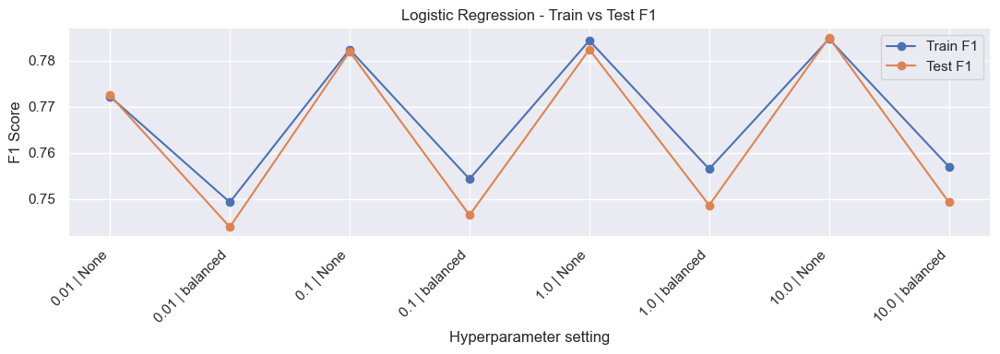

Best parameters: {'C': np.float64(10.0), 'class_weight': 'None'}


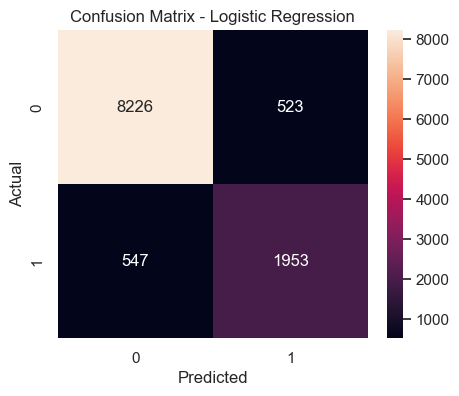

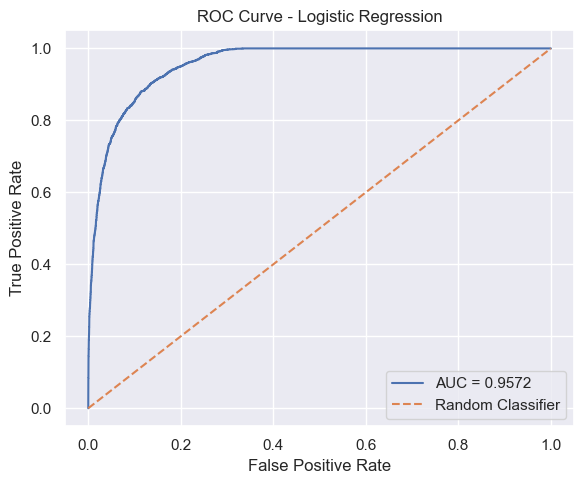

,C,class_weight,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
6,10.00,None,0.9050,0.7903,0.7791,0.7847,0.9600,0.9049,0.7888,0.7812,0.7850,0.9572
4,1.00,None,0.9049,0.7906,0.7781,0.7843,0.9599,0.9038,0.7868,0.7780,0.7824,0.9572
2,0.10,None,0.9042,0.7905,0.7744,0.7824,0.9594,0.9039,0.7888,0.7752,0.7819,0.9567
0,0.01,None,0.9008,0.7882,0.7568,0.7722,0.9568,0.9006,0.7862,0.7592,0.7725,0.9541
7,10.00,balanced,0.8679,0.6404,0.9255,0.7570,0.9598,0.8635,0.6332,0.9176,0.7493,0.9571
5,1.00,balanced,0.8675,0.6396,0.9257,0.7565,0.9598,0.8630,0.6321,0.9180,0.7487,0.9571
3,0.10,balanced,0.8661,0.6370,0.9245,0.7543,0.9594,0.8615,0.6292,0.9176,0.7465,0.9568
1,0.01,balanced,0.8622,0.6290,0.9265,0.7493,0.9573,0.8586,0.6224,0.9244,0.7439,0.9546


In [84]:
from sklearn.linear_model import LogisticRegression

logistic_configs = []

for C in [0.01, 0.1, 1, 10]:
    for class_weight in [None, "balanced"]:
        
        logistic_configs.append({
            "params": {
                "C": C,
                "class_weight": "None" if class_weight is None else "balanced"
            },
            "model": LogisticRegression(
                C=C,
                class_weight=class_weight,
                solver="liblinear",
                max_iter=1000,
                random_state=42
            )
        })

logistic_results_df, best_logistic_model = run_model_grid(
    model_name="Logistic Regression",
    config_list=logistic_configs,
    X_train_data=X_train_cls_scaled,
    X_test_data=X_test_cls_scaled,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["C", "class_weight"]
)

logistic_results_df

Linear SVM

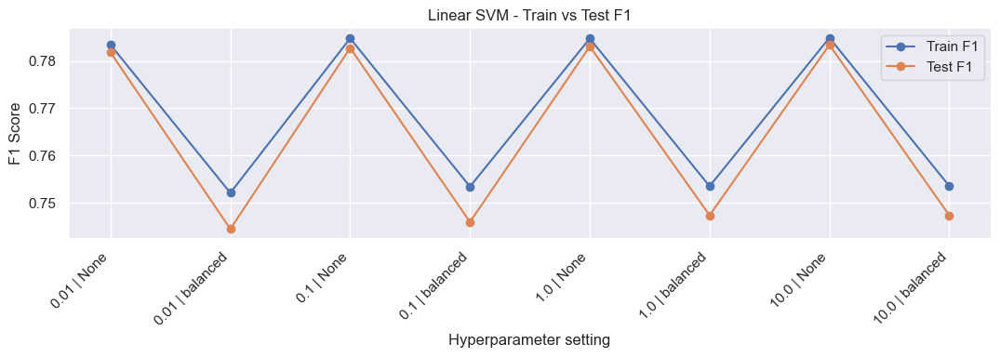

Best parameters: {'C': np.float64(10.0), 'class_weight': 'None'}


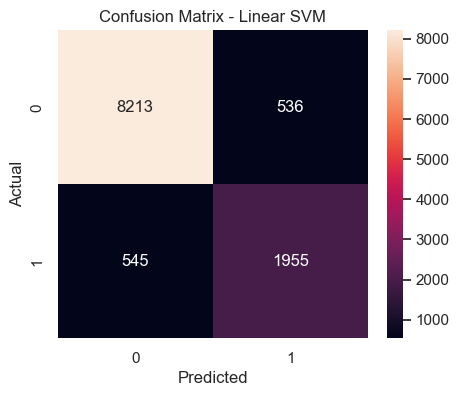

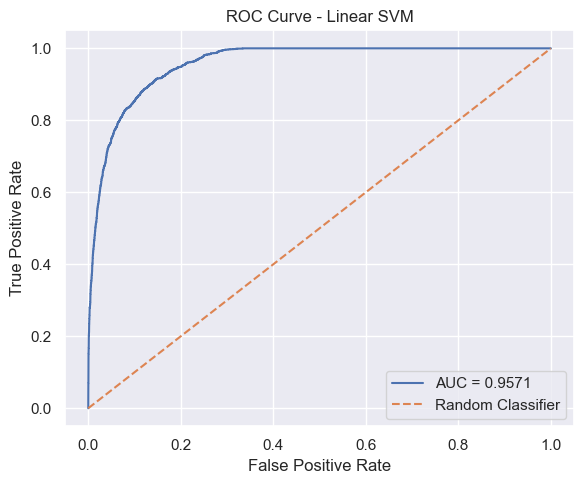

,C,class_weight,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
6,10.00,None,0.9048,0.7887,0.7812,0.7849,0.9599,0.9039,0.7848,0.7820,0.7834,0.9571
4,1.00,None,0.9048,0.7883,0.7812,0.7848,0.9599,0.9037,0.7842,0.7820,0.7831,0.9571
2,0.10,None,0.9048,0.7890,0.7807,0.7848,0.9598,0.9036,0.7843,0.7812,0.7828,0.9570
0,0.01,None,0.9044,0.7888,0.7781,0.7834,0.9591,0.9036,0.7869,0.7768,0.7818,0.9563
5,1.00,balanced,0.8650,0.6340,0.9284,0.7535,0.9600,0.8613,0.6279,0.9228,0.7473,0.9574
7,10.00,balanced,0.8650,0.6342,0.9283,0.7535,0.9600,0.8613,0.6279,0.9228,0.7473,0.9574
3,0.10,balanced,0.8649,0.6337,0.9288,0.7534,0.9600,0.8603,0.6261,0.9224,0.7459,0.9574
1,0.01,balanced,0.8637,0.6314,0.9299,0.7521,0.9597,0.8590,0.6233,0.9240,0.7444,0.9572


In [85]:
from sklearn.svm import LinearSVC

linear_svm_configs = []

for C in [0.01, 0.1, 1, 10]:
    for class_weight in [None, "balanced"]:
        
        linear_svm_configs.append({
            "params": {
                "C": C,
                "class_weight": "None" if class_weight is None else "balanced"
            },
            "model": LinearSVC(
                C=C,
                class_weight=class_weight,
                max_iter=20000,
                dual=False,
                random_state=42
            )
        })

linear_svm_results_df, best_linear_svm_model = run_model_grid(
    model_name="Linear SVM",
    config_list=linear_svm_configs,
    X_train_data=X_train_cls_scaled,
    X_test_data=X_test_cls_scaled,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["C", "class_weight"]
)

linear_svm_results_df

Kernel SVM

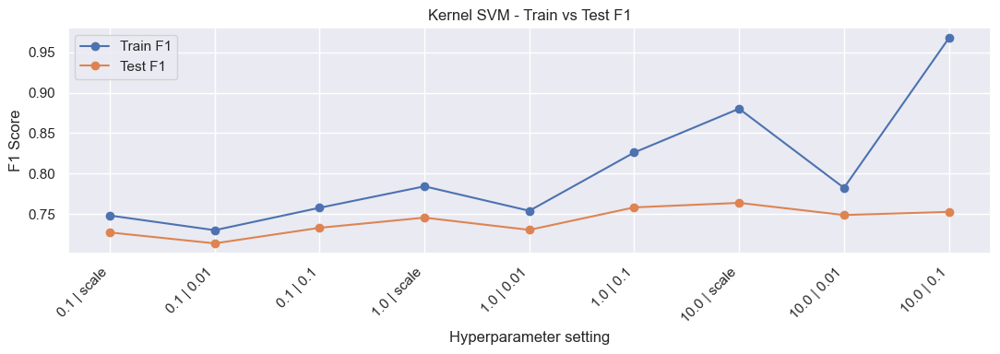

Best parameters: {'C': np.float64(10.0), 'gamma': 'scale'}


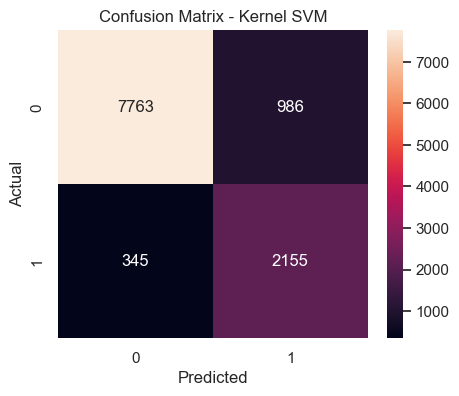

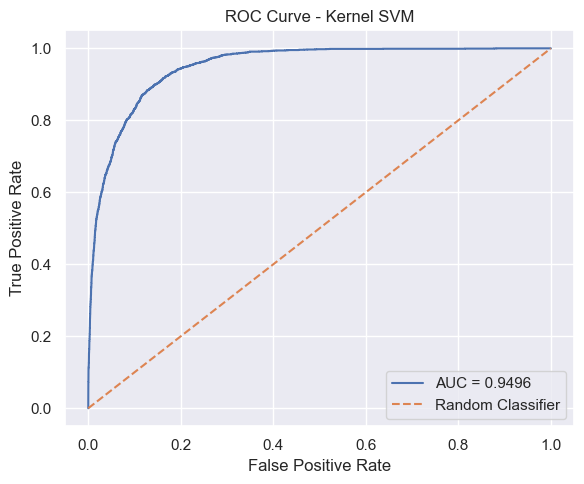

,C,gamma,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
6,10.0,scale,0.9403,0.7984,0.9806,0.8802,0.9887,0.8817,0.6861,0.8620,0.7640,0.9496
5,1.0,0.1,0.9093,0.7228,0.9642,0.8262,0.9843,0.8728,0.6561,0.8988,0.7585,0.9491
8,10.0,0.1,0.9848,0.9377,0.9985,0.9671,0.9989,0.8859,0.7260,0.7820,0.7529,0.9378
7,10.0,0.01,0.8818,0.6646,0.9515,0.7826,0.9706,0.8632,0.6323,0.9188,0.7491,0.9585
3,1.0,scale,0.8827,0.6655,0.9553,0.7844,0.9721,0.8612,0.6289,0.9160,0.7458,0.9553
2,0.1,0.1,0.8652,0.6329,0.9448,0.7580,0.9600,0.8499,0.6058,0.9288,0.7333,0.9447
4,1.0,0.01,0.8613,0.6244,0.9523,0.7543,0.9621,0.8475,0.6014,0.9308,0.7307,0.9556
0,0.1,scale,0.8582,0.6200,0.9441,0.7484,0.9574,0.8449,0.5967,0.9320,0.7276,0.9492
1,0.1,0.01,0.8433,0.5935,0.9493,0.7303,0.9532,0.8324,0.5751,0.9416,0.7141,0.9488


In [86]:
from sklearn.svm import SVC

kernel_svm_sample_size = min(6000, len(X_train_cls_scaled))

X_train_kernel_svm = X_train_cls_scaled.sample(
    n=kernel_svm_sample_size,
    random_state=42
)

y_train_kernel_svm = y_train_cls.loc[X_train_kernel_svm.index]

kernel_svm_configs = []

for C in [0.1, 1, 10]:
    for gamma in ["scale", 0.01, 0.1]:
        
        kernel_svm_configs.append({
            "params": {
                "C": C,
                "gamma": gamma
            },
            "model": SVC(
                kernel="rbf",
                C=C,
                gamma=gamma,
                class_weight="balanced",
                cache_size=700,
                random_state=42
            )
        })

kernel_svm_results_df, best_kernel_svm_model = run_model_grid(
    model_name="Kernel SVM",
    config_list=kernel_svm_configs,
    X_train_data=X_train_kernel_svm,
    X_test_data=X_test_cls_scaled,
    y_train_data=y_train_kernel_svm,
    y_test_data=y_test_cls,
    param_cols=["C", "gamma"]
)

kernel_svm_results_df

KNN

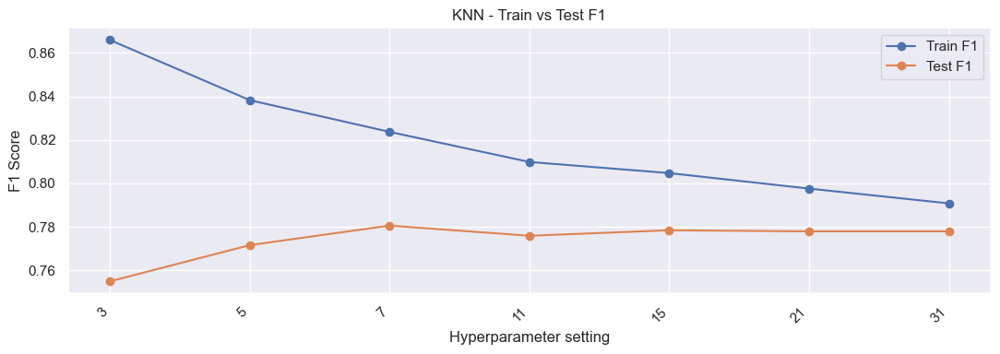

Best parameters: {'K': np.float64(7.0)}


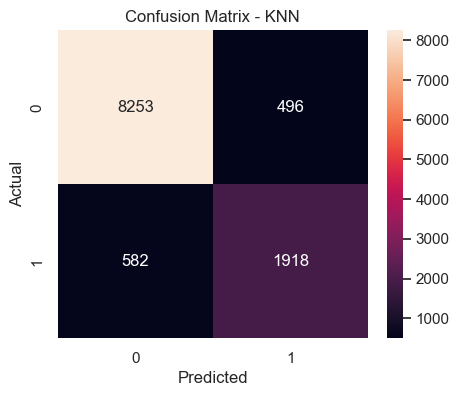

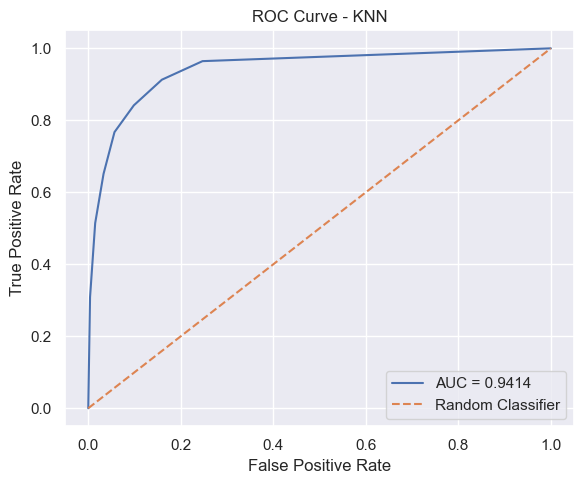

,K,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
2,7,0.9235,0.8442,0.8041,0.8237,0.9739,0.9042,0.7945,0.7672,0.7806,0.9414
4,15,0.9157,0.8298,0.7812,0.8048,0.9679,0.9041,0.7997,0.7584,0.7785,0.9541
6,31,0.9102,0.8202,0.7635,0.7908,0.9639,0.9050,0.8091,0.7492,0.7780,0.9568
5,21,0.9128,0.8241,0.7728,0.7976,0.9658,0.9046,0.8058,0.7520,0.7780,0.9560
3,11,0.9177,0.8324,0.7885,0.8099,0.9699,0.9029,0.7965,0.7564,0.7760,0.9510
1,5,0.9294,0.8537,0.8233,0.8383,0.9775,0.9003,0.7862,0.7576,0.7716,0.9328
0,3,0.9410,0.8754,0.8565,0.8659,0.9833,0.8915,0.7581,0.7520,0.7550,0.9091


In [87]:
from sklearn.neighbors import KNeighborsClassifier

knn_configs = []

for k in [3, 5, 7, 11, 15, 21, 31]:
    
    knn_configs.append({
        "params": {
            "K": k
        },
        "model": KNeighborsClassifier(
            n_neighbors=k,
            n_jobs=-1
        )
    })

knn_results_df, best_knn_model = run_model_grid(
    model_name="KNN",
    config_list=knn_configs,
    X_train_data=X_train_cls_scaled,
    X_test_data=X_test_cls_scaled,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["K"]
)

knn_results_df

Decision Tree

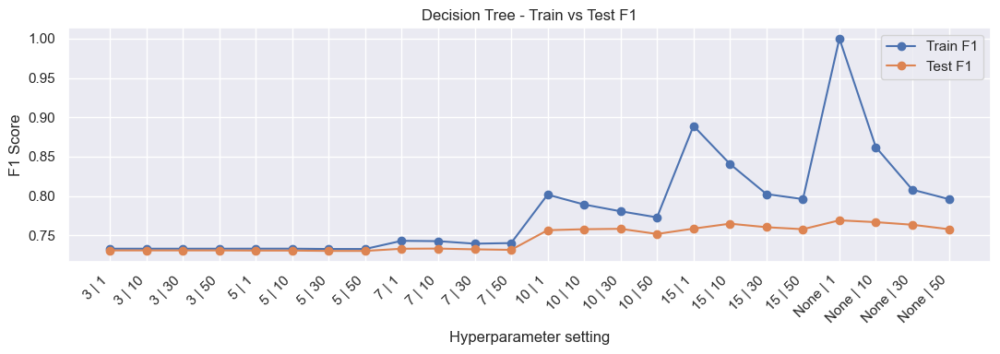

Best parameters: {'max_depth': 'None', 'min_samples_leaf': np.int64(1)}


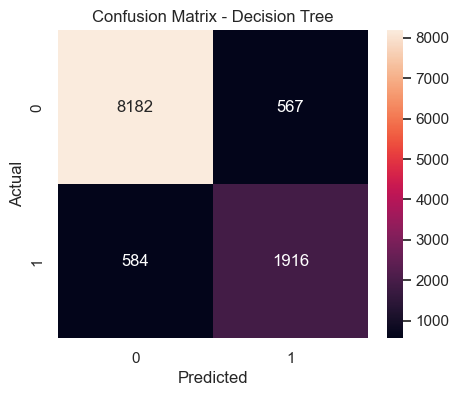

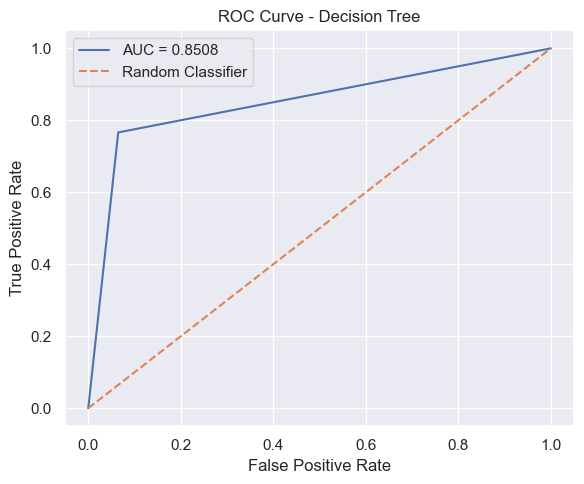

,max_depth,min_samples_leaf,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
20,None,1,1.0000,1.0000,1.0000,1.0000,1.0000,0.8977,0.7716,0.7664,0.7690,0.8508
21,None,10,0.9313,0.7790,0.9648,0.8620,0.9891,0.8829,0.6881,0.8656,0.7667,0.9325
17,15,10,0.9199,0.7533,0.9508,0.8406,0.9859,0.8809,0.6815,0.8712,0.7647,0.9403
22,None,30,0.9001,0.7054,0.9455,0.8080,0.9789,0.8763,0.6641,0.8976,0.7634,0.9580
18,15,30,0.8964,0.6963,0.9465,0.8024,0.9781,0.8739,0.6581,0.9000,0.7603,0.9576
16,15,1,0.9460,0.8179,0.9737,0.8890,0.9939,0.8826,0.6986,0.8296,0.7585,0.9025
14,10,30,0.8828,0.6684,0.9379,0.7805,0.9734,0.8704,0.6476,0.9144,0.7582,0.9618
19,15,50,0.8938,0.6948,0.9317,0.7960,0.9747,0.8732,0.6586,0.8920,0.7577,0.9591
23,None,50,0.8938,0.6948,0.9317,0.7960,0.9747,0.8732,0.6586,0.8920,0.7577,0.9591
13,10,10,0.8880,0.6786,0.9427,0.7891,0.9763,0.8715,0.6520,0.9044,0.7577,0.9596


In [88]:
from sklearn.tree import DecisionTreeClassifier

decision_tree_configs = []

for max_depth in [3, 5, 7, 10, 15, None]:
    for min_samples_leaf in [1, 10, 30, 50]:
        
        decision_tree_configs.append({
            "params": {
                "max_depth": "None" if max_depth is None else max_depth,
                "min_samples_leaf": min_samples_leaf
            },
            "model": DecisionTreeClassifier(
                max_depth=max_depth,
                min_samples_leaf=min_samples_leaf,
                class_weight="balanced",
                random_state=42
            )
        })

decision_tree_results_df, best_decision_tree_model = run_model_grid(
    model_name="Decision Tree",
    config_list=decision_tree_configs,
    X_train_data=X_train_cls,
    X_test_data=X_test_cls,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["max_depth", "min_samples_leaf"]
)

decision_tree_results_df

Top Feature Weights and Importance

Linear models have direct coefficients.  
Kernel SVM and KNN do not have direct coefficients, so we use permutation importance.

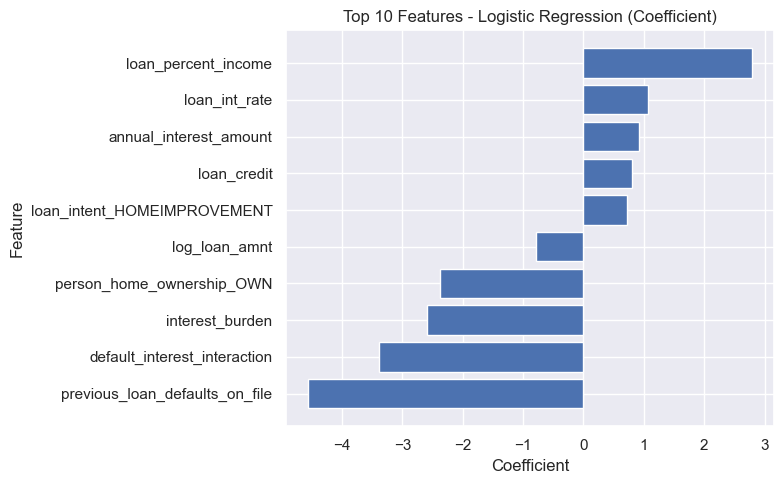

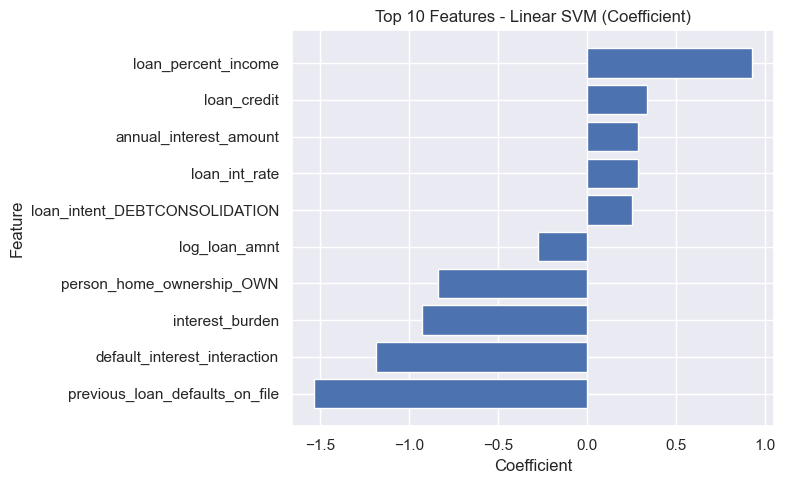

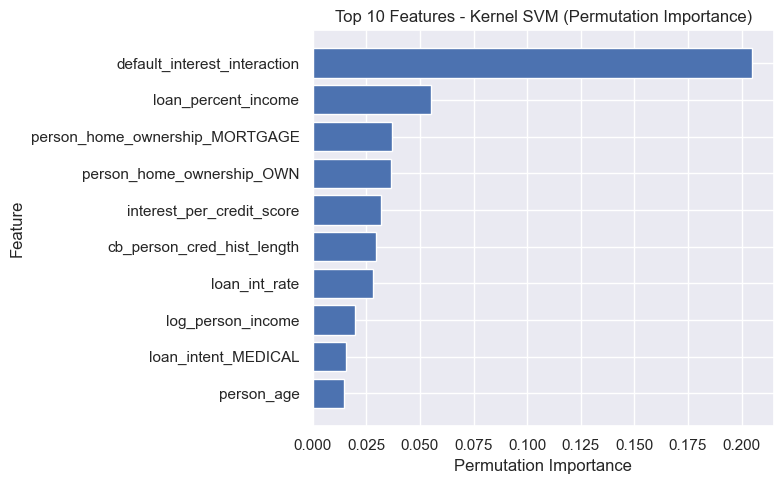

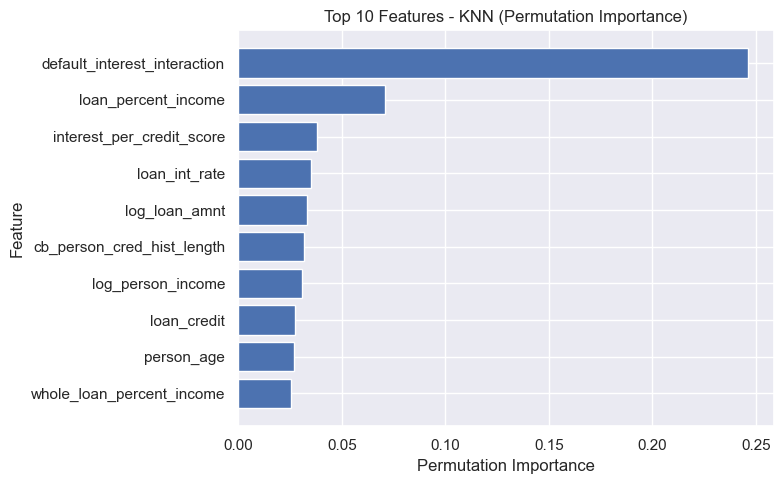

In [89]:
from sklearn.inspection import permutation_importance

def get_feature_importance_df(
    model,
    X_data,
    y_data,
    model_name,
    top_n=10,
    sample_size=1000
):
    # Get feature names
    feature_names = X_data.columns
    
    # Linear models: use coefficients
    if hasattr(model, "coef_"):
        importance_values = np.ravel(model.coef_)
        importance_type = "Coefficient"
    
    # Tree models: use built-in importance
    elif hasattr(model, "feature_importances_"):
        importance_values = model.feature_importances_
        importance_type = "Feature Importance"
    
    # Other models: use permutation importance
    else:
        X_sample = X_data.sample(
            n=min(sample_size, len(X_data)),
            random_state=42
        )
        
        y_sample = y_data.loc[X_sample.index]
        
        perm_result = permutation_importance(
            model,
            X_sample,
            y_sample,
            scoring="f1",
            n_repeats=2,
            random_state=42,
            n_jobs=-1
        )
        
        importance_values = perm_result.importances_mean
        importance_type = "Permutation Importance"
    
    importance_df = pd.DataFrame({
        "Feature": feature_names,
        "Importance": importance_values
    })
    
    importance_df["Abs Importance"] = importance_df["Importance"].abs()
    
    top_importance_df = importance_df.sort_values(
        by="Abs Importance",
        ascending=False
    ).head(top_n)
    
    top_importance_df = top_importance_df.sort_values(
        by="Importance",
        ascending=True
    )
    
    plt.figure(figsize=(8, 5))
    
    plt.barh(
        top_importance_df["Feature"],
        top_importance_df["Importance"]
    )
    
    plt.title(f"Top {top_n} Features - {model_name} ({importance_type})")
    plt.xlabel(importance_type)
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()
    
    return top_importance_df.sort_values(
        by="Abs Importance",
        ascending=False
    )


feature_importance_tables = {}

models_to_explain = [
    "Logistic Regression",
    "Linear SVM",
    "Kernel SVM",
    "KNN"
]

for model_name in models_to_explain:
    if model_name in classification_best_models:
        
        model = classification_best_models[model_name]["model"]
        X_test_model = classification_best_models[model_name]["X_test"]
        
        feature_importance_tables[model_name] = get_feature_importance_df(
            model=model,
            X_data=X_test_model,
            y_data=y_test_cls,
            model_name=model_name,
            top_n=10,
            sample_size=1000
        )

Decision Tree

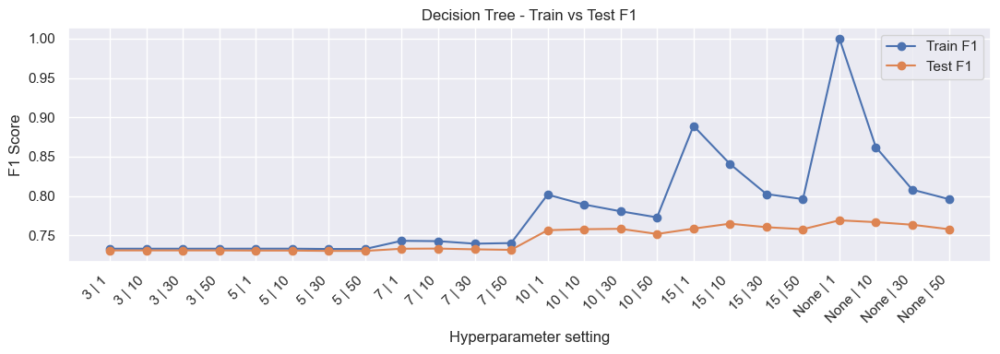

Best parameters: {'max_depth': 'None', 'min_samples_leaf': np.int64(1)}


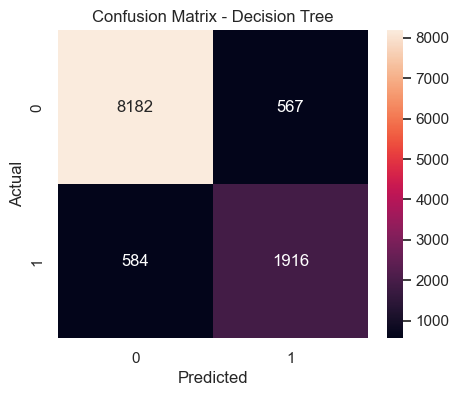

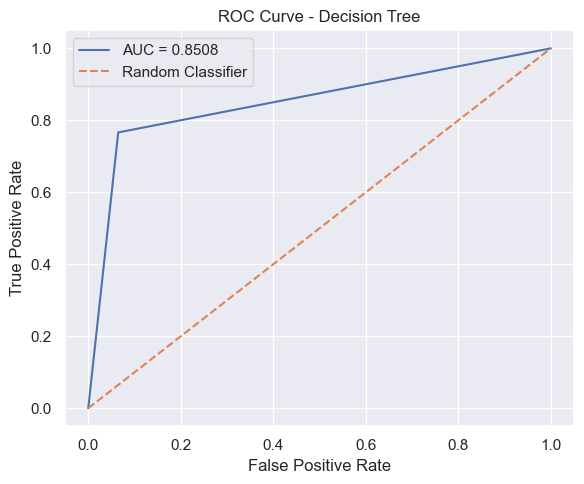

,max_depth,min_samples_leaf,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
20,None,1,1.0000,1.0000,1.0000,1.0000,1.0000,0.8977,0.7716,0.7664,0.7690,0.8508
21,None,10,0.9313,0.7790,0.9648,0.8620,0.9891,0.8829,0.6881,0.8656,0.7667,0.9325
17,15,10,0.9199,0.7533,0.9508,0.8406,0.9859,0.8809,0.6815,0.8712,0.7647,0.9403
22,None,30,0.9001,0.7054,0.9455,0.8080,0.9789,0.8763,0.6641,0.8976,0.7634,0.9580
18,15,30,0.8964,0.6963,0.9465,0.8024,0.9781,0.8739,0.6581,0.9000,0.7603,0.9576
16,15,1,0.9460,0.8179,0.9737,0.8890,0.9939,0.8826,0.6986,0.8296,0.7585,0.9025
14,10,30,0.8828,0.6684,0.9379,0.7805,0.9734,0.8704,0.6476,0.9144,0.7582,0.9618
19,15,50,0.8938,0.6948,0.9317,0.7960,0.9747,0.8732,0.6586,0.8920,0.7577,0.9591
23,None,50,0.8938,0.6948,0.9317,0.7960,0.9747,0.8732,0.6586,0.8920,0.7577,0.9591
13,10,10,0.8880,0.6786,0.9427,0.7891,0.9763,0.8715,0.6520,0.9044,0.7577,0.9596


In [90]:
from sklearn.tree import DecisionTreeClassifier

decision_tree_configs = []

for max_depth in [3, 5, 7, 10, 15, None]:
    for min_samples_leaf in [1, 10, 30, 50]:
        
        decision_tree_configs.append({
            "params": {
                "max_depth": "None" if max_depth is None else max_depth,
                "min_samples_leaf": min_samples_leaf
            },
            "model": DecisionTreeClassifier(
                max_depth=max_depth,
                min_samples_leaf=min_samples_leaf,
                class_weight="balanced",
                random_state=42
            )
        })

decision_tree_results_df, best_decision_tree_model = run_model_grid(
    model_name="Decision Tree",
    config_list=decision_tree_configs,
    X_train_data=X_train_cls,
    X_test_data=X_test_cls,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["max_depth", "min_samples_leaf"]
)

decision_tree_results_df

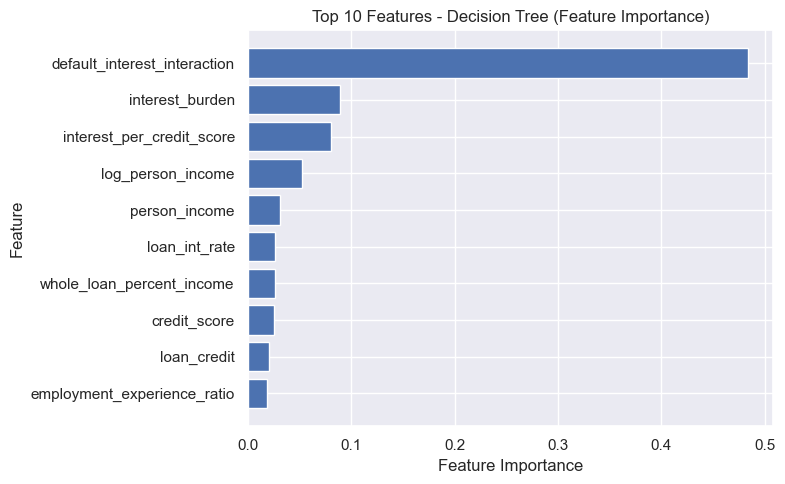

,Feature,Importance,Abs Importance
29,default_interest_interaction,0.483550,0.483550
26,interest_burden,0.089065,0.089065
28,interest_per_credit_score,0.080154,0.080154
22,log_person_income,0.052411,0.052411
2,person_income,0.030566,0.030566
5,loan_int_rate,0.025994,0.025994
24,whole_loan_percent_income,0.025818,0.025818
8,credit_score,0.025123,0.025123
25,loan_credit,0.020576,0.020576
27,employment_experience_ratio,0.017955,0.017955


In [91]:
feature_importance_tables["Decision Tree"] = get_feature_importance_df(
    model=best_decision_tree_model,
    X_data=X_test_cls,
    y_data=y_test_cls,
    model_name="Decision Tree",
    top_n=10
)

feature_importance_tables["Decision Tree"]

Random Forest

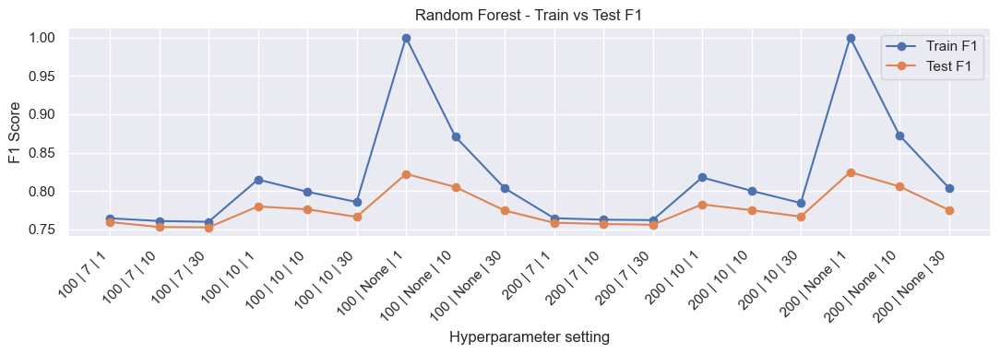

Best parameters: {'n_estimators': np.int64(200), 'max_depth': 'None', 'min_samples_leaf': np.int64(1)}


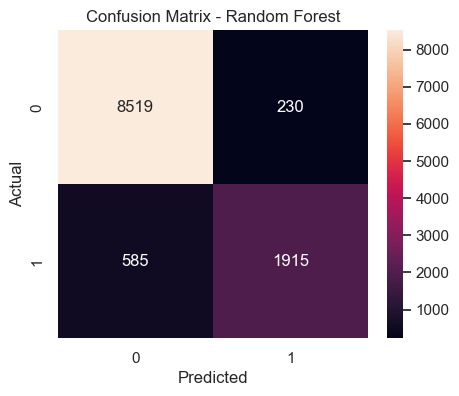

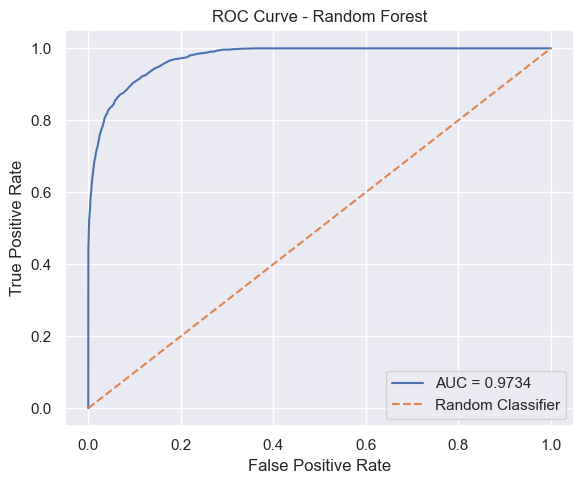

,n_estimators,max_depth,min_samples_leaf,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
15,200,None,1,1.0000,1.0000,1.0000,1.0000,1.0000,0.9275,0.8928,0.7660,0.8245,0.9734
6,100,None,1,1.0000,1.0000,1.0000,1.0000,1.0000,0.9266,0.8900,0.7640,0.8222,0.9729
16,200,None,10,0.9378,0.8014,0.9575,0.8725,0.9893,0.9047,0.7361,0.8904,0.8059,0.9708
7,100,None,10,0.9370,0.7997,0.9559,0.8708,0.9892,0.9043,0.7349,0.8904,0.8052,0.9708
12,200,10,1,0.9074,0.7268,0.9344,0.8176,0.9808,0.8878,0.6875,0.9080,0.7825,0.9695
3,100,10,1,0.9057,0.7226,0.9341,0.8149,0.9806,0.8862,0.6841,0.9068,0.7798,0.9694
4,100,10,10,0.8958,0.6994,0.9317,0.7990,0.9771,0.8827,0.6737,0.9152,0.7761,0.9686
17,200,None,30,0.8986,0.7045,0.9365,0.8041,0.9773,0.8828,0.6757,0.9092,0.7752,0.9678
13,200,10,10,0.8966,0.7011,0.9321,0.8003,0.9773,0.8823,0.6738,0.9120,0.7750,0.9688
8,100,None,30,0.8982,0.7037,0.9365,0.8036,0.9772,0.8821,0.6737,0.9108,0.7745,0.9679


In [92]:
from sklearn.ensemble import RandomForestClassifier

random_forest_configs = []

for n_estimators in [100, 200]:
    for max_depth in [7, 10, None]:
        for min_samples_leaf in [1, 10, 30]:
            
            random_forest_configs.append({
                "params": {
                    "n_estimators": n_estimators,
                    "max_depth": "None" if max_depth is None else max_depth,
                    "min_samples_leaf": min_samples_leaf
                },
                "model": RandomForestClassifier(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    min_samples_leaf=min_samples_leaf,
                    class_weight="balanced",
                    random_state=42,
                    n_jobs=-1
                )
            })

random_forest_results_df, best_random_forest_model = run_model_grid(
    model_name="Random Forest",
    config_list=random_forest_configs,
    X_train_data=X_train_cls,
    X_test_data=X_test_cls,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["n_estimators", "max_depth", "min_samples_leaf"]
)

random_forest_results_df

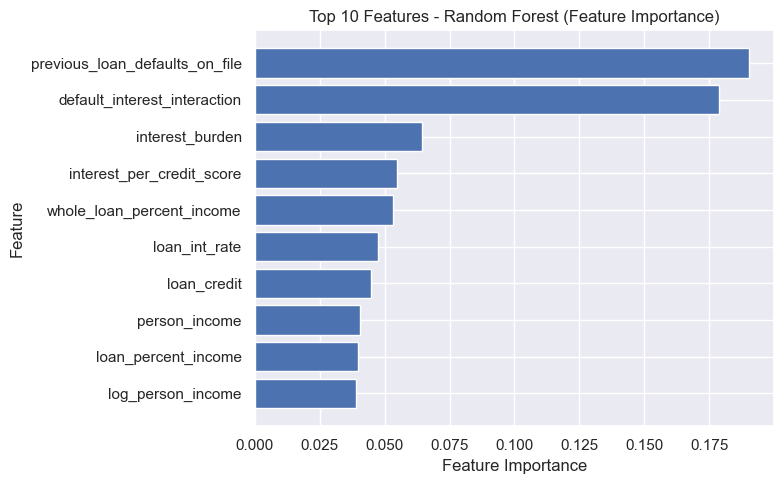

,Feature,Importance,Abs Importance
9,previous_loan_defaults_on_file,0.190455,0.190455
29,default_interest_interaction,0.178599,0.178599
26,interest_burden,0.064212,0.064212
28,interest_per_credit_score,0.054815,0.054815
24,whole_loan_percent_income,0.053352,0.053352
5,loan_int_rate,0.047278,0.047278
25,loan_credit,0.044824,0.044824
2,person_income,0.040422,0.040422
6,loan_percent_income,0.039822,0.039822
22,log_person_income,0.038840,0.038840


In [93]:
feature_importance_tables["Random Forest"] = get_feature_importance_df(
    model=best_random_forest_model,
    X_data=X_test_cls,
    y_data=y_test_cls,
    model_name="Random Forest",
    top_n=10
)

feature_importance_tables["Random Forest"]

Optional Model: LDA

LDA is a simple linear classification model.

It can be useful as an extra baseline model.

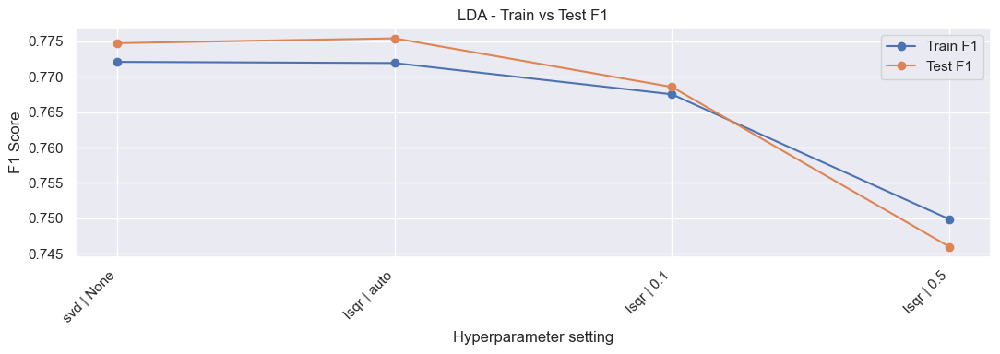

Best parameters: {'solver': 'lsqr', 'shrinkage': 'auto'}


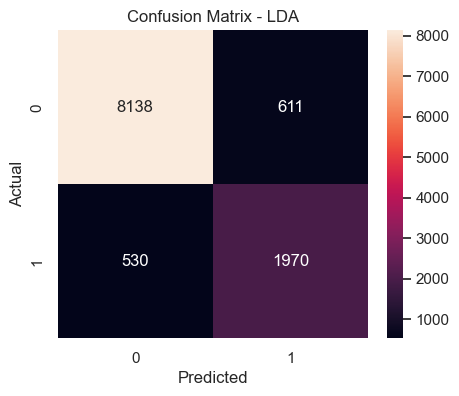

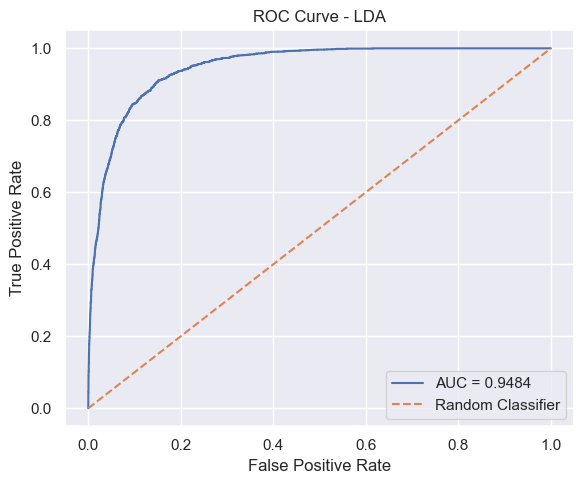

,solver,shrinkage,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train ROC AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test ROC AUC
1,lsqr,auto,0.8972,0.7611,0.7831,0.7720,0.9515,0.8986,0.7633,0.7880,0.7754,0.9484
0,svd,None,0.8970,0.7597,0.7849,0.7721,0.9510,0.8981,0.7616,0.7884,0.7748,0.9479
2,lsqr,0.1,0.8960,0.7623,0.7728,0.7675,0.9516,0.8961,0.7609,0.7764,0.7686,0.9486
3,lsqr,0.5,0.8858,0.7305,0.7703,0.7499,0.9428,0.8833,0.7224,0.7712,0.7460,0.9391


In [94]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda_configs = [
    {
        "params": {
            "solver": "svd",
            "shrinkage": "None"
        },
        "model": LinearDiscriminantAnalysis(
            solver="svd"
        )
    },
    {
        "params": {
            "solver": "lsqr",
            "shrinkage": "auto"
        },
        "model": LinearDiscriminantAnalysis(
            solver="lsqr",
            shrinkage="auto"
        )
    },
    {
        "params": {
            "solver": "lsqr",
            "shrinkage": 0.1
        },
        "model": LinearDiscriminantAnalysis(
            solver="lsqr",
            shrinkage=0.1
        )
    },
    {
        "params": {
            "solver": "lsqr",
            "shrinkage": 0.5
        },
        "model": LinearDiscriminantAnalysis(
            solver="lsqr",
            shrinkage=0.5
        )
    }
]

lda_results_df, best_lda_model = run_model_grid(
    model_name="LDA",
    config_list=lda_configs,
    X_train_data=X_train_cls_scaled,
    X_test_data=X_test_cls_scaled,
    y_train_data=y_train_cls,
    y_test_data=y_test_cls,
    param_cols=["solver", "shrinkage"]
)

lda_results_df

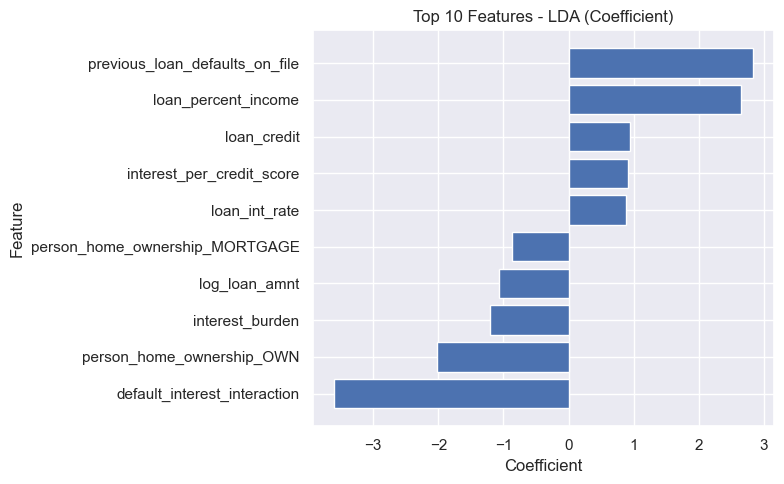

,Feature,Importance,Abs Importance
29,default_interest_interaction,-3.606442,3.606442
9,previous_loan_defaults_on_file,2.830079,2.830079
6,loan_percent_income,2.638366,2.638366
16,person_home_ownership_OWN,-2.020292,2.020292
26,interest_burden,-1.206779,1.206779
23,log_loan_amnt,-1.070023,1.070023
25,loan_credit,0.946322,0.946322
28,interest_per_credit_score,0.913503,0.913503
5,loan_int_rate,0.878425,0.878425
14,person_home_ownership_MORTGAGE,-0.862699,0.862699


In [95]:
feature_importance_tables["LDA"] = get_feature_importance_df(
    model=best_lda_model,
    X_data=X_test_cls_scaled,
    y_data=y_test_cls,
    model_name="LDA",
    top_n=10
)

feature_importance_tables["LDA"]

Final Classification Results

Now we compare the best version of all models.

The main metric is F1 Score.

In [96]:
classification_results_df = pd.DataFrame(classification_final_results)

classification_results_df = classification_results_df.sort_values(
    by="F1 Score",
    ascending=False
)

classification_results_df = classification_results_df.drop_duplicates(
    subset="Model",
    keep="first"
)

classification_results_df.round(4)

,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC,Best Parameters
5,Random Forest,0.9275,0.8928,0.7660,0.8245,0.9734,"{'n_estimators': 200, 'max_depth': 'None', 'mi..."
0,Logistic Regression,0.9049,0.7888,0.7812,0.7850,0.9572,"{'C': 10.0, 'class_weight': 'None'}"
1,Linear SVM,0.9039,0.7848,0.7820,0.7834,0.9571,"{'C': 10.0, 'class_weight': 'None'}"
3,KNN,0.9042,0.7945,0.7672,0.7806,0.9414,{'K': 7.0}
6,LDA,0.8986,0.7633,0.7880,0.7754,0.9484,"{'solver': 'lsqr', 'shrinkage': 'auto'}"
4,Decision Tree,0.8977,0.7716,0.7664,0.7690,0.8508,"{'max_depth': 'None', 'min_samples_leaf': 1}"
2,Kernel SVM,0.8817,0.6861,0.8620,0.7640,0.9496,"{'C': 10.0, 'gamma': 'scale'}"


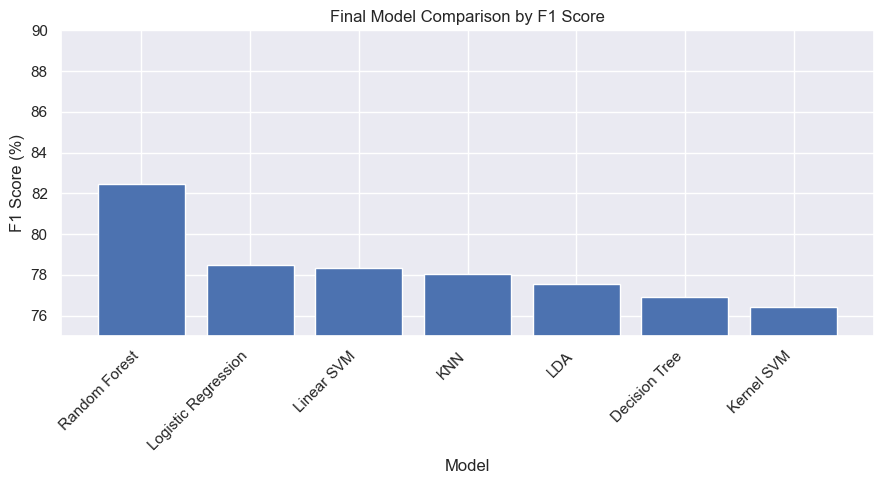

In [97]:
plt.figure(figsize=(9, 5))

plt.bar(
    classification_results_df["Model"],
    classification_results_df["F1 Score"] * 100
)

plt.title("Final Model Comparison by F1 Score")
plt.xlabel("Model")
plt.ylabel("F1 Score (%)")

plt.ylim(75, 90)

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

## Discussion 1: Best Classification Metric

For this dataset, I used **F1 Score** as the main metric.

Accuracy is easy to understand, but it can be misleading when the classes are not perfectly balanced.  
In loan status prediction, both false positives and false negatives are important.

Precision tells us how many predicted positive cases are actually positive.  
Recall tells us how many real positive cases the model can find.  
F1 Score combines Precision and Recall.

So, F1 Score is a good main metric because it gives a balance between Precision and Recall.  
ROC AUC is also useful, but F1 Score is closer to the final class prediction.

## Discussion 2: Regularization Techniques for Decision Trees

Decision Trees can easily overfit the training data.  
To reduce overfitting, we can use these techniques:

1. **Limit max_depth**  
   This stops the tree from becoming too deep.

2. **Increase min_samples_leaf**  
   This prevents the tree from creating very small leaves.

3. **Pruning with ccp_alpha**  
   This removes weak branches that do not improve the model enough.

These methods make the tree simpler and help it perform better on unseen data.

## Discussion 3: Linear SVM vs Kernel SVM

Linear SVM creates a linear decision boundary.  
It is faster, simpler, and easier to understand.

Kernel SVM can create a non-linear decision boundary.  
It can model more complex patterns, but it is slower and more sensitive to hyperparameters like `C` and `gamma`.

In this project, Linear SVM is useful as a simple strong baseline.  
Kernel SVM is useful when the relation between features and target is not linear.

# Multiclass Classification

In this section, we predict `loan_intent`.

In [98]:
multiclass_target = "loan_intent"
multiclass_code_col = multiclass_target + "_code"

multi_class_names = sorted(df[multiclass_target].unique().tolist())
multi_class_mapping = dict(enumerate(multi_class_names))

print("Number of classes:", len(multi_class_names))
print("Class mapping:")
print(multi_class_mapping)

Number of classes: 6
Class mapping:
{0: 'DEBTCONSOLIDATION', 1: 'EDUCATION', 2: 'HOMEIMPROVEMENT', 3: 'MEDICAL', 4: 'PERSONAL', 5: 'VENTURE'}


Dropping target and leakaging columns

In [99]:
multiclass_df = df_encoded.copy()

# If the target code column does not exist, create it.
if multiclass_code_col not in multiclass_df.columns:
    multiclass_df[multiclass_code_col] = pd.Categorical(
        df[multiclass_target],
        categories=multi_class_names
    ).codes

y_multi = multiclass_df[multiclass_code_col].astype(int)

target_related_columns = [
    multiclass_target,
    multiclass_code_col,
    binary_target
]

loan_intent_dummy_columns = [
    col for col in multiclass_df.columns
    if col.startswith(multiclass_target + "_")
]

columns_to_drop_multi = target_related_columns + loan_intent_dummy_columns

columns_to_drop_multi = [
    col for col in columns_to_drop_multi
    if col in multiclass_df.columns
]

X_multi = multiclass_df.drop(columns=columns_to_drop_multi).copy()

X_multi = X_multi.replace([np.inf, -np.inf], np.nan)
X_multi = X_multi.fillna(X_multi.median(numeric_only=True))

print("Dropped columns:")
print(columns_to_drop_multi)

print("\nX_multi shape:", X_multi.shape)
print("y_multi shape:", y_multi.shape)

print("\nNon-numeric columns:")
print(X_multi.select_dtypes(exclude=[np.number]).columns.tolist())

X_multi.head()

Dropped columns:
['loan_intent_code', 'loan_status', 'loan_intent_code', 'loan_intent_DEBTCONSOLIDATION', 'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']

X_multi shape: (44993, 19)
y_multi shape: (44993,)

Non-numeric columns:
[]


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,person_education_Associate,person_education_Bachelor,person_education_Doctorate,person_education_High School,person_education_Master,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT
0,22.0,0,71948.0,0,35000.0,16.02,0.49,3.0,561,0,0,0,0,0,1,0,0,0,1
1,21.0,0,12282.0,0,1000.0,11.14,0.08,2.0,504,1,0,0,0,1,0,0,0,1,0
2,25.0,0,12438.0,3,5500.0,12.87,0.44,3.0,635,0,0,0,0,1,0,1,0,0,0
3,23.0,0,79753.0,0,35000.0,15.23,0.44,2.0,675,0,0,1,0,0,0,0,0,0,1
4,24.0,1,66135.0,1,35000.0,14.27,0.53,4.0,586,0,0,0,0,0,1,0,0,0,1


check how many samples each class has

In [100]:
class_counts = df[multiclass_target].value_counts().sort_index()
class_percent = df[multiclass_target].value_counts(normalize=True).sort_index() * 100

class_distribution_df = pd.DataFrame({
    "Class Name": class_counts.index,
    "Count": class_counts.values,
    "Percent": class_percent.round(2).values
})

class_distribution_df

,Class Name,Count,Percent
0,DEBTCONSOLIDATION,7145,15.88
1,EDUCATION,9151,20.34
2,HOMEIMPROVEMENT,4783,10.63
3,MEDICAL,8548,19.00
4,PERSONAL,7551,16.78
5,VENTURE,7815,17.37


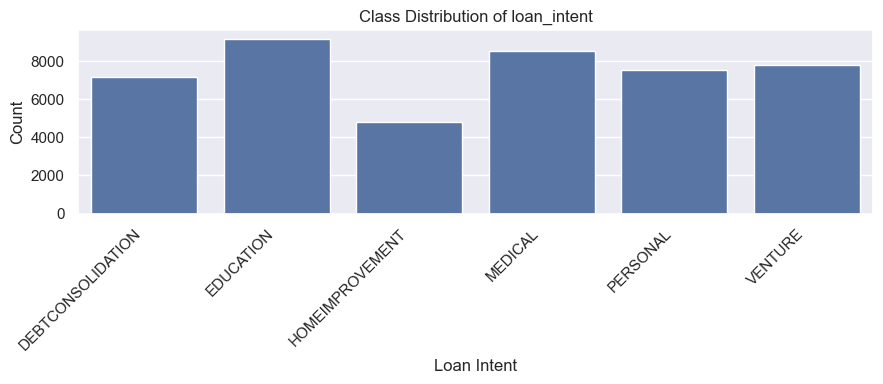

In [101]:
plt.figure(figsize=(9, 4))

sns.countplot(
    data=df,
    x=multiclass_target,
    order=class_counts.index
)

plt.title("Class Distribution of loan_intent")
plt.xlabel("Loan Intent")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

Feature Engineering Exploration

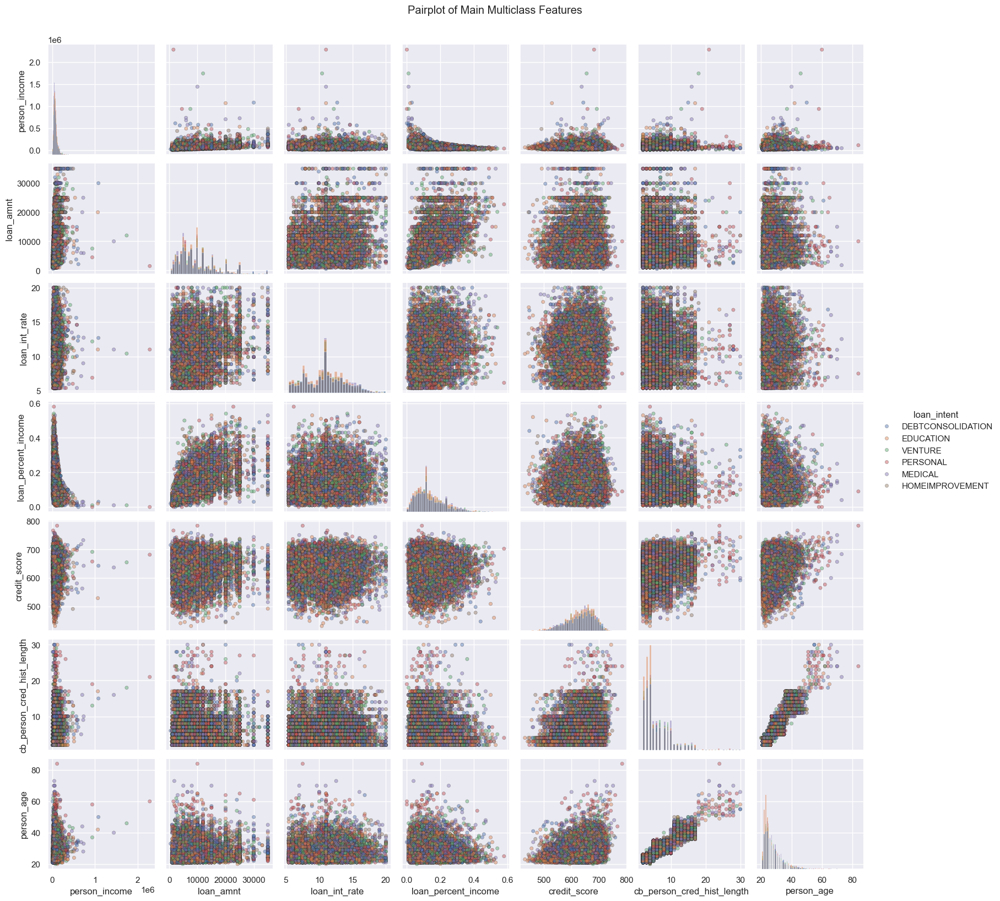

In [103]:
multi_pairplot_features = [
    "person_income",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "credit_score",
    "cb_person_cred_hist_length",
    "person_age"
]

multi_pairplot_features = [
    col for col in multi_pairplot_features
    if col in df.columns
]

pairplot_df_multi = df[multi_pairplot_features + [multiclass_target]].copy()

pairplot_sample_multi = pairplot_df_multi.sample(
    n=min(10000, len(pairplot_df_multi)),
    random_state=42
)

sns.pairplot(
    data=pairplot_sample_multi,
    vars=multi_pairplot_features,
    hue=multiclass_target,
    diag_kind="hist",
    plot_kws={
        "alpha": 0.45,
        "s": 20,
        "edgecolor": "k"
    },
    height=2.3
)

plt.suptitle("Pairplot of Main Multiclass Features", y=1.02)
plt.show()

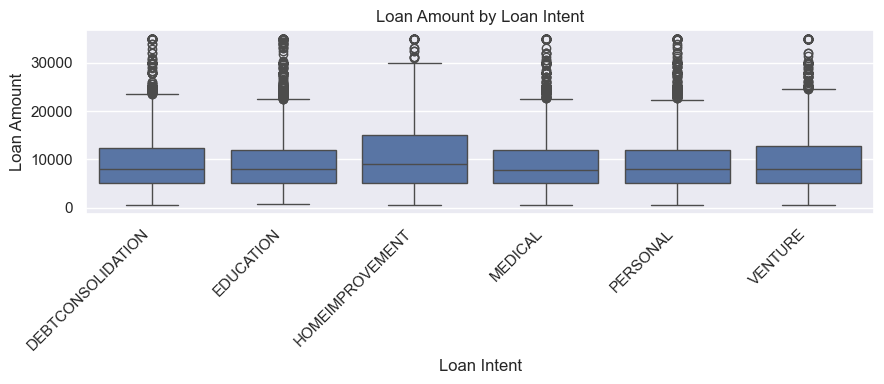

In [104]:
plt.figure(figsize=(9, 4))

sns.boxplot(
    data=df,
    x=multiclass_target,
    y="loan_amnt",
    order=class_counts.index
)

plt.title("Loan Amount by Loan Intent")
plt.xlabel("Loan Intent")
plt.ylabel("Loan Amount")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

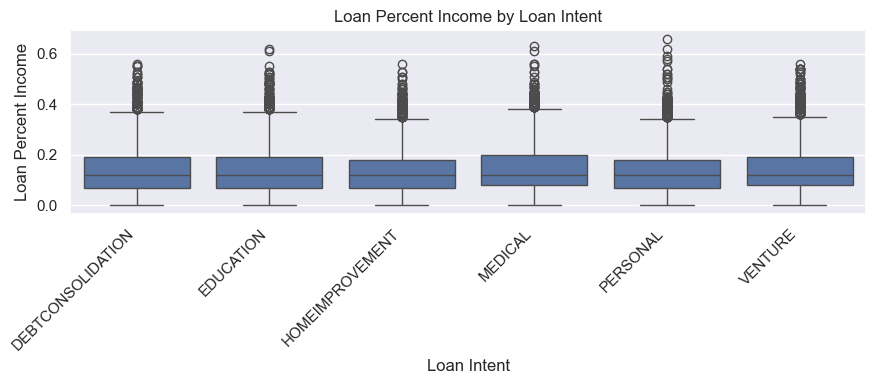

In [105]:
plt.figure(figsize=(9, 4))

sns.boxplot(
    data=df,
    x=multiclass_target,
    y="loan_percent_income",
    order=class_counts.index
)

plt.title("Loan Percent Income by Loan Intent")
plt.xlabel("Loan Intent")
plt.ylabel("Loan Percent Income")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

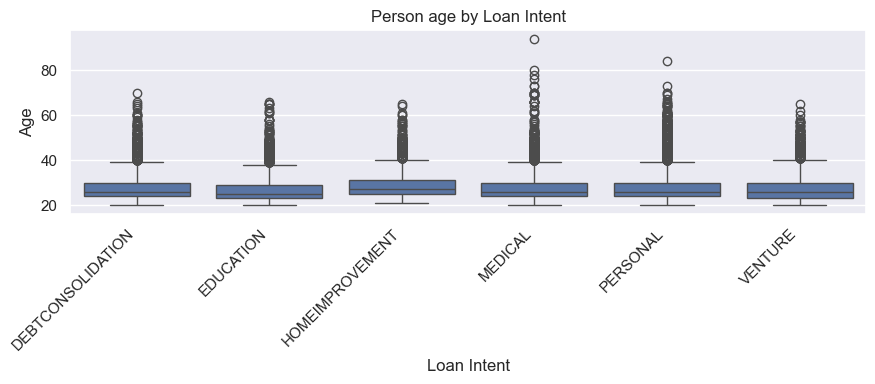

In [107]:
plt.figure(figsize=(9, 4))

sns.boxplot(
    data=df,
    x=multiclass_target,
    y="person_age",
    order=class_counts.index
)

plt.title("Person age by Loan Intent")
plt.xlabel("Loan Intent")
plt.ylabel("Age")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

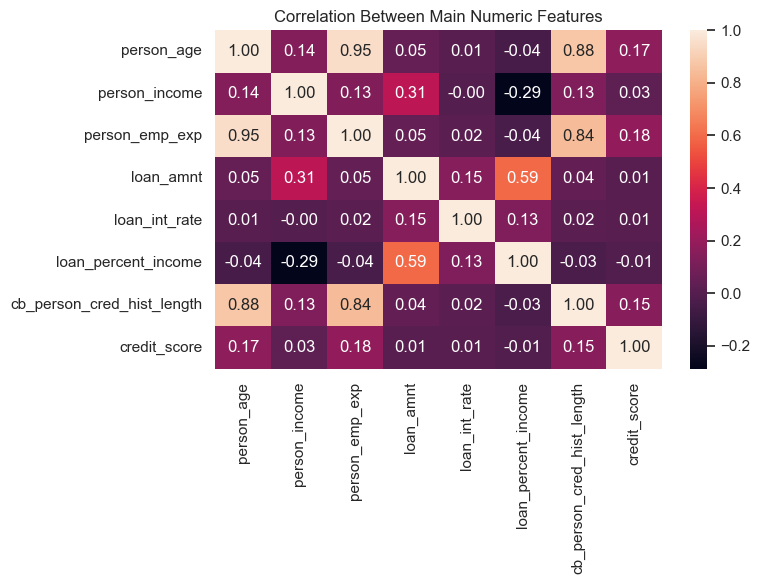

In [106]:
correlation_columns_multi = [
    "person_age",
    "person_income",
    "person_emp_exp",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_person_cred_hist_length",
    "credit_score"
]

correlation_columns_multi = [
    col for col in correlation_columns_multi
    if col in df.columns
]

plt.figure(figsize=(8, 6))

sns.heatmap(
    df[correlation_columns_multi].corr(),
    annot=True,
    fmt=".2f"
)

plt.title("Correlation Between Main Numeric Features")
plt.tight_layout()
plt.show()

Feature Engineering

In [134]:
X_multi_fe = X_multi.copy()

eps = 1e-6

if "person_income" in X_multi_fe.columns:
    X_multi_fe["log_person_income"] = np.log1p(X_multi_fe["person_income"])

if "loan_amnt" in X_multi_fe.columns:
    X_multi_fe["log_loan_amnt"] = np.log1p(X_multi_fe["loan_amnt"])

if {"loan_amnt", "person_income"}.issubset(X_multi_fe.columns):
    X_multi_fe["loan_to_income_ratio"] = (
        X_multi_fe["loan_amnt"] / (X_multi_fe["person_income"] + eps)
    )

if {"loan_int_rate", "loan_percent_income"}.issubset(X_multi_fe.columns):
    X_multi_fe["interest_burden"] = (
        X_multi_fe["loan_int_rate"] * X_multi_fe["loan_percent_income"]
    )

if {"person_income", "person_age"}.issubset(X_multi_fe.columns):
    X_multi_fe["income_per_age"] = (
        X_multi_fe["person_income"] / np.maximum(X_multi_fe["person_age"], 1)
    )

if {"person_emp_exp", "person_age"}.issubset(X_multi_fe.columns):
    X_multi_fe["employment_experience_ratio"] = (
        X_multi_fe["person_emp_exp"] / np.maximum(X_multi_fe["person_age"] - 18, 1)
    )

if {"credit_score", "cb_person_cred_hist_length"}.issubset(X_multi_fe.columns):
    X_multi_fe["credit_strength"] = (
        X_multi_fe["credit_score"] * X_multi_fe["cb_person_cred_hist_length"]
    )

if {"cb_person_cred_hist_length", "person_age"}.issubset(X_multi_fe.columns):
    X_multi_fe["credit_history_age_ratio"] = (
        X_multi_fe["cb_person_cred_hist_length"] / np.maximum(X_multi_fe["person_age"], 1)
    )

if {"person_age", "cb_person_cred_hist_length"}.issubset(X_multi_fe.columns):
    X_multi_fe["credit_start_age"] = (
        X_multi_fe["person_age"] - X_multi_fe["cb_person_cred_hist_length"]
    )

if {"previous_loan_defaults_on_file", "loan_int_rate"}.issubset(X_multi_fe.columns):
    X_multi_fe["default_interest_interaction"] = (
        X_multi_fe["previous_loan_defaults_on_file"] * X_multi_fe["loan_int_rate"]
    )

if "loan_int_rate" in X_multi_fe.columns:
    X_multi_fe["high_interest_rate"] = (
        X_multi_fe["loan_int_rate"] > X_multi_fe["loan_int_rate"].quantile(0.75)
    ).astype(int)

if "person_age" in X_multi_fe.columns:
    X_multi_fe["high_age"] = (
        X_multi_fe["person_age"] > X_multi_fe["person_age"].quantile(0.75)
    ).astype(int)

if "person_age" in X_multi_fe.columns:
    X_multi_fe["young_age"] = (
        X_multi_fe["person_age"] < X_multi_fe["person_age"].quantile(0.25)
    ).astype(int)


if "loan_amnt" in X_multi_fe.columns:
    X_multi_fe["high_loan_amount"] = (
        X_multi_fe["loan_amnt"] > X_multi_fe["loan_amnt"].quantile(0.75)
    ).astype(int)

if "credit_score" in X_multi_fe.columns:
    X_multi_fe["low_credit_score"] = (
        X_multi_fe["credit_score"] < X_multi_fe["credit_score"].quantile(0.25)
    ).astype(int)

if {"loan_amnt", "loan_int_rate", "person_income"}.issubset(X_multi_fe.columns):
    X_multi_fe["total_loan_cost_income_ratio"] = (
        X_multi_fe["loan_amnt"] * (1 + X_multi_fe["loan_int_rate"] / 100) /
        (X_multi_fe["person_income"] + eps)
    )

if {"total_loan_cost_income_ratio", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["loan_cost_credit_interaction"] = (
        X_multi_fe["total_loan_cost_income_ratio"] * X_multi_fe["credit_score"]
    )

if {"loan_int_rate", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["interest_per_credit_score"] = (
        X_multi_fe["loan_int_rate"] / (X_multi_fe["credit_score"] + eps)
    )

if {"loan_amnt", "loan_int_rate"}.issubset(X_multi_fe.columns):
    X_multi_fe["annual_interest_amount"] = (
        X_multi_fe["loan_amnt"] * X_multi_fe["loan_int_rate"] / 100
    )

if {"loan_amnt", "loan_int_rate"}.issubset(X_multi_fe.columns):
    monthly_rate_multi = X_multi_fe["loan_int_rate"] / 100 / 12
    
    X_multi_fe["approx_monthly_payment_36m"] = np.where(
        monthly_rate_multi > 0,
        X_multi_fe["loan_amnt"] * monthly_rate_multi /
        (1 - np.power(1 + monthly_rate_multi, -36)),
        X_multi_fe["loan_amnt"] / 36
    )

if {"approx_monthly_payment_36m", "person_income"}.issubset(X_multi_fe.columns):
    X_multi_fe["monthly_payment_income_ratio"] = (
        X_multi_fe["approx_monthly_payment_36m"] /
        (X_multi_fe["person_income"] / 12 + eps)
    )

if {"loan_amnt", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["loan_amount_per_credit_score"] = (
        X_multi_fe["loan_amnt"] / (X_multi_fe["credit_score"] + eps)
    )

if {"loan_percent_income", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["loan_percent_income_per_credit_score"] = (
        X_multi_fe["loan_percent_income"] / (X_multi_fe["credit_score"] + eps)
    )

if {"person_income", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["income_credit_capacity"] = (
        np.log1p(X_multi_fe["person_income"]) * X_multi_fe["credit_score"]
    )

if {"person_income", "credit_score", "loan_amnt", "loan_int_rate"}.issubset(X_multi_fe.columns):
    X_multi_fe["affordability_score"] = (
        np.log1p(X_multi_fe["person_income"]) * X_multi_fe["credit_score"] /
        (X_multi_fe["loan_amnt"] * (1 + X_multi_fe["loan_int_rate"] / 100) + eps)
    )

if {"total_loan_cost_income_ratio", "loan_int_rate", "previous_loan_defaults_on_file"}.issubset(X_multi_fe.columns):
    X_multi_fe["debt_pressure_score"] = (
        X_multi_fe["total_loan_cost_income_ratio"] *
        X_multi_fe["loan_int_rate"] *
        (1 + X_multi_fe["previous_loan_defaults_on_file"])
    )

if {"previous_loan_defaults_on_file", "total_loan_cost_income_ratio"}.issubset(X_multi_fe.columns):
    X_multi_fe["default_loan_burden_interaction"] = (
        X_multi_fe["previous_loan_defaults_on_file"] *
        X_multi_fe["total_loan_cost_income_ratio"]
    )

if {"previous_loan_defaults_on_file", "credit_score"}.issubset(X_multi_fe.columns):
    X_multi_fe["default_credit_risk_interaction"] = (
        X_multi_fe["previous_loan_defaults_on_file"] *
        np.maximum(850 - X_multi_fe["credit_score"], 0)
    )

if "person_income" in X_multi_fe.columns:
    X_multi_fe["home_ownership_income_capacity"] = np.log1p(X_multi_fe["person_income"]) * (
        1
        + 0.60 * X_multi_fe.get("person_home_ownership_OWN", 0)
        + 0.35 * X_multi_fe.get("person_home_ownership_MORTGAGE", 0)
        - 0.10 * X_multi_fe.get("person_home_ownership_RENT", 0)
        - 0.15 * X_multi_fe.get("person_home_ownership_OTHER", 0)
    )

if "person_income" in X_multi_fe.columns:
    X_multi_fe["education_income_capacity"] = np.log1p(X_multi_fe["person_income"]) * (
        1
        + 0.10 * X_multi_fe.get("person_education_Associate", 0)
        + 0.20 * X_multi_fe.get("person_education_Bachelor", 0)
        + 0.30 * X_multi_fe.get("person_education_Master", 0)
        + 0.40 * X_multi_fe.get("person_education_Doctorate", 0)
    )

X_multi_fe = X_multi_fe.replace([np.inf, -np.inf], np.nan)
X_multi_fe = X_multi_fe.fillna(X_multi_fe.median(numeric_only=True))

new_multi_features = [
    col for col in X_multi_fe.columns
    if col not in X_multi.columns
]

print("New features:")
print(new_multi_features)

print("\nShape before feature engineering:", X_multi.shape)
print("Shape after feature engineering:", X_multi_fe.shape)

X_multi_fe.head()

New features:
['log_person_income', 'log_loan_amnt', 'loan_to_income_ratio', 'interest_burden', 'income_per_age', 'employment_experience_ratio', 'credit_strength', 'credit_history_age_ratio', 'credit_start_age', 'default_interest_interaction', 'high_interest_rate', 'high_age', 'young_age', 'high_loan_amount', 'low_credit_score', 'total_loan_cost_income_ratio', 'loan_cost_credit_interaction', 'interest_per_credit_score', 'annual_interest_amount', 'approx_monthly_payment_36m', 'monthly_payment_income_ratio', 'loan_amount_per_credit_score', 'loan_percent_income_per_credit_score', 'income_credit_capacity', 'affordability_score', 'debt_pressure_score', 'default_loan_burden_interaction', 'default_credit_risk_interaction', 'home_ownership_income_capacity', 'education_income_capacity']

Shape before feature engineering: (44993, 19)
Shape after feature engineering: (44993, 49)


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,monthly_payment_income_ratio,loan_amount_per_credit_score,loan_percent_income_per_credit_score,income_credit_capacity,affordability_score,debt_pressure_score,default_loan_burden_interaction,default_credit_risk_interaction,home_ownership_income_capacity,education_income_capacity
0,22.0,0,71948.0,0,35000.0,16.02,0.49,3.0,561,0,...,0.205289,62.388592,0.000873,6274.062888,0.154507,9.041588,0.00000,0,10.065342,14.538827
1,21.0,0,12282.0,0,1000.0,11.14,0.08,2.0,504,1,...,0.032052,1.984127,0.000159,4745.649622,4.269974,2.016121,0.09049,346,15.065554,9.415971
2,25.0,0,12438.0,3,5500.0,12.87,0.44,3.0,635,0,...,0.178459,8.661417,0.000693,5987.155906,0.964449,6.423463,0.00000,0,12.728599,9.428592
3,23.0,0,79753.0,0,35000.0,15.23,0.44,2.0,675,0,...,0.183150,51.851852,0.000652,7618.523969,0.188902,7.701698,0.00000,0,10.158032,13.544043
4,24.0,1,66135.0,1,35000.0,14.27,0.53,4.0,586,0,...,0.217884,59.726962,0.000904,6504.288545,0.162630,8.629644,0.00000,0,9.989522,14.429309


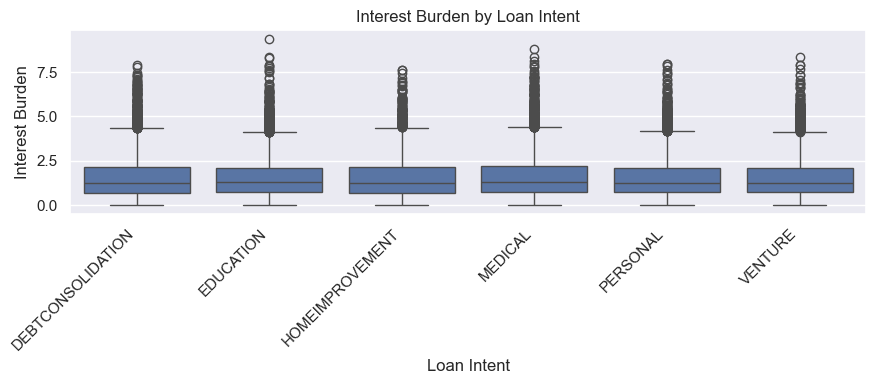

In [135]:
new_feature_to_plot = "interest_burden"

if new_feature_to_plot in X_multi_fe.columns:
    plot_df = X_multi_fe[[new_feature_to_plot]].copy()
    plot_df[multiclass_target] = df[multiclass_target].values

    plt.figure(figsize=(9, 4))

    sns.boxplot(
        data=plot_df,
        x=multiclass_target,
        y=new_feature_to_plot,
        order=class_counts.index
    )

    plt.title("Interest Burden by Loan Intent")
    plt.xlabel("Loan Intent")
    plt.ylabel("Interest Burden")
    plt.xticks(rotation=45, ha="right")

    plt.tight_layout()
    plt.show()

Train and Test Split

In [136]:
from sklearn.model_selection import train_test_split

X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(
    X_multi_fe,
    y_multi,
    test_size=0.25,
    random_state=42,
    stratify=y_multi
)

print("X_train_multi shape:", X_train_multi.shape)
print("X_test_multi shape:", X_test_multi.shape)
print("y_train_multi shape:", y_train_multi.shape)
print("y_test_multi shape:", y_test_multi.shape)

X_train_multi shape: (33744, 49)
X_test_multi shape: (11249, 49)
y_train_multi shape: (33744,)
y_test_multi shape: (11249,)


In [138]:
train_class_names = y_train_multi.map(multi_class_mapping)
test_class_names = y_test_multi.map(multi_class_mapping)

split_balance_multi_df = pd.DataFrame({
    "Train Percent": (train_class_names.value_counts(normalize=True).sort_index() * 100).round(2),
    "Test Percent": (test_class_names.value_counts(normalize=True).sort_index() * 100).round(2)
})

split_balance_multi_df

,Train Percent,Test Percent
loan_intent_code,,
DEBTCONSOLIDATION,15.88,15.88
EDUCATION,20.34,20.34
HOMEIMPROVEMENT,10.63,10.63
MEDICAL,19.00,19.00
PERSONAL,16.78,16.78
VENTURE,17.37,17.37


Feature Scaling

In [139]:
binary_features_multi = [
    col for col in X_train_multi.columns
    if X_train_multi[col].nunique() <= 2
]

continuous_features_multi = [
    col for col in X_train_multi.columns
    if col not in binary_features_multi
]

print("Number of continuous features:", len(continuous_features_multi))
print("Number of binary / one-hot features:", len(binary_features_multi))

print("\nContinuous features:")
print(continuous_features_multi)

print("\nBinary / one-hot features:")
print(binary_features_multi)

Number of continuous features: 33
Number of binary / one-hot features: 16

Continuous features:
['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'log_person_income', 'log_loan_amnt', 'loan_to_income_ratio', 'interest_burden', 'income_per_age', 'employment_experience_ratio', 'credit_strength', 'credit_history_age_ratio', 'credit_start_age', 'default_interest_interaction', 'total_loan_cost_income_ratio', 'loan_cost_credit_interaction', 'interest_per_credit_score', 'annual_interest_amount', 'approx_monthly_payment_36m', 'monthly_payment_income_ratio', 'loan_amount_per_credit_score', 'loan_percent_income_per_credit_score', 'income_credit_capacity', 'affordability_score', 'debt_pressure_score', 'default_loan_burden_interaction', 'default_credit_risk_interaction', 'home_ownership_income_capacity', 'education_income_capacity']

Binary / one-hot features:
['person_gender', 'previous_loan_default

In [140]:
from sklearn.preprocessing import StandardScaler

scaler_multi = StandardScaler()

X_train_multi_scaled = X_train_multi.copy()
X_test_multi_scaled = X_test_multi.copy()

if len(continuous_features_multi) > 0:
    X_train_multi_scaled[continuous_features_multi] = scaler_multi.fit_transform(
        X_train_multi[continuous_features_multi]
    )

    X_test_multi_scaled[continuous_features_multi] = scaler_multi.transform(
        X_test_multi[continuous_features_multi]
    )

print("NaN in train:", X_train_multi_scaled.isna().sum().sum())
print("NaN in test:", X_test_multi_scaled.isna().sum().sum())

X_train_multi_scaled.head()

NaN in train: 0
NaN in test: 0


,person_age,person_gender,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,...,monthly_payment_income_ratio,loan_amount_per_credit_score,loan_percent_income_per_credit_score,income_credit_capacity,affordability_score,debt_pressure_score,default_loan_burden_interaction,default_credit_risk_interaction,home_ownership_income_capacity,education_income_capacity
28130,0.557160,0,0.002720,0.616623,-1.113908,0.120430,-1.259061,0.817239,-0.149593,1,...,-1.224442,-1.100045,-1.240413,0.030949,1.468315,-0.936660,-0.378814,0.920111,-0.818093,-1.003314
2463,-0.975514,0,-0.643887,-0.912752,-0.474467,-0.649235,0.350061,-0.742026,-0.268849,1,...,0.264320,-0.453593,0.373303,-0.732810,-0.174424,0.465914,1.301169,0.970417,1.435506,-0.752357
13734,-0.634920,0,0.834603,-0.912752,0.536007,-0.706371,-0.454500,-1.001904,-1.580656,1,...,-0.513376,0.807989,-0.294613,-0.767355,-0.642120,-0.330578,0.427343,1.523790,-0.666507,0.231903
4985,-0.975514,0,-0.430825,-0.912752,-0.466573,-0.212307,-0.109688,-0.742026,-1.481277,1,...,-0.172646,-0.330319,0.076661,-1.450984,-0.260821,0.220168,0.798315,1.481868,0.687159,-0.513760
3505,-0.464623,0,-0.665967,-0.233030,0.141291,0.789266,1.614371,-0.742026,0.565938,0,...,1.661194,0.059324,1.433969,-0.104203,-0.512265,0.950062,-0.780309,-0.966387,-1.043627,-0.008952


Evaluation Function

Main Metric: Macro F1

Accuracy is useful, but it can hide weak classes.

Macro F1 gives the same importance to each class.

Log Loss is also useful because it checks predicted probabilities.

In [141]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    log_loss,
    classification_report
)

multiclass_final_results = []
multiclass_best_models = {}

class_codes = list(range(len(multi_class_names)))


def get_multiclass_log_loss(model, X_data, y_data):
    if hasattr(model, "predict_proba"):
        probabilities = model.predict_proba(X_data)
        return log_loss(y_data, probabilities, labels=class_codes)
    
    return np.nan


def evaluate_multiclass_model(
    model_name,
    model,
    X_train_data,
    X_test_data,
    y_train_data,
    y_test_data
):
    y_train_pred = model.predict(X_train_data)
    y_test_pred = model.predict(X_test_data)
    
    result = {
        "Model": model_name,
        "Train Accuracy": accuracy_score(y_train_data, y_train_pred),
        "Test Accuracy": accuracy_score(y_test_data, y_test_pred),
        "Train Macro F1": f1_score(y_train_data, y_train_pred, average="macro", zero_division=0),
        "Test Macro F1": f1_score(y_test_data, y_test_pred, average="macro", zero_division=0),
        "Test Micro F1": f1_score(y_test_data, y_test_pred, average="micro", zero_division=0),
        "Test Weighted F1": f1_score(y_test_data, y_test_pred, average="weighted", zero_division=0),
        "Train Log Loss": get_multiclass_log_loss(model, X_train_data, y_train_data),
        "Test Log Loss": get_multiclass_log_loss(model, X_test_data, y_test_data)
    }
    
    multiclass_final_results.append(result)
    multiclass_best_models[model_name] = model
    
    return pd.DataFrame([result]).round(4)


def get_multiclass_class_report(model, X_data, y_data):
    y_pred = model.predict(X_data)
    
    report = classification_report(
        y_data,
        y_pred,
        labels=class_codes,
        target_names=multi_class_names,
        output_dict=True,
        zero_division=0
    )
    
    report_df = pd.DataFrame(report).T
    
    return report_df.loc[
        multi_class_names,
        ["precision", "recall", "f1-score", "support"]
    ].round(4)

Baseline Model


In [142]:
from sklearn.dummy import DummyClassifier

dummy_multi_model = DummyClassifier(
    strategy="most_frequent",
    random_state=42
)

dummy_multi_model.fit(X_train_multi, y_train_multi)

baseline_multi_results = evaluate_multiclass_model(
    model_name="Dummy Baseline",
    model=dummy_multi_model,
    X_train_data=X_train_multi,
    X_test_data=X_test_multi,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

baseline_multi_results

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Dummy Baseline,0.2034,0.2034,0.0563,0.0563,0.2034,0.0688,28.7129,28.7125


Multiclass SVM

In [143]:
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV

base_svm_multi = LinearSVC(
    C=1.0,
    class_weight="balanced",
    random_state=42,
    max_iter=5000
)

svm_multi_model = CalibratedClassifierCV(
    base_svm_multi,
    cv=3
)

svm_multi_model.fit(X_train_multi_scaled, y_train_multi)

svm_multi_results = evaluate_multiclass_model(
    model_name="Linear SVM",
    model=svm_multi_model,
    X_train_data=X_train_multi_scaled,
    X_test_data=X_test_multi_scaled,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

svm_multi_results

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Linear SVM,0.2415,0.2413,0.1864,0.1814,0.2413,0.1984,1.7352,1.7341


In [144]:
svm_class_report = get_multiclass_class_report(
    model=svm_multi_model,
    X_data=X_test_multi_scaled,
    y_data=y_test_multi
)

svm_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.2045,0.0868,0.1219,1786.0
EDUCATION,0.2562,0.5140,0.3419,2288.0
HOMEIMPROVEMENT,0.1487,0.0334,0.0546,1196.0
MEDICAL,0.2424,0.4548,0.3163,2137.0
PERSONAL,0.1937,0.0424,0.0695,1888.0
VENTURE,0.2409,0.1489,0.1841,1954.0


Logistic Regression with One-vs-Rest

In [145]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier

log_reg_ovr_multi_model = OneVsRestClassifier(
    LogisticRegression(
        C=1.0,
        class_weight="balanced",
        solver="lbfgs",
        max_iter=1000,
        random_state=42
    )
)

log_reg_ovr_multi_model.fit(X_train_multi_scaled, y_train_multi)

log_reg_ovr_results = evaluate_multiclass_model(
    model_name="Logistic Regression OVR",
    model=log_reg_ovr_multi_model,
    X_train_data=X_train_multi_scaled,
    X_test_data=X_test_multi_scaled,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

log_reg_ovr_results

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Logistic Regression OVR,0.2215,0.2315,0.2051,0.2136,0.2315,0.2167,1.7539,1.7531


In [146]:
log_reg_ovr_class_report = get_multiclass_class_report(
    model=log_reg_ovr_multi_model,
    X_data=X_test_multi_scaled,
    y_data=y_test_multi
)

log_reg_ovr_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1922,0.1075,0.1379,1786.0
EDUCATION,0.3141,0.3164,0.3153,2288.0
HOMEIMPROVEMENT,0.1651,0.5485,0.2538,1196.0
MEDICAL,0.2691,0.2840,0.2763,2137.0
PERSONAL,0.2099,0.0720,0.1073,1888.0
VENTURE,0.2706,0.1479,0.1913,1954.0


Multinomial Logistic Regression

In [147]:
log_reg_multinomial_model = LogisticRegression(
    C=1.0,
    class_weight="balanced",
    solver="lbfgs",
    max_iter=1000,
    random_state=42
)

log_reg_multinomial_model.fit(X_train_multi_scaled, y_train_multi)

log_reg_multinomial_results = evaluate_multiclass_model(
    model_name="Logistic Regression Multinomial",
    model=log_reg_multinomial_model,
    X_train_data=X_train_multi_scaled,
    X_test_data=X_test_multi_scaled,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

log_reg_multinomial_results

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Logistic Regression Multinomial,0.2218,0.229,0.2039,0.2096,0.229,0.2124,1.7515,1.7501


In [148]:
log_reg_multinomial_class_report = get_multiclass_class_report(
    model=log_reg_multinomial_model,
    X_data=X_test_multi_scaled,
    y_data=y_test_multi
)

log_reg_multinomial_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1969,0.1193,0.1485,1786.0
EDUCATION,0.3157,0.3108,0.3132,2288.0
HOMEIMPROVEMENT,0.1622,0.5719,0.2527,1196.0
MEDICAL,0.2649,0.2836,0.2739,2137.0
PERSONAL,0.2120,0.0599,0.0933,1888.0
VENTURE,0.2839,0.1274,0.1759,1954.0


Multiclass KNN


In [149]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

k_values = [3, 5, 7, 11, 15, 21, 31]

knn_tuning_results = []

for k in k_values:
    knn_model = KNeighborsClassifier(
        n_neighbors=k,
        weights="distance",
        n_jobs=-1
    )
    
    cv_scores = cross_val_score(
        knn_model,
        X_train_multi_scaled,
        y_train_multi,
        cv=3,
        scoring="f1_macro",
        n_jobs=-1
    )
    
    knn_tuning_results.append({
        "K": k,
        "CV Macro F1 Mean": cv_scores.mean(),
        "CV Macro F1 Std": cv_scores.std()
    })

knn_tuning_df = pd.DataFrame(knn_tuning_results).sort_values(
    by="CV Macro F1 Mean",
    ascending=False
)

knn_tuning_df.round(4)

,K,CV Macro F1 Mean,CV Macro F1 Std
6,31,0.1960,0.0014
4,15,0.1947,0.0028
3,11,0.1944,0.0005
2,7,0.1936,0.0005
5,21,0.1935,0.0019
1,5,0.1910,0.0039
0,3,0.1887,0.0035


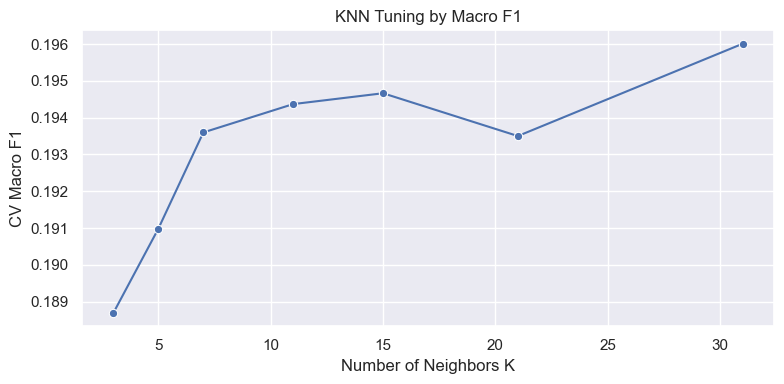

In [150]:
plt.figure(figsize=(8, 4))

sns.lineplot(
    data=knn_tuning_df.sort_values("K"),
    x="K",
    y="CV Macro F1 Mean",
    marker="o"
)

plt.title("KNN Tuning by Macro F1")
plt.xlabel("Number of Neighbors K")
plt.ylabel("CV Macro F1")

plt.tight_layout()
plt.show()

In [151]:
best_k = int(knn_tuning_df.iloc[0]["K"])

best_knn_multi_model = KNeighborsClassifier(
    n_neighbors=best_k,
    weights="distance",
    n_jobs=-1
)

best_knn_multi_model.fit(X_train_multi_scaled, y_train_multi)

knn_multi_results = evaluate_multiclass_model(
    model_name="KNN",
    model=best_knn_multi_model,
    X_train_data=X_train_multi_scaled,
    X_test_data=X_test_multi_scaled,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

print("Best K:", best_k)

knn_multi_results

Best K: 31


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,KNN,1.0,0.215,1.0,0.1962,0.215,0.206,0.0,1.9739


In [152]:
knn_class_report = get_multiclass_class_report(
    model=best_knn_multi_model,
    X_data=X_test_multi_scaled,
    y_data=y_test_multi
)

knn_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1965,0.1674,0.1808,1786.0
EDUCATION,0.2405,0.3309,0.2785,2288.0
HOMEIMPROVEMENT,0.1782,0.0778,0.1083,1196.0
MEDICAL,0.2234,0.3088,0.2592,2137.0
PERSONAL,0.1908,0.1520,0.1692,1888.0
VENTURE,0.2015,0.1648,0.1813,1954.0


Multiclass Decision Tree

In [153]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

decision_tree_params = {
    "max_depth": [3, 5, 7, 10, None],
    "min_samples_leaf": [1, 5, 10, 20],
    "criterion": ["gini", "entropy"]
}

decision_tree_grid = GridSearchCV(
    estimator=DecisionTreeClassifier(
        class_weight="balanced",
        random_state=42
    ),
    param_grid=decision_tree_params,
    scoring="f1_macro",
    cv=3,
    n_jobs=-1
)

decision_tree_grid.fit(X_train_multi, y_train_multi)

print("Best parameters:")
print(decision_tree_grid.best_params_)

print("\nBest CV Macro F1:")
print(round(decision_tree_grid.best_score_, 4))

Best parameters:
{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 20}

Best CV Macro F1:
0.2011


In [154]:
best_decision_tree_multi_model = decision_tree_grid.best_estimator_

decision_tree_multi_results = evaluate_multiclass_model(
    model_name="Decision Tree",
    model=best_decision_tree_multi_model,
    X_train_data=X_train_multi,
    X_test_data=X_test_multi,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

decision_tree_multi_results

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Decision Tree,0.401,0.2062,0.4014,0.2059,0.2062,0.2054,1.4453,3.9877


In [155]:
decision_tree_class_report = get_multiclass_class_report(
    model=best_decision_tree_multi_model,
    X_data=X_test_multi,
    y_data=y_test_multi
)

decision_tree_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1850,0.2184,0.2003,1786.0
EDUCATION,0.2680,0.1980,0.2278,2288.0
HOMEIMPROVEMENT,0.1719,0.3403,0.2284,1196.0
MEDICAL,0.2401,0.1876,0.2107,2137.0
PERSONAL,0.1841,0.1732,0.1785,1888.0
VENTURE,0.2083,0.1745,0.1899,1954.0


In [156]:
current_multiclass_results_df = pd.DataFrame(multiclass_final_results)

current_multiclass_results_df = current_multiclass_results_df.sort_values(
    by="Test Macro F1",
    ascending=False
)

current_multiclass_results_df.round(4)

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
2,Logistic Regression OVR,0.2215,0.2315,0.2051,0.2136,0.2315,0.2167,1.7539,1.7531
3,Logistic Regression Multinomial,0.2218,0.2290,0.2039,0.2096,0.2290,0.2124,1.7515,1.7501
5,Decision Tree,0.4010,0.2062,0.4014,0.2059,0.2062,0.2054,1.4453,3.9877
4,KNN,1.0000,0.2150,1.0000,0.1962,0.2150,0.2060,0.0000,1.9739
1,Linear SVM,0.2415,0.2413,0.1864,0.1814,0.2413,0.1984,1.7352,1.7341
0,Dummy Baseline,0.2034,0.2034,0.0563,0.0563,0.2034,0.0688,28.7129,28.7125


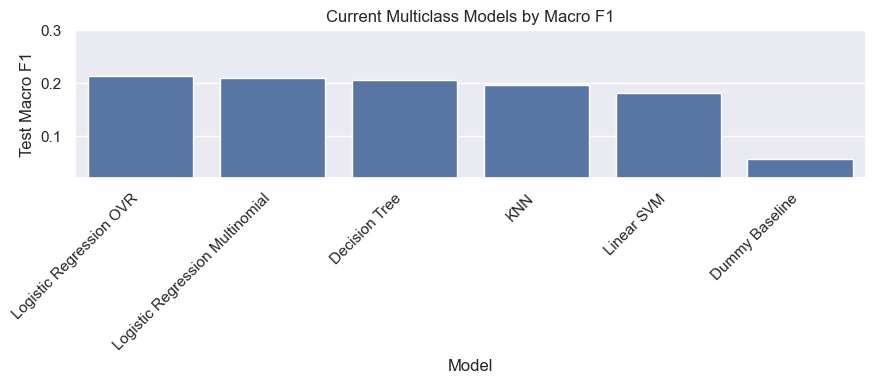

In [157]:
plt.figure(figsize=(9, 4))

sns.barplot(
    data=current_multiclass_results_df,
    x="Model",
    y="Test Macro F1"
)

plt.title("Current Multiclass Models by Macro F1")
plt.xlabel("Model")
plt.ylabel("Test Macro F1")
plt.xticks(rotation=45, ha="right")

plt.ylim(0.02, 0.3)

plt.tight_layout()
plt.show()

KNN does not have coefficients or feature importance.
Dummy Baseline does not have coefficients or feature importance.


Model,Decision Tree,Linear SVM,Logistic Regression Multinomial,Logistic Regression OVR,Mean Importance
Feature,,,,,
person_home_ownership_OWN,0.0149,0.0736,0.0922,0.0938,0.0686
home_ownership_income_capacity,0.1007,0.0444,0.0581,0.0592,0.0656
person_home_ownership_OTHER,0.0000,0.0652,0.0694,0.0743,0.0522
loan_cost_credit_interaction,0.0280,0.0711,0.0395,0.0445,0.0458
person_home_ownership_RENT,0.0010,0.0522,0.0607,0.0568,0.0427
loan_percent_income_per_credit_score,0.0227,0.0671,0.0350,0.0388,0.0409
loan_percent_income,0.0007,0.0592,0.0390,0.0436,0.0356
person_home_ownership_MORTGAGE,0.0007,0.0390,0.0477,0.0516,0.0348
income_credit_capacity,0.0549,0.0255,0.0182,0.0171,0.0289


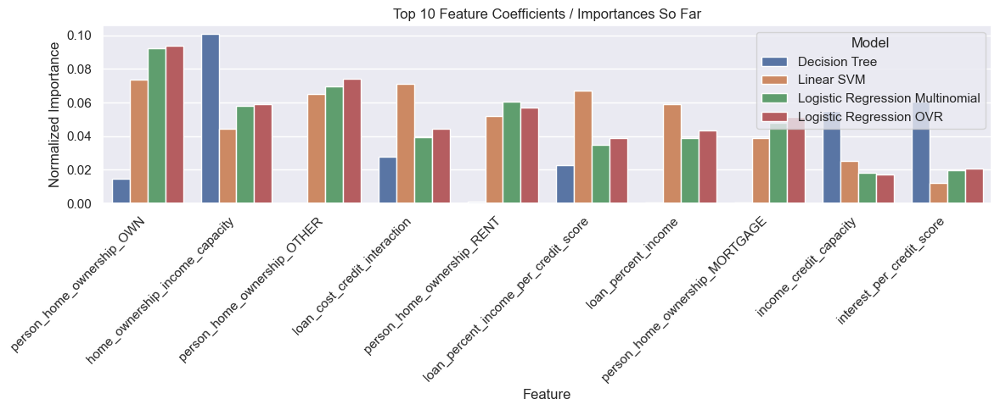

In [158]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def extract_model_importance(model):
    if hasattr(model, "coef_"):
        return np.mean(np.abs(model.coef_), axis=0)
    
    if hasattr(model, "feature_importances_"):
        return model.feature_importances_
    
    if hasattr(model, "estimators_"):
        coef_list = []
        
        for estimator in model.estimators_:
            if hasattr(estimator, "coef_"):
                coef_list.append(np.abs(estimator.coef_).ravel())
        
        if len(coef_list) > 0:
            return np.mean(coef_list, axis=0)
    
    if hasattr(model, "calibrated_classifiers_"):
        coef_list = []
        
        for calibrated_model in model.calibrated_classifiers_:
            base_model = None
            
            if hasattr(calibrated_model, "estimator"):
                base_model = calibrated_model.estimator
            elif hasattr(calibrated_model, "base_estimator"):
                base_model = calibrated_model.base_estimator
            
            if base_model is not None and hasattr(base_model, "coef_"):
                coef_list.append(np.mean(np.abs(base_model.coef_), axis=0))
        
        if len(coef_list) > 0:
            return np.mean(coef_list, axis=0)
    
    return None


candidate_models_so_far = {
    "Linear SVM": "svm_multi_model",
    "Logistic Regression OVR": "log_reg_ovr_multi_model",
    "Logistic Regression Multinomial": "log_reg_multinomial_model",
    "Decision Tree": "best_decision_tree_multi_model",
    "KNN": "best_knn_multi_model",
    "Dummy Baseline": "dummy_multi_model"
}

feature_names_for_importance = X_train_multi.columns

all_importance_rows = []

for model_name, variable_name in candidate_models_so_far.items():
    if variable_name in globals():
        model = globals()[variable_name]
        importance_values = extract_model_importance(model)
        
        if importance_values is None:
            print(model_name, "does not have coefficients or feature importance.")
            continue
        
        importance_values = np.asarray(importance_values).ravel()
        
        if len(importance_values) != len(feature_names_for_importance):
            print(model_name, "was skipped because feature length does not match.")
            continue
        
        importance_sum = importance_values.sum()
        
        if importance_sum > 0:
            normalized_importance = importance_values / importance_sum
        else:
            normalized_importance = importance_values
        
        model_importance_df = pd.DataFrame({
            "Model": model_name,
            "Feature": feature_names_for_importance,
            "Normalized Importance": normalized_importance
        })
        
        all_importance_rows.append(model_importance_df)

if len(all_importance_rows) > 0:
    importance_comparison_df = pd.concat(all_importance_rows, ignore_index=True)
    
    importance_pivot_df = importance_comparison_df.pivot_table(
        index="Feature",
        columns="Model",
        values="Normalized Importance",
        fill_value=0
    )
    
    importance_pivot_df["Mean Importance"] = importance_pivot_df.mean(axis=1)
    
    top_10_importance_comparison = importance_pivot_df.sort_values(
        by="Mean Importance",
        ascending=False
    ).head(10)
    
    display(top_10_importance_comparison.round(4))
    
    plot_importance_df = top_10_importance_comparison.drop(
        columns=["Mean Importance"]
    ).reset_index()
    
    plot_importance_df = plot_importance_df.melt(
        id_vars="Feature",
        var_name="Model",
        value_name="Normalized Importance"
    )
    
    plt.figure(figsize=(12, 5))
    
    sns.barplot(
        data=plot_importance_df,
        x="Feature",
        y="Normalized Importance",
        hue="Model"
    )
    
    plt.title("Top 10 Feature Coefficients / Importances So Far")
    plt.xlabel("Feature")
    plt.ylabel("Normalized Importance")
    plt.xticks(rotation=45, ha="right")
    
    plt.tight_layout()
    plt.show()
else:
    print("No coefficient or feature importance was available.")

Boosting Models

In [160]:
#Helper Functions for Hyperparameter Tables
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    log_loss,
    classification_report
)

multiclass_best_params = {}

def make_1d(predictions):
    return np.asarray(predictions).ravel()


def get_multiclass_log_loss(model, X_data, y_data):
    if hasattr(model, "predict_proba"):
        probabilities = model.predict_proba(X_data)
        return log_loss(y_data, probabilities, labels=class_codes)
    
    return np.nan


def get_train_test_scores(model, X_train_data, X_test_data, y_train_data, y_test_data):
    y_train_pred = make_1d(model.predict(X_train_data))
    y_test_pred = make_1d(model.predict(X_test_data))
    
    scores = {
        "Train Accuracy": accuracy_score(y_train_data, y_train_pred),
        "Test Accuracy": accuracy_score(y_test_data, y_test_pred),
        "Train Macro F1": f1_score(y_train_data, y_train_pred, average="macro", zero_division=0),
        "Test Macro F1": f1_score(y_test_data, y_test_pred, average="macro", zero_division=0),
        "Train Log Loss": get_multiclass_log_loss(model, X_train_data, y_train_data),
        "Test Log Loss": get_multiclass_log_loss(model, X_test_data, y_test_data)
    }
    
    return scores


def params_to_text(params):
    return ", ".join([str(key) + "=" + str(value) for key, value in params.items()])

In [161]:
#Safer Evaluation Functions
def evaluate_multiclass_model(
    model_name,
    model,
    X_train_data,
    X_test_data,
    y_train_data,
    y_test_data
):
    y_train_pred = make_1d(model.predict(X_train_data))
    y_test_pred = make_1d(model.predict(X_test_data))
    
    result = {
        "Model": model_name,
        "Train Accuracy": accuracy_score(y_train_data, y_train_pred),
        "Test Accuracy": accuracy_score(y_test_data, y_test_pred),
        "Train Macro F1": f1_score(y_train_data, y_train_pred, average="macro", zero_division=0),
        "Test Macro F1": f1_score(y_test_data, y_test_pred, average="macro", zero_division=0),
        "Test Micro F1": f1_score(y_test_data, y_test_pred, average="micro", zero_division=0),
        "Test Weighted F1": f1_score(y_test_data, y_test_pred, average="weighted", zero_division=0),
        "Train Log Loss": get_multiclass_log_loss(model, X_train_data, y_train_data),
        "Test Log Loss": get_multiclass_log_loss(model, X_test_data, y_test_data)
    }
    
    multiclass_final_results.append(result)
    multiclass_best_models[model_name] = model
    
    return pd.DataFrame([result]).round(4)


def get_multiclass_class_report(model, X_data, y_data):
    y_pred = make_1d(model.predict(X_data))
    
    report = classification_report(
        y_data,
        y_pred,
        labels=class_codes,
        target_names=multi_class_names,
        output_dict=True,
        zero_division=0
    )
    
    report_df = pd.DataFrame(report).T
    
    return report_df.loc[
        multi_class_names,
        ["precision", "recall", "f1-score", "support"]
    ].round(4)

In [165]:
try:
    from xgboost import XGBClassifier
    xgboost_available = True
except ImportError:
    xgboost_available = False
    print("XGBoost is not installed.")

try:
    from lightgbm import LGBMClassifier
    lightgbm_available = True
except ImportError:
    lightgbm_available = False
    print("LightGBM is not installed.")

try:
    from catboost import CatBoostClassifier
    catboost_available = True
except ImportError:
    catboost_available = False
    print("CatBoost is not installed.")

print("XGBoost available:", xgboost_available)
print("LightGBM available:", lightgbm_available)
print("CatBoost available:", catboost_available)

XGBoost available: True
LightGBM available: True
CatBoost available: True


XGBoost

In [166]:
xgb_param_list = [
    {"n_estimators": 50, "max_depth": 3, "learning_rate": 0.10},
    {"n_estimators": 100, "max_depth": 3, "learning_rate": 0.10},
    {"n_estimators": 100, "max_depth": 4, "learning_rate": 0.05},
    {"n_estimators": 150, "max_depth": 4, "learning_rate": 0.05}
]

xgb_tuning_results = []
xgb_models_by_config = {}

if xgboost_available:
    for config_id, params in enumerate(xgb_param_list, start=1):
        xgb_model = XGBClassifier(
            objective="multi:softprob",
            num_class=len(multi_class_names),
            eval_metric="mlogloss",
            random_state=42,
            n_jobs=-1,
            verbosity=0,
            **params
        )
        
        xgb_model.fit(X_train_multi, y_train_multi)
        
        scores = get_train_test_scores(
            model=xgb_model,
            X_train_data=X_train_multi,
            X_test_data=X_test_multi,
            y_train_data=y_train_multi,
            y_test_data=y_test_multi
        )
        
        scores["Config ID"] = config_id
        scores["Params"] = params_to_text(params)
        
        xgb_tuning_results.append(scores)
        xgb_models_by_config[config_id] = xgb_model

xgb_tuning_df = pd.DataFrame(xgb_tuning_results)

if len(xgb_tuning_df) > 0:
    xgb_tuning_df = xgb_tuning_df[
        [
            "Config ID",
            "Params",
            "Train Accuracy",
            "Test Accuracy",
            "Train Macro F1",
            "Test Macro F1",
            "Train Log Loss",
            "Test Log Loss"
        ]
    ].sort_values(by="Test Macro F1", ascending=False)

xgb_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
3,4,"n_estimators=150, max_depth=4, learning_rate=0.05",0.3004,0.2515,0.2577,0.2003,1.6650,1.7082
1,2,"n_estimators=100, max_depth=3, learning_rate=0.1",0.2814,0.2531,0.2324,0.1987,1.6837,1.7087
2,3,"n_estimators=100, max_depth=4, learning_rate=0.05",0.2824,0.2490,0.2268,0.1866,1.6828,1.7092
0,1,"n_estimators=50, max_depth=3, learning_rate=0.1",0.2624,0.2484,0.1949,0.1775,1.7026,1.7112


In [167]:
if xgboost_available and len(xgb_tuning_df) > 0:
    best_xgb_config_id = int(xgb_tuning_df.iloc[0]["Config ID"])
    best_xgb_multi_model = xgb_models_by_config[best_xgb_config_id]
    best_xgb_params = xgb_param_list[best_xgb_config_id - 1]
    
    multiclass_best_params["XGBoost"] = best_xgb_params
    
    multiclass_final_results = [
        row for row in multiclass_final_results
        if row["Model"] != "XGBoost"
    ]
    
    xgb_multi_results = evaluate_multiclass_model(
        model_name="XGBoost",
        model=best_xgb_multi_model,
        X_train_data=X_train_multi,
        X_test_data=X_test_multi,
        y_train_data=y_train_multi,
        y_test_data=y_test_multi
    )
    
    print("Best XGBoost parameters:")
    print(best_xgb_params)
    
    display(xgb_multi_results)
else:
    print("XGBoost was skipped.")

Best XGBoost parameters:
{'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.05}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,XGBoost,0.3004,0.2515,0.2577,0.2003,0.2515,0.2163,1.665,1.7082


In [170]:
from IPython.display import display

if xgboost_available and len(xgb_tuning_df) > 0:
    xgb_class_report = get_multiclass_class_report(
        model=best_xgb_multi_model,
        X_data=X_test_multi,
        y_data=y_test_multi
    )
    
    display(xgb_class_report)
else:
    print("XGBoost report is not available.")

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.2283,0.1092,0.1477,1786.0
EDUCATION,0.2610,0.5017,0.3434,2288.0
HOMEIMPROVEMENT,0.2157,0.0460,0.0758,1196.0
MEDICAL,0.2596,0.4450,0.3279,2137.0
PERSONAL,0.2452,0.0678,0.1062,1888.0
VENTURE,0.2264,0.1801,0.2006,1954.0


LightGBM

In [171]:
lgbm_param_list = [
    {"n_estimators": 50, "max_depth": 3, "learning_rate": 0.10, "num_leaves": 15},
    {"n_estimators": 100, "max_depth": 3, "learning_rate": 0.10, "num_leaves": 15},
    {"n_estimators": 100, "max_depth": 5, "learning_rate": 0.05, "num_leaves": 31},
    {"n_estimators": 150, "max_depth": 5, "learning_rate": 0.05, "num_leaves": 31}
]

lgbm_tuning_results = []
lgbm_models_by_config = {}

if lightgbm_available:
    for config_id, params in enumerate(lgbm_param_list, start=1):
        lgbm_model = LGBMClassifier(
            objective="multiclass",
            num_class=len(multi_class_names),
            random_state=42,
            n_jobs=-1,
            verbose=-1,
            **params
        )
        
        lgbm_model.fit(X_train_multi, y_train_multi)
        
        scores = get_train_test_scores(
            model=lgbm_model,
            X_train_data=X_train_multi,
            X_test_data=X_test_multi,
            y_train_data=y_train_multi,
            y_test_data=y_test_multi
        )
        
        scores["Config ID"] = config_id
        scores["Params"] = params_to_text(params)
        
        lgbm_tuning_results.append(scores)
        lgbm_models_by_config[config_id] = lgbm_model

lgbm_tuning_df = pd.DataFrame(lgbm_tuning_results)

if len(lgbm_tuning_df) > 0:
    lgbm_tuning_df = lgbm_tuning_df[
        [
            "Config ID",
            "Params",
            "Train Accuracy",
            "Test Accuracy",
            "Train Macro F1",
            "Test Macro F1",
            "Train Log Loss",
            "Test Log Loss"
        ]
    ].sort_values(by="Test Macro F1", ascending=False)

lgbm_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
3,4,"n_estimators=150, max_depth=5, learning_rate=0...",0.3922,0.2548,0.3741,0.2173,1.5775,1.7091
2,3,"n_estimators=100, max_depth=5, learning_rate=0...",0.3508,0.2545,0.3226,0.2121,1.6182,1.7084
1,2,"n_estimators=100, max_depth=3, learning_rate=0...",0.3008,0.2518,0.2654,0.2081,1.6617,1.7088
0,1,"n_estimators=50, max_depth=3, learning_rate=0....",0.2739,0.2502,0.2218,0.1915,1.6890,1.7098


In [172]:
if lightgbm_available and len(lgbm_tuning_df) > 0:
    best_lgbm_config_id = int(lgbm_tuning_df.iloc[0]["Config ID"])
    best_lgbm_multi_model = lgbm_models_by_config[best_lgbm_config_id]
    best_lgbm_params = lgbm_param_list[best_lgbm_config_id - 1]
    
    multiclass_best_params["LightGBM"] = best_lgbm_params
    
    multiclass_final_results = [
        row for row in multiclass_final_results
        if row["Model"] != "LightGBM"
    ]
    
    lgbm_multi_results = evaluate_multiclass_model(
        model_name="LightGBM",
        model=best_lgbm_multi_model,
        X_train_data=X_train_multi,
        X_test_data=X_test_multi,
        y_train_data=y_train_multi,
        y_test_data=y_test_multi
    )
    
    print("Best LightGBM parameters:")
    print(best_lgbm_params)
    
    display(lgbm_multi_results)
else:
    print("LightGBM was skipped.")

Best LightGBM parameters:
{'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.05, 'num_leaves': 31}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,LightGBM,0.3922,0.2548,0.3741,0.2173,0.2548,0.2308,1.5775,1.7091


In [173]:
from IPython.display import display

if lightgbm_available and len(lgbm_tuning_df) > 0:
    lgbm_class_report = get_multiclass_class_report(
        model=best_lgbm_multi_model,
        X_data=X_test_multi,
        y_data=y_test_multi
    )
    
    display(lgbm_class_report)
else:
    print("LightGBM report is not available.")

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.2155,0.1153,0.1503,1786.0
EDUCATION,0.2761,0.4764,0.3496,2288.0
HOMEIMPROVEMENT,0.1955,0.0878,0.1212,1196.0
MEDICAL,0.2627,0.4188,0.3229,2137.0
PERSONAL,0.2447,0.1155,0.1569,1888.0
VENTURE,0.2331,0.1801,0.2032,1954.0


AdaBoost

In [174]:
from sklearn.ensemble import AdaBoostClassifier

ada_param_list = [
    {"n_estimators": 50, "learning_rate": 0.50},
    {"n_estimators": 100, "learning_rate": 0.50},
    {"n_estimators": 100, "learning_rate": 1.00},
    {"n_estimators": 150, "learning_rate": 0.50}
]

ada_tuning_results = []
ada_models_by_config = {}

for config_id, params in enumerate(ada_param_list, start=1):
    ada_model = AdaBoostClassifier(
        random_state=42,
        **params
    )
    
    ada_model.fit(X_train_multi, y_train_multi)
    
    scores = get_train_test_scores(
        model=ada_model,
        X_train_data=X_train_multi,
        X_test_data=X_test_multi,
        y_train_data=y_train_multi,
        y_test_data=y_test_multi
    )
    
    scores["Config ID"] = config_id
    scores["Params"] = params_to_text(params)
    
    ada_tuning_results.append(scores)
    ada_models_by_config[config_id] = ada_model

ada_tuning_df = pd.DataFrame(ada_tuning_results)

ada_tuning_df = ada_tuning_df[
    [
        "Config ID",
        "Params",
        "Train Accuracy",
        "Test Accuracy",
        "Train Macro F1",
        "Test Macro F1",
        "Train Log Loss",
        "Test Log Loss"
    ]
].sort_values(by="Test Macro F1", ascending=False)

ada_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
2,3,"n_estimators=100, learning_rate=1.0",0.2391,0.2433,0.1628,0.1651,1.7889,1.7888
3,4,"n_estimators=150, learning_rate=0.5",0.2300,0.2351,0.1272,0.1313,1.7885,1.7883
1,2,"n_estimators=100, learning_rate=0.5",0.2293,0.2336,0.1241,0.1280,1.7880,1.7878
0,1,"n_estimators=50, learning_rate=0.5",0.2293,0.2336,0.1241,0.1280,1.7870,1.7868


In [175]:
best_ada_config_id = int(ada_tuning_df.iloc[0]["Config ID"])
best_ada_multi_model = ada_models_by_config[best_ada_config_id]
best_ada_params = ada_param_list[best_ada_config_id - 1]

multiclass_best_params["AdaBoost"] = best_ada_params

multiclass_final_results = [
    row for row in multiclass_final_results
    if row["Model"] != "AdaBoost"
]

ada_multi_results = evaluate_multiclass_model(
    model_name="AdaBoost",
    model=best_ada_multi_model,
    X_train_data=X_train_multi,
    X_test_data=X_test_multi,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

print("Best AdaBoost parameters:")
print(best_ada_params)

ada_multi_results

Best AdaBoost parameters:
{'n_estimators': 100, 'learning_rate': 1.0}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,AdaBoost,0.2391,0.2433,0.1628,0.1651,0.2433,0.185,1.7889,1.7888


In [176]:
ada_class_report = get_multiclass_class_report(
    model=best_ada_multi_model,
    X_data=X_test_multi,
    y_data=y_test_multi
)

display(ada_class_report)

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1938,0.1260,0.1527,1786.0
EDUCATION,0.2387,0.5909,0.3401,2288.0
HOMEIMPROVEMENT,0.0000,0.0000,0.0000,1196.0
MEDICAL,0.2573,0.4422,0.3253,2137.0
PERSONAL,0.2566,0.0154,0.0290,1888.0
VENTURE,0.2911,0.0952,0.1435,1954.0


CatBoost

In [177]:
cat_param_list = [
    {"iterations": 100, "depth": 4, "learning_rate": 0.10},
    {"iterations": 150, "depth": 4, "learning_rate": 0.10},
    {"iterations": 150, "depth": 6, "learning_rate": 0.05},
    {"iterations": 200, "depth": 6, "learning_rate": 0.05}
]

cat_tuning_results = []
cat_models_by_config = {}

if catboost_available:
    for config_id, params in enumerate(cat_param_list, start=1):
        cat_model = CatBoostClassifier(
            loss_function="MultiClass",
            eval_metric="MultiClass",
            random_seed=42,
            verbose=False,
            allow_writing_files=False,
            thread_count=-1,
            **params
        )
        
        cat_model.fit(X_train_multi, y_train_multi)
        
        scores = get_train_test_scores(
            model=cat_model,
            X_train_data=X_train_multi,
            X_test_data=X_test_multi,
            y_train_data=y_train_multi,
            y_test_data=y_test_multi
        )
        
        scores["Config ID"] = config_id
        scores["Params"] = params_to_text(params)
        
        cat_tuning_results.append(scores)
        cat_models_by_config[config_id] = cat_model

cat_tuning_df = pd.DataFrame(cat_tuning_results)

if len(cat_tuning_df) > 0:
    cat_tuning_df = cat_tuning_df[
        [
            "Config ID",
            "Params",
            "Train Accuracy",
            "Test Accuracy",
            "Train Macro F1",
            "Test Macro F1",
            "Train Log Loss",
            "Test Log Loss"
        ]
    ].sort_values(by="Test Macro F1", ascending=False)

cat_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
1,2,"iterations=150, depth=4, learning_rate=0.1",0.2679,0.2491,0.2210,0.1974,1.6991,1.7161
3,4,"iterations=200, depth=6, learning_rate=0.05",0.2900,0.2479,0.2469,0.1970,1.6804,1.7162
2,3,"iterations=150, depth=6, learning_rate=0.05",0.2782,0.2471,0.2289,0.1908,1.6910,1.7174
0,1,"iterations=100, depth=4, learning_rate=0.1",0.2592,0.2486,0.2052,0.1902,1.7093,1.7184


In [178]:
if catboost_available and len(cat_tuning_df) > 0:
    best_cat_config_id = int(cat_tuning_df.iloc[0]["Config ID"])
    best_cat_multi_model = cat_models_by_config[best_cat_config_id]
    best_cat_params = cat_param_list[best_cat_config_id - 1]
    
    multiclass_best_params["CatBoost"] = best_cat_params
    
    multiclass_final_results = [
        row for row in multiclass_final_results
        if row["Model"] != "CatBoost"
    ]
    
    cat_multi_results = evaluate_multiclass_model(
        model_name="CatBoost",
        model=best_cat_multi_model,
        X_train_data=X_train_multi,
        X_test_data=X_test_multi,
        y_train_data=y_train_multi,
        y_test_data=y_test_multi
    )
    
    print("Best CatBoost parameters:")
    print(best_cat_params)
    
    display(cat_multi_results)
else:
    print("CatBoost was skipped.")

Best CatBoost parameters:
{'iterations': 150, 'depth': 4, 'learning_rate': 0.1}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,CatBoost,0.2679,0.2491,0.221,0.1974,0.2491,0.2138,1.6991,1.7161


In [179]:
from IPython.display import display

if catboost_available and len(cat_tuning_df) > 0:
    cat_class_report = get_multiclass_class_report(
        model=best_cat_multi_model,
        X_data=X_test_multi,
        y_data=y_test_multi
    )
    
    display(cat_class_report)
else:
    print("CatBoost report is not available.")

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.2079,0.1058,0.1403,1786.0
EDUCATION,0.2639,0.4939,0.3440,2288.0
HOMEIMPROVEMENT,0.2155,0.0418,0.0700,1196.0
MEDICAL,0.2537,0.4469,0.3237,2137.0
PERSONAL,0.2361,0.0673,0.1047,1888.0
VENTURE,0.2303,0.1796,0.2018,1954.0


Optional Model 1: Random Forest

In [180]:
from sklearn.ensemble import RandomForestClassifier

rf_param_list = [
    {"n_estimators": 100, "max_depth": None, "min_samples_leaf": 1, "max_features": "sqrt"},
    {"n_estimators": 150, "max_depth": 10, "min_samples_leaf": 1, "max_features": "sqrt"},
    {"n_estimators": 150, "max_depth": 15, "min_samples_leaf": 5, "max_features": "sqrt"},
    {"n_estimators": 200, "max_depth": None, "min_samples_leaf": 5, "max_features": "sqrt"}
]

rf_tuning_results = []
rf_models_by_config = {}

for config_id, params in enumerate(rf_param_list, start=1):
    rf_model = RandomForestClassifier(
        class_weight="balanced",
        random_state=42,
        n_jobs=-1,
        **params
    )
    
    rf_model.fit(X_train_multi, y_train_multi)
    
    scores = get_train_test_scores(
        model=rf_model,
        X_train_data=X_train_multi,
        X_test_data=X_test_multi,
        y_train_data=y_train_multi,
        y_test_data=y_test_multi
    )
    
    scores["Config ID"] = config_id
    scores["Params"] = params_to_text(params)
    
    rf_tuning_results.append(scores)
    rf_models_by_config[config_id] = rf_model

rf_tuning_df = pd.DataFrame(rf_tuning_results)

rf_tuning_df = rf_tuning_df[
    [
        "Config ID",
        "Params",
        "Train Accuracy",
        "Test Accuracy",
        "Train Macro F1",
        "Test Macro F1",
        "Train Log Loss",
        "Test Log Loss"
    ]
].sort_values(by="Test Macro F1", ascending=False)

rf_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
3,4,"n_estimators=200, max_depth=None, min_samples_...",0.9608,0.2487,0.9609,0.2440,1.0273,1.7170
0,1,"n_estimators=100, max_depth=None, min_samples_...",1.0000,0.2478,1.0000,0.2385,0.3530,1.7726
2,3,"n_estimators=150, max_depth=15, min_samples_le...",0.6623,0.2442,0.6730,0.2319,1.3560,1.7164
1,2,"n_estimators=150, max_depth=10, min_samples_le...",0.3774,0.2402,0.3791,0.2113,1.5809,1.7219


In [181]:
best_rf_config_id = int(rf_tuning_df.iloc[0]["Config ID"])
best_rf_multi_model = rf_models_by_config[best_rf_config_id]
best_rf_params = rf_param_list[best_rf_config_id - 1]

multiclass_best_params["Random Forest"] = best_rf_params

multiclass_final_results = [
    row for row in multiclass_final_results
    if row["Model"] != "Random Forest"
]

rf_multi_results = evaluate_multiclass_model(
    model_name="Random Forest",
    model=best_rf_multi_model,
    X_train_data=X_train_multi,
    X_test_data=X_test_multi,
    y_train_data=y_train_multi,
    y_test_data=y_test_multi
)

print("Best Random Forest parameters:")
print(best_rf_params)

rf_multi_results

Best Random Forest parameters:
{'n_estimators': 200, 'max_depth': None, 'min_samples_leaf': 5, 'max_features': 'sqrt'}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Random Forest,0.9608,0.2487,0.9609,0.244,0.2487,0.2471,1.0273,1.717


In [182]:
rf_class_report = get_multiclass_class_report(
    model=best_rf_multi_model,
    X_data=X_test_multi,
    y_data=y_test_multi
)

rf_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.2136,0.2044,0.2089,1786.0
EDUCATION,0.3073,0.2955,0.3012,2288.0
HOMEIMPROVEMENT,0.1909,0.3470,0.2463,1196.0
MEDICAL,0.2827,0.2962,0.2893,2137.0
PERSONAL,0.2326,0.1732,0.1985,1888.0
VENTURE,0.2512,0.1955,0.2199,1954.0


Optional Model 2: Kernel SVM with OVO

In [183]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

svm_ovo_sample_size = 6000

if len(X_train_multi_scaled) > svm_ovo_sample_size:
    X_train_svm_ovo, _, y_train_svm_ovo, _ = train_test_split(
        X_train_multi_scaled,
        y_train_multi,
        train_size=svm_ovo_sample_size,
        random_state=42,
        stratify=y_train_multi
    )
else:
    X_train_svm_ovo = X_train_multi_scaled.copy()
    y_train_svm_ovo = y_train_multi.copy()

print("SVM OVO train sample shape:", X_train_svm_ovo.shape)
print("SVM OVO target sample shape:", y_train_svm_ovo.shape)

SVM OVO train sample shape: (6000, 49)
SVM OVO target sample shape: (6000,)


In [184]:
svm_ovo_param_list = [
    {"C": 0.5, "gamma": "scale"},
    {"C": 1.0, "gamma": "scale"},
    {"C": 2.0, "gamma": "scale"},
    {"C": 1.0, "gamma": 0.01}
]

svm_ovo_tuning_results = []
svm_ovo_models_by_config = {}

for config_id, params in enumerate(svm_ovo_param_list, start=1):
    svm_ovo_model = SVC(
        kernel="rbf",
        decision_function_shape="ovo",
        probability=True,
        class_weight="balanced",
        random_state=42,
        **params
    )
    
    svm_ovo_model.fit(X_train_svm_ovo, y_train_svm_ovo)
    
    scores = get_train_test_scores(
        model=svm_ovo_model,
        X_train_data=X_train_svm_ovo,
        X_test_data=X_test_multi_scaled,
        y_train_data=y_train_svm_ovo,
        y_test_data=y_test_multi
    )
    
    scores["Config ID"] = config_id
    scores["Params"] = params_to_text(params)
    
    svm_ovo_tuning_results.append(scores)
    svm_ovo_models_by_config[config_id] = svm_ovo_model

svm_ovo_tuning_df = pd.DataFrame(svm_ovo_tuning_results)

svm_ovo_tuning_df = svm_ovo_tuning_df[
    [
        "Config ID",
        "Params",
        "Train Accuracy",
        "Test Accuracy",
        "Train Macro F1",
        "Test Macro F1",
        "Train Log Loss",
        "Test Log Loss"
    ]
].sort_values(by="Test Macro F1", ascending=False)

svm_ovo_tuning_df.round(4)

,Config ID,Params,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Train Log Loss,Test Log Loss
2,3,"C=2.0, gamma=scale",0.3645,0.2187,0.3616,0.2110,1.6695,1.7441
1,2,"C=1.0, gamma=scale",0.3205,0.2206,0.3147,0.2098,1.6850,1.7420
0,1,"C=0.5, gamma=scale",0.2918,0.2201,0.2786,0.2036,1.7021,1.7423
3,4,"C=1.0, gamma=0.01",0.2587,0.2254,0.2387,0.2022,1.7162,1.7405


In [185]:
best_svm_ovo_config_id = int(svm_ovo_tuning_df.iloc[0]["Config ID"])
best_svm_ovo_multi_model = svm_ovo_models_by_config[best_svm_ovo_config_id]
best_svm_ovo_params = svm_ovo_param_list[best_svm_ovo_config_id - 1].copy()

best_svm_ovo_params["train_sample_size"] = len(X_train_svm_ovo)

multiclass_best_params["Kernel SVM OVO"] = best_svm_ovo_params

multiclass_final_results = [
    row for row in multiclass_final_results
    if row["Model"] != "Kernel SVM OVO"
]

svm_ovo_multi_results = evaluate_multiclass_model(
    model_name="Kernel SVM OVO",
    model=best_svm_ovo_multi_model,
    X_train_data=X_train_svm_ovo,
    X_test_data=X_test_multi_scaled,
    y_train_data=y_train_svm_ovo,
    y_test_data=y_test_multi
)

print("Best Kernel SVM OVO parameters:")
print(best_svm_ovo_params)

svm_ovo_multi_results

Best Kernel SVM OVO parameters:
{'C': 2.0, 'gamma': 'scale', 'train_sample_size': 6000}


,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss
0,Kernel SVM OVO,0.3645,0.2187,0.3616,0.211,0.2187,0.2134,1.6695,1.7441


In [186]:
svm_ovo_class_report = get_multiclass_class_report(
    model=best_svm_ovo_multi_model,
    X_data=X_test_multi_scaled,
    y_data=y_test_multi
)

svm_ovo_class_report

,precision,recall,f1-score,support
DEBTCONSOLIDATION,0.1932,0.1842,0.1886,1786.0
EDUCATION,0.2871,0.3024,0.2946,2288.0
HOMEIMPROVEMENT,0.1588,0.4097,0.2289,1196.0
MEDICAL,0.2639,0.2181,0.2388,2137.0
PERSONAL,0.2096,0.1208,0.1532,1888.0
VENTURE,0.2132,0.1305,0.1619,1954.0


Final Model Comparison

Now we compare all models.

In [187]:
try:
    multiclass_best_params["KNN"] = {
        "n_neighbors": best_k,
        "weights": "distance"
    }
except NameError:
    pass

try:
    multiclass_best_params["Decision Tree"] = decision_tree_grid.best_params_
except NameError:
    pass

multiclass_best_params["Logistic Regression OVR"] = {
    "C": 1.0,
    "class_weight": "balanced"
}

multiclass_best_params["Logistic Regression Multinomial"] = {
    "C": 1.0,
    "class_weight": "balanced"
}

multiclass_best_params["Linear SVM"] = {
    "C": 1.0,
    "class_weight": "balanced"
}

In [188]:
final_multiclass_results_df = pd.DataFrame(multiclass_final_results)

final_multiclass_results_df = final_multiclass_results_df.drop_duplicates(
    subset="Model",
    keep="last"
)

final_multiclass_results_df["Best Params"] = final_multiclass_results_df["Model"].apply(
    lambda model_name: params_to_text(multiclass_best_params.get(model_name, {}))
)

final_multiclass_results_df = final_multiclass_results_df.sort_values(
    by="Test Macro F1",
    ascending=False
)

final_multiclass_results_df.round(4)

,Model,Train Accuracy,Test Accuracy,Train Macro F1,Test Macro F1,Test Micro F1,Test Weighted F1,Train Log Loss,Test Log Loss,Best Params
10,Random Forest,0.9608,0.2487,0.9609,0.2440,0.2487,0.2471,1.0273,1.7170,"n_estimators=200, max_depth=None, min_samples_..."
7,LightGBM,0.3922,0.2548,0.3741,0.2173,0.2548,0.2308,1.5775,1.7091,"n_estimators=150, max_depth=5, learning_rate=0..."
2,Logistic Regression OVR,0.2215,0.2315,0.2051,0.2136,0.2315,0.2167,1.7539,1.7531,"C=1.0, class_weight=balanced"
11,Kernel SVM OVO,0.3645,0.2187,0.3616,0.2110,0.2187,0.2134,1.6695,1.7441,"C=2.0, gamma=scale, train_sample_size=6000"
3,Logistic Regression Multinomial,0.2218,0.2290,0.2039,0.2096,0.2290,0.2124,1.7515,1.7501,"C=1.0, class_weight=balanced"
5,Decision Tree,0.4010,0.2062,0.4014,0.2059,0.2062,0.2054,1.4453,3.9877,"criterion=gini, max_depth=None, min_samples_le..."
6,XGBoost,0.3004,0.2515,0.2577,0.2003,0.2515,0.2163,1.6650,1.7082,"n_estimators=150, max_depth=4, learning_rate=0.05"
9,CatBoost,0.2679,0.2491,0.2210,0.1974,0.2491,0.2138,1.6991,1.7161,"iterations=150, depth=4, learning_rate=0.1"
4,KNN,1.0000,0.2150,1.0000,0.1962,0.2150,0.2060,0.0000,1.9739,"n_neighbors=31, weights=distance"
1,Linear SVM,0.2415,0.2413,0.1864,0.1814,0.2413,0.1984,1.7352,1.7341,"C=1.0, class_weight=balanced"


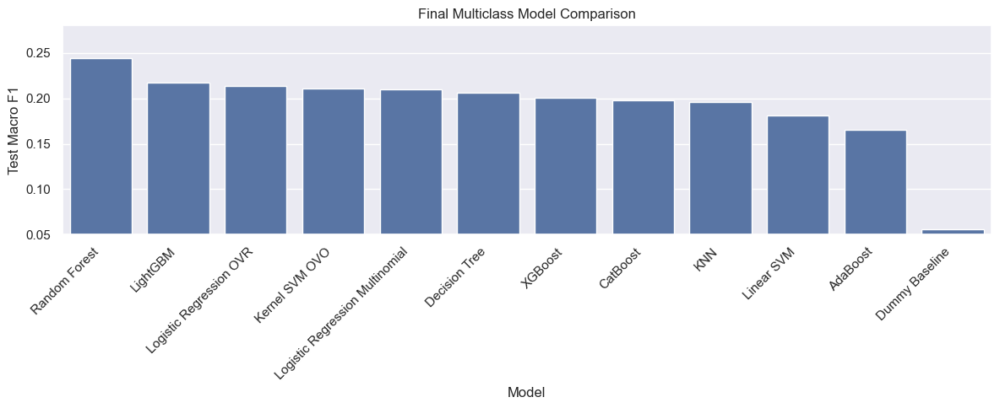

In [190]:
plt.figure(figsize=(12, 5))

sns.barplot(
    data=final_multiclass_results_df,
    x="Model",
    y="Test Macro F1"
)

plt.title("Final Multiclass Model Comparison")
plt.xlabel("Model")
plt.ylabel("Test Macro F1")
plt.xticks(rotation=45, ha="right")

y_min = final_multiclass_results_df["Test Macro F1"].min()
y_max = final_multiclass_results_df["Test Macro F1"].max()

plt.ylim(
    0.05,
    0.28
)

plt.tight_layout()
plt.show()

Discussion Questions

1. Best metric for this dataset

The best main metric is Macro F1.

Accuracy is easy to read, but it can hide weak classes.  
Macro F1 gives the same weight to each class.  
This is useful because all loan intent classes are important.

Weighted F1 is also useful, but it gives more weight to larger classes.  
Log Loss is useful when we want to check predicted probabilities.

So, I use Macro F1 as the main metric and Log Loss as a secondary metric.

2. KNN and Decision Trees for multilabel classification

KNN can be extended to multilabel classification by checking the labels of the nearest neighbors.

For example, if many neighbors have label A and label C, the model can predict both labels.  
It can use voting for each label separately.

Decision Trees can also be extended to multilabel classification.

At each leaf, the tree can store the probability of each label.  
Then the model can predict more than one label if their probabilities are high enough.

Another simple way is One-vs-Rest.  
We train one binary model for each label.

3. Best metric for the football multilabel problem

For the football example, I would use Hamming Loss or Hamming Score.

Each player can have more than one label.  
For example, a player can have national team history and also knee injury history.

Exact accuracy is too strict.  
If the model predicts 3 labels correctly and 1 label incorrectly, exact accuracy counts the full sample as wrong.

Hamming-based metrics check each label separately.  
So they are better for this multilabel problem.

I would also report Macro F1 because it shows the performance for all labels equally.

# Challenging Questions (Bonus)

## 1. Bias–Variance Trade-off in Regression Models

Bias and variance are two common sources of model error.

**Bias** means the model is too simple and cannot learn the real pattern.  
For example, Linear Regression may have high bias if the real relation is non-linear.

**Variance** means the model is too sensitive to the training data.  
For example, a very deep Decision Tree may learn noise and perform badly on test data.

A good model should have a balance:
- Low bias: it learns the main pattern.
- Low variance: it also works well on new data.

If train score is low and test score is low, the model may have high bias.  
If train score is very high but test score is low, the model may have high variance.

---

## 2. When Does Kernel Regression Outperform Linear Regression?

Kernel Regression can work better than Linear Regression when the relation between features and target is non-linear.

Linear Regression learns a straight-line relationship.  
Kernel Regression can learn curved and more complex relationships.

Kernel Regression may outperform Linear Regression when:
- The data has non-linear patterns.
- Feature engineering is not enough.
- A simple line cannot explain the target well.
- The dataset is not too large, because kernel methods can be slower.

However, Linear Regression is usually better when the relation is simple and mostly linear.

---

## 3. L1 vs L2 Regularization

Regularization helps reduce overfitting by controlling model coefficients.

### L1 Regularization / LASSO

L1 adds a penalty based on the absolute value of coefficients.

LASSO can make some coefficients exactly zero.  
This means it can remove some features.

LASSO performs better when:
- We have many features.
- Only a small number of features are really useful.
- We want automatic feature selection.
- We want a simpler model.

### L2 Regularization / Ridge

L2 adds a penalty based on the squared value of coefficients.

Ridge makes coefficients smaller, but usually does not make them zero.

Ridge performs better when:
- Many features are useful.
- Features are correlated with each other.
- We want to keep all features but reduce their effect.
- We want a more stable model.

### Why Does LASSO Produce Sparsity?

LASSO uses absolute values in the penalty.  
Because of this shape, the optimization process can push some coefficients exactly to zero.

So, LASSO can create a sparse model.  
Sparse means many coefficients are zero.

---

## 4. Why Is MAPE Unreliable in Some Datasets?

MAPE means Mean Absolute Percentage Error.

MAPE can be unreliable when the real target value is close to zero.

For example, if the true value is 1 and the error is 1, the percentage error is 100%.  
So, very small true values can make MAPE extremely large.

MAPE is also not good when:
- The target has zero values.
- The target has very small values.
- The dataset has many outliers.
- Overprediction and underprediction should not be treated the same.

In these cases, MAE, RMSE, or SMAPE may be better.

---

## 5. Effect of Outliers on Regression Models

Outliers are extreme values that are very different from most data points.

Outliers can strongly affect regression models.

For example, Linear Regression tries to minimize squared error.  
Because errors are squared, large errors become very important.  
So, one outlier can pull the regression line toward itself.

Outliers can:
- Increase MAE and RMSE.
- Make coefficients unstable.
- Reduce model performance.
- Make the model learn noise instead of the real pattern.

Tree-based models are usually more robust to outliers than Linear Regression.  
But even tree-based models can be affected if outliers change important split points.

Possible solutions:
- Remove clear invalid outliers.
- Use log transformation.
- Use robust models.
- Use MAE instead of MSE.
- Cap extreme values with winsorization.

---

## 6. Effect of Class Imbalance on Binary Metrics

Class imbalance means one class has many more samples than the other class.

In binary classification, accuracy can be misleading.

Example:  
If 95% of samples are class 0, a model can predict class 0 for everything.  
The accuracy will be 95%, but the model does not detect class 1 at all.

This is why accuracy is not enough for imbalanced datasets.

Better metrics are:
- Precision
- Recall
- F1-score
- ROC-AUC
- PR-AUC
- Confusion matrix

If the minority class is important, recall and F1-score are usually more useful than accuracy.

---

## 7. How Decision Boundaries of Models Differ

Different models create different decision boundaries.

### Logistic Regression

Logistic Regression creates mostly linear decision boundaries.  
It works well when classes can be separated with a line or plane.

### Linear SVM

Linear SVM also creates a linear boundary.  
It tries to find the boundary with the largest margin between classes.

### Kernel SVM

Kernel SVM can create non-linear decision boundaries.  
It can separate classes with curved shapes.

### KNN

KNN creates very flexible boundaries.  
The boundary depends on the nearest training points.  
It can be very irregular if K is small.

### Decision Tree

Decision Trees create step-like boundaries.  
They split the data using feature thresholds.

### Random Forest and Boosting

Tree-based ensemble models combine many trees.  
Their boundaries can be complex, but usually more stable than one tree.

---

## 8. Effect of K in KNN

K is the number of neighbors used for prediction.

### Small K

Small K makes the model more flexible.

Advantages:
- Can learn local patterns.
- May perform well if the data is clean.

Disadvantages:
- Sensitive to noise.
- Can overfit.
- Decision boundary can be very irregular.

### Large K

Large K makes the model smoother.

Advantages:
- Less sensitive to noise.
- More stable.

Disadvantages:
- Can underfit.
- May ignore local patterns.
- Majority class can dominate the prediction.

So, K should be tuned using validation or cross-validation.

---

## 9. Overfitting in Decision Trees

Decision Trees can overfit easily because they keep splitting the data.

A deep tree can learn very specific rules from the training set.  
Some of these rules may be noise, not real patterns.

### Why Is Max Depth Not Enough?

Max depth limits how deep the tree can grow.  
But it is not the only reason for overfitting.

A tree can still overfit if:
- Leaves have very few samples.
- Splits are too specific.
- There are many noisy features.
- The tree uses weak patterns in the data.

Other useful parameters are:
- `min_samples_leaf`
- `min_samples_split`
- `max_leaf_nodes`
- `ccp_alpha`

### How Pruning Works

Pruning removes parts of the tree that do not improve generalization.

The idea is simple:  
If a branch improves train score but hurts test score, we remove or simplify it.

Pruning makes the tree smaller and more stable.  
It helps reduce overfitting.

---

## 10. Why Are Tree-Based Models Good Feature Selectors?

Tree-based models are good feature selectors because they naturally choose useful features for splitting.

At each split, the tree selects the feature that gives the best separation.

If a feature is useful, it will often be used in important splits.  
If a feature is not useful, it may not be used much.

Tree-based models can also capture:
- Non-linear relations
- Interactions between features
- Important threshold values

Random Forest, XGBoost, LightGBM, and CatBoost can give feature importance scores.  
These scores help us understand which features are more useful.

However, feature importance is not perfect.  
It can be biased toward features with many possible values.

---

## 11. Micro vs Macro vs Weighted F1

F1-score combines precision and recall.

### Macro F1

Macro F1 calculates F1 for each class, then takes the simple average.

It gives the same weight to every class.

Macro F1 is better when:
- All classes are important.
- The dataset is imbalanced.
- We care about minority classes.

### Weighted F1

Weighted F1 calculates F1 for each class, then averages them using class size.

Large classes get more weight.

Weighted F1 can be misleading when:
- The model performs well on large classes.
- The model performs badly on small classes.
- The final score still looks good because large classes dominate it.

### Micro F1

Micro F1 counts all true positives, false positives, and false negatives together.

In multiclass classification, Micro F1 is usually close to accuracy.

Micro F1 favors large classes because large classes create more total examples.  
So, poor performance on small classes may be hidden.

For my multiclass problem, Macro F1 is a better main metric because all loan intent classes are important.

---

## 12. Multi-label vs Multiclass Classification

Multiclass and multi-label classification are different.

### Multiclass Classification

In multiclass classification, each sample belongs to exactly one class.

Example:
A loan can have only one intent:
- EDUCATION
- MEDICAL
- PERSONAL
- VENTURE

The output is one class.

Common loss functions:
- Cross-entropy loss
- Multiclass log loss

Common metrics:
- Accuracy
- Macro F1
- Weighted F1
- Confusion matrix
- Log loss

### Multi-label Classification

In multi-label classification, each sample can belong to more than one class at the same time.

Example:
A football player can have:
- National team history
- Knee injury history
- Captain history

The output is a set of labels.

Common loss functions:
- Binary cross-entropy for each label

Thresholding is important in multi-label classification.  
The model gives a probability for each label.  
Then we choose a threshold, such as 0.5.  
If the probability is above the threshold, we predict that label.

Common metrics:
- Hamming Loss
- Jaccard Score
- Macro F1
- Micro F1
- Precision and Recall per label

### Why KNN Can Be Extended to Multi-label

KNN can look at the labels of nearest neighbors.

If many neighbors have label A and label C, the model can predict both labels.  
So, KNN can vote for each label separately.

### Why Decision Trees Can Be Extended to Multi-label

A Decision Tree can store label probabilities at each leaf.

For each label, the tree can estimate if the label should be predicted or not.  
Then a threshold is used to decide the final labels.

Another simple method is One-vs-Rest.  
We train one binary classifier for each label.

---

## 13. Precision–Recall Trade-off

Precision and recall often have a trade-off.

### Precision

Precision answers this question:

When the model predicts positive, how often is it correct?

High precision means few false positives.

### Recall

Recall answers this question:

From all real positive cases, how many did the model find?

High recall means few false negatives.

### Trade-off

If we lower the classification threshold, the model predicts positive more often.  
This usually increases recall but decreases precision.

If we increase the threshold, the model predicts positive less often.  
This usually increases precision but decreases recall.

The best choice depends on the problem.

For example:
- In disease detection, recall is very important.
- In spam detection, precision may be more important.
- In loan default prediction, both precision and recall can be important.

---

## 14. ROC Curve vs PR Curve

### ROC Curve

ROC curve compares True Positive Rate and False Positive Rate.

It is useful for checking model performance at different thresholds.

ROC-AUC is good when:
- Classes are balanced.
- We want a general view of ranking quality.

### PR Curve

PR curve compares Precision and Recall.

It is more useful when:
- The dataset is imbalanced.
- The positive class is rare.
- False positives and false negatives matter a lot.

In imbalanced datasets, ROC-AUC can look good even when the model is weak on the minority class.  
PR-AUC is usually more honest for rare positive classes.

---

## 15. How I Would Improve the Models with Unlimited Time and Resources

If I had unlimited time and resources, I would improve the project in several ways.

### Better Preprocessing

I would:
- Check missing values more carefully.
- Detect invalid values.
- Treat outliers more carefully.
- Test different scaling methods.
- Use better encoding for categorical features.

### Better Features

I would:
- Create more ratio features.
- Create interaction features.
- Use domain knowledge about loans.
- Test binning for income, credit score, and loan amount.
- Use feature selection methods.

### Better Models

I would:
- Tune hyperparameters with a larger search.
- Use cross-validation more carefully.
- Test stronger ensemble models.
- Try stacking and voting classifiers.
- Use calibration for probability outputs.

### Better Metrics

I would:
- Use Macro F1 as the main metric for multiclass classification.
- Use Log Loss to check probabilities.
- Use PR-AUC for imbalanced binary classification.
- Check per-class precision and recall.
- Analyze confusion matrices more deeply.

### Better Validation

I would:
- Use repeated cross-validation.
- Test the model on a separate holdout set.
- Check if the model is stable across different random seeds.
- Compare train and test results to detect overfitting.

### Better Explainability

I would:
- Use feature importance.
- Use permutation importance.
- Use SHAP values.
- Study which features affect each class the most.

Overall, I would not only try to increase the score.  
I would also try to make the model more stable, explainable, and useful.